### Module 3 Assignment 1: House Prices: Advanced Regression Techniques (Kaggle)
- **Submitted By**: **Pratyush Choudhary**
- **Date** :**11/07/2023**

### Background Materials
This week, you will compete in the  [House Prices Advanced Regression Techniques](https://www.kaggle.com/c/house-prices-advanced-regression-techniques)competition, where you will be predicting ‘SalesPrice’.

### Management/Research Question
In layman’s terms, what is the management/research question of interest, and why would anyone care? 

**This question is significant because it helps individuals and organizations involved in the real estate market make informed decisions and understand the value of a property.**

**Here's why different stakeholders should care about this question:**

- **Homeowners:** Homeowners are interested in understanding how specific features and factors can impact the value of their homes. This knowledge allows them to make informed decisions about renovations, pricing, and future investments in order to maximize the value of their properties.

- **Real Estate Agents:** Real estate agents can provide better service to their clients by having knowledge about the factors that influence house prices. This allows them to give accurate pricing recommendations and insights, helping their clients make informed decisions about buying or selling a home.

- **Property Developers:** Property developers need to understand the relationship between housing features and sale prices in order to make strategic decisions about property design, amenities, and target markets. This knowledge helps them create successful and desirable developments that meet market demand.

- **Policy Makers:** Policy makers can use housing market data to analyze the demand for specific types of housing and identify areas that require revitalization or infrastructure development. By formulating effective policies based on this information, they can address housing needs and ensure a well-functioning housing market.

In short we can say that  understanding the factors that influence housing prices is crucial for various stakeholders as it enables them to make better decisions related to buying, selling, developing, and regulating housing.

### Requirements

1. Conduct your analysis using a cross-validation design.
2. Conduct / improve upon previous EDA.
3. Build models with many variables.
4. Transform and feature engineer as appropriate.
5. Build at a minimum the following regression models.
- Lasso
- Ridge
- ElasticNet
6. Conduct hyperparameter tuning for the ElasticNet.
7. Evaluate performance of the model using the Kaggle metric upon which your scores are evaluated.
8. Submit at least two models to Kaggle.com for evaluation. Provider your Kaggle.com user name and screen snapshots of your Kaggle scores.

#### Conduct / improve upon previous EDA
 For this section: I Have kept the last week analysis (refer the trailing part of this notebook for any reference).
 - On Top, I have analyzed different segments mainly concentrated on categorical features (distributed in different types and assigned them labels ) to know their relevant and impact on our target feature.
 - Dealt with non-numerical features.
 - Handled Missing Values differently.


### Import Library and Load the data

In [117]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec 
from scipy import stats
import seaborn as sns
from scipy.stats import skew
sns.set()
import datetime

import plotly.subplots as sp
import plotly.graph_objects as go

%matplotlib inline
import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
sns.set_style("darkgrid")
plt.style.use("fivethirtyeight")
from sklearn.preprocessing import MinMaxScaler

#regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV,ElasticNet
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

#model selection
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder

#evaluation metrics
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error # for regression

from scipy import stats
from scipy.stats import norm, skew   # specifically for staistics


import warnings
warnings.simplefilter(action='ignore')

In [118]:
train= pd.read_csv("train.csv")
test = pd.read_csv('test.csv')


In [119]:
sample = pd.read_csv("sample_submission.csv")

### Dealing with non-numerical features

In [120]:
u_list = []
for c in train.columns[train.dtypes == 'object']:
    l_ = ", ".join(set(train[c].apply(str).unique()))
    u_list.append(l_)
df_obj = pd.DataFrame(train[train.columns[train.dtypes == 'object']].nunique()
                      , columns = ['unique_cnt'])
df_obj = df_obj.merge(pd.DataFrame(u_list, index = df_obj.index
                                   , columns = ['unique_values'])
                                   , left_index=True, right_index=True)
df_obj['count'] = train[train.columns[train.dtypes == 'object']].count()
df_obj['nulls'] = train[train.columns[train.dtypes == 'object']].isna().sum()/len(train) * 100
df_obj

,unique_cnt,unique_values,count,nulls
MSZoning,5,"C (all), RL, RH, RM, FV",1460,0.000000
Street,2,"Pave, Grvl",1460,0.000000
Alley,2,"nan, Pave, Grvl",91,93.767123
LotShape,4,"IR3, IR2, IR1, Reg",1460,0.000000
LandContour,4,"Lvl, Low, Bnk, HLS",1460,0.000000
Utilities,2,"AllPub, NoSeWa",1460,0.000000
LotConfig,5,"CulDSac, FR2, FR3, Corner, Inside",1460,0.000000
LandSlope,3,"Mod, Gtl, Sev",1460,0.000000
Neighborhood,25,"NoRidge, MeadowV, Gilbert, ClearCr, Blmngtn, T...",1460,0.000000
Condition1,9,"Feedr, PosN, RRNe, RRAn, PosA, RRNn, Artery, N...",1460,0.000000


In [121]:
df=pd.DataFrame(train.isna().sum().sort_values(ascending=False),columns=['missing_values'])

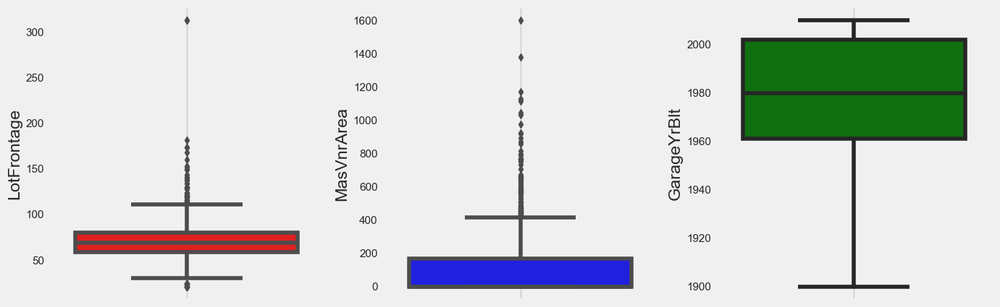

In [122]:

plt.figure(figsize=(15,5))
column=['LotFrontage','MasVnrArea','GarageYrBlt']
temp=train[column]
color=['','red','blue','green']
i=1
for col in column:
  plt.subplot(1,3,i)
  sns.boxplot(data=train,y=col,color=color[i])
  i=i+1
  plt.grid()

#### Hanlde Missing Values

In [123]:
#fill the missing values with median
for col in column:
  train[col].fillna(train[col].median(),inplace=True)
#for test dataset
for col in column:
    test[col].fillna(test[col].median(),inplace=True)

In [124]:
features_to_examine = ['Alley','MasVnrType','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Electrical','FireplaceQu','GarageType','GarageFinish',
 'GarageQual','GarageCond','PoolQC','Fence','MiscFeature']

In [125]:
train[features_to_examine].isna().sum().sort_values(ascending=False)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtExposure      38
BsmtFinType2      38
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
MasVnrType         8
Electrical         1
dtype: int64

In [126]:
print(train['PoolQC'].value_counts())
print(train['MiscFeature'].value_counts())
print(train['Alley'].value_counts())
print(train['Fence'].value_counts())

Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64
Shed    49
Gar2     2
Othr     2
TenC     1
Name: MiscFeature, dtype: int64
Grvl    50
Pave    41
Name: Alley, dtype: int64
MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64


In [127]:
#Dropping columns in both train and test datasets.

train.drop(columns=['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)
test.drop(columns=['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

In [128]:
train['FireplaceQu'].value_counts()

Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [129]:
train[train['FireplaceQu'].isnull()][['Fireplaces','FireplaceQu']]

,Fireplaces,FireplaceQu
0,0,NaN
5,0,NaN
10,0,NaN
12,0,NaN
15,0,NaN
...,...,...
1452,0,NaN
1453,0,NaN
1454,0,NaN
1458,0,NaN


In [130]:
train['FireplaceQu']=train['FireplaceQu'].fillna('NotAvailable')
test['FireplaceQu']=test['FireplaceQu'].fillna('NotAvailable')

In [131]:
#Out of the features to examine , following are left
features_to_examine = ['MasVnrType','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1',
 'BsmtFinType2','Electrical','GarageType','GarageFinish',
 'GarageQual','GarageCond']

In [132]:
train['MasVnrType'].isna().sum()

8

In [133]:
train['MasVnrType'].unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

In [134]:
train[train['MasVnrType'].isnull()][['MasVnrType','MasVnrArea']]

,MasVnrType,MasVnrArea
234,NaN,0.0
529,NaN,0.0
650,NaN,0.0
936,NaN,0.0
973,NaN,0.0
977,NaN,0.0
1243,NaN,0.0
1278,NaN,0.0


In [135]:
train['MasVnrType'].mode()

0    None
Name: MasVnrType, dtype: object

In [136]:
train[['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1',
 'BsmtFinType2']].isna().sum()

BsmtQual        37
BsmtCond        37
BsmtExposure    38
BsmtFinType1    37
BsmtFinType2    38
dtype: int64

In [137]:
train[['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1',
 'BsmtFinType2']].mode()

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
0,TA,TA,No,Unf,Unf


In [138]:
train[['GarageType','GarageFinish','GarageQual','GarageCond']].isna().sum()

GarageType      81
GarageFinish    81
GarageQual      81
GarageCond      81
dtype: int64

**Fill with mode values for below features related to Garage**

In [139]:
train[['GarageType','GarageFinish',
 'GarageQual','GarageCond']].mode()

,GarageType,GarageFinish,GarageQual,GarageCond
0,Attchd,Unf,TA,TA


In [140]:
#We are done with all the categorical features
train['MasVnrType'].fillna('None',inplace=True)
fill_with_No_Bsmt = ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
fill_with_No_Grg = ['GarageType','GarageFinish','GarageQual','GarageCond']
for col in fill_with_No_Bsmt:
    train[col].fillna('No_Bsmt',inplace=True)
    test[col].fillna('No_Bsmt',inplace=True)

for col in fill_with_No_Grg:
    train[col].fillna('No_Grg',inplace=True)
    test[col].fillna('No_Grg',inplace=True)

train['Electrical'].fillna('SBrkr',inplace=True)
test['Electrical'].fillna('SBrkr',inplace=True)

In [141]:
train[['GarageType','GarageFinish','GarageQual','GarageCond']]

,GarageType,GarageFinish,GarageQual,GarageCond
0,Attchd,RFn,TA,TA
1,Attchd,RFn,TA,TA
2,Attchd,RFn,TA,TA
3,Detchd,Unf,TA,TA
4,Attchd,RFn,TA,TA
...,...,...,...,...
1455,Attchd,RFn,TA,TA
1456,Attchd,Unf,TA,TA
1457,Attchd,RFn,TA,TA
1458,Attchd,Unf,TA,TA


In [142]:
train[['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
0,Gd,TA,No,GLQ,Unf
1,Gd,TA,Gd,ALQ,Unf
2,Gd,TA,Mn,GLQ,Unf
3,TA,Gd,No,ALQ,Unf
4,Gd,TA,Av,GLQ,Unf
...,...,...,...,...,...
1455,Gd,TA,No,Unf,Unf
1456,Gd,TA,No,ALQ,Rec
1457,TA,Gd,No,GLQ,Unf
1458,TA,TA,Mn,GLQ,Rec


In [143]:
#Let's check if there any missing values left in train dataset first

train.isna().sum().sum()

0

In [144]:
#Let's check if there any missing values left in train dataset first

df.isna().sum().sum()

0

In [145]:
#Let's check for test dataset

test.isna().sum().sum()

38

In [146]:
df=pd.DataFrame(test.isna().sum().sort_values(ascending=False),columns=['missing_values'])
df=df[df['missing_values']>0]

In [147]:
features_to_examine=df.index.tolist()

In [148]:
test[features_to_examine].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MasVnrType    1443 non-null   object 
 1   MSZoning      1455 non-null   object 
 2   BsmtFullBath  1457 non-null   float64
 3   BsmtHalfBath  1457 non-null   float64
 4   Functional    1457 non-null   object 
 5   Utilities     1457 non-null   object 
 6   KitchenQual   1458 non-null   object 
 7   Exterior2nd   1458 non-null   object 
 8   Exterior1st   1458 non-null   object 
 9   GarageCars    1458 non-null   float64
 10  GarageArea    1458 non-null   float64
 11  BsmtFinSF1    1458 non-null   float64
 12  BsmtFinSF2    1458 non-null   float64
 13  BsmtUnfSF     1458 non-null   float64
 14  TotalBsmtSF   1458 non-null   float64
 15  SaleType      1458 non-null   object 
dtypes: float64(8), object(8)
memory usage: 182.5+ KB


In [149]:
# We fill all the categorical features with mode and numerical features with mean
cat = [col for col in features_to_examine if test[col].dtype=='O']

for feature in cat:
    test[feature] = test[feature].fillna(test[feature].mode()[0])

num = [col for col in features_to_examine if test[col].dtype!='O']

for feature in num:
    test[feature] = test[feature].fillna(test[feature].median())

In [150]:
#Let's check for test dataset

test.isna().sum().sum()

0

### Thus , we are done with missing values in both training and test dataset

**Now we can analyze the rest of the continuous numerical features**

In [35]:
discrete=[]
for col in train.columns:
  if train[col].dtype=='int64' and len(train[col].unique())<=15:
    discrete.append(col)
discrete

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'PoolArea',
 'MoSold',
 'YrSold']

In [36]:
#Here we create a list of all the numerical features in our dataset.
#And we have already separated the discrete features.
#But we separate year features , as we will study them late
num=[]
for col in train.columns:
   if train[col].dtype=='int64' and col not in ['YearBuilt','YearRemodAdd','MoSold','YrSold','GarageYrBlt'] and col not in discrete:
        num.append(col)

In [37]:
print("Numerical Features :: \n\n{}".format(num))

Numerical Features :: 

['Id', 'LotArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'SalePrice']


<Axes: >

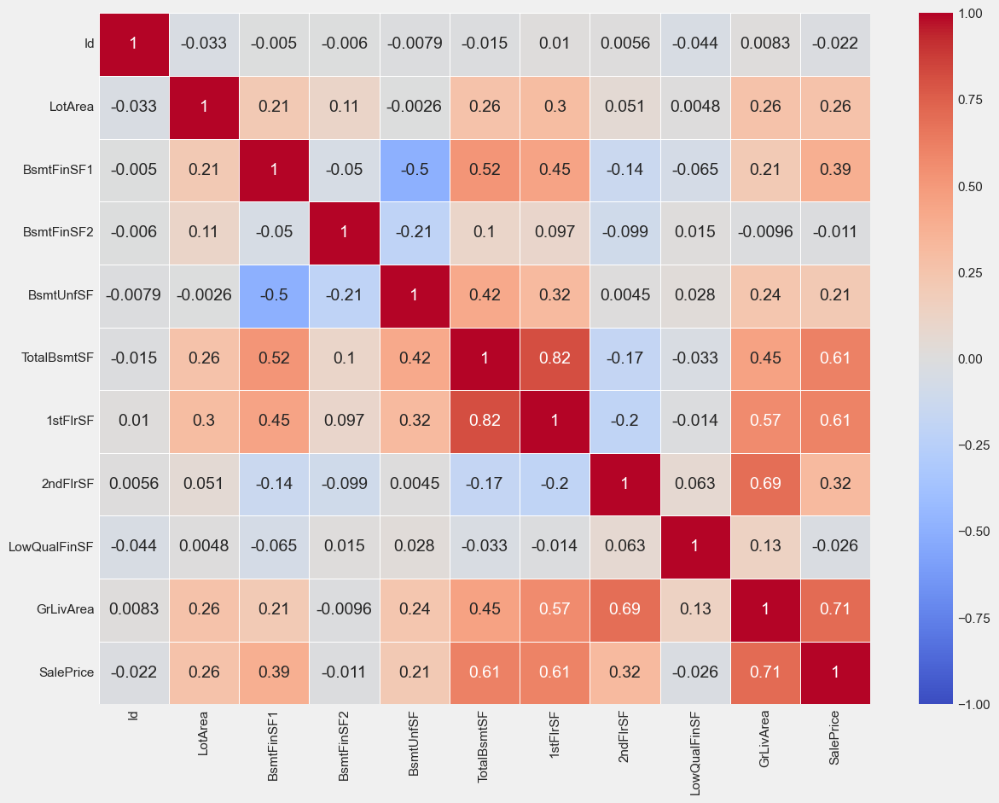

In [38]:
#first ten features
df_corr=train[num].iloc[:,0:10]
df_corr['SalePrice']=train['SalePrice']
corr=df_corr.corr()
fig = plt.figure(figsize=(13,10))
'''
#Here we use cmap CoolWarm as it gives us a better view of postive and negative correlation.
#And with the help of vmin and vmax set to -1 and +1 ,
the features having values closer to +1 have positive correlation and features having values closer to -1 have negative correlation.
'''
sns.heatmap(corr,annot=True,linewidths=.5,cmap='coolwarm',vmin=-1,vmax=1,center=0)

- Among the first 10 numerical features,
- Above Ground Living Area sq ft is having a positive correlation of 0.71 with Sale Price which is obvious.
- Total Basement surface area and first floor surface area also have a positive correlation of 0.61 with Sale Price.
- We also expect LotArea to have a better correlation with Sale Price as increase in LotArea may also increase price of the house.
- We can see two features have negative correlation with SalePrice.
- In the next ten features , Garage Area has a positive correlation of 0.62 with Sale Price.
1. BsmtFinSF2 [-0.011]
2. LowQualFinSF [-0.026]

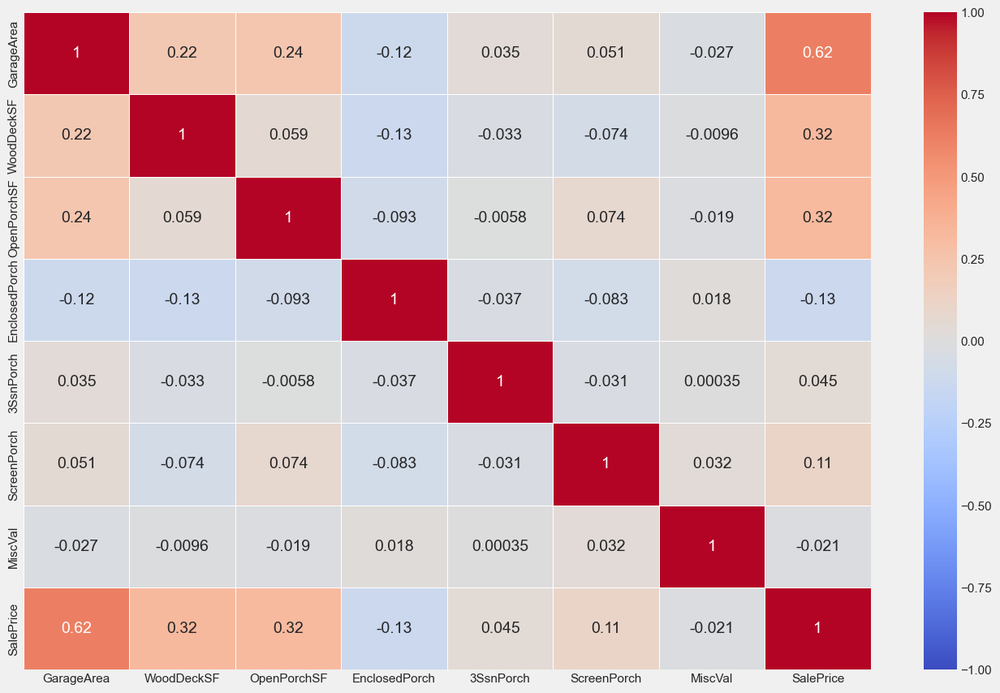

In [39]:
df_corr = train[num].iloc[:,10:]
df_corr['SalePrice'] = train['SalePrice']
corr = df_corr.corr()

fig = plt.figure(figsize=(15,10))
sns.heatmap(corr,annot=True,linewidths=.5,cmap='coolwarm',vmin=-1,vmax=1,center=0);

- FullBath is having a positive correlation of 0.56.
- TotRmsAbvGrd feature has a 0.53 correlation with SalePrice.
- So in numerical features
1) Above Grade Living Area

2) Basement surface area

3) First floor surface area

4) Garage Area

### Categorical Analysis

**From last week analysis ,before going for model I like to analyze more categorical Features and see If we get some valuable insights.**

In [151]:
cat=[]
for col in train.columns:
    if train[col].dtype=='object':
        cat.append(col)

#printing the list
print("Categorical variables :: \n\n{}".format(cat))

Categorical variables :: 

['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


### Category 1 :: Type of dwellings

In [152]:
cat1 = ['MSSubClass']
#Converting integer values of MSSubClass to their respective categorical values given in description.
#Create a copy of the dataset and replace all numeric values with their respective categories.
df_new=train.copy()
df_new['MSSubClass'] = df_new['MSSubClass'].replace({20:'1_STORY_NEWER',
                                                    30:'1_STORY_OLDER',40:'1_STORY_ATTIC',
                                                    45:'1_1/2_UNFINISHED',
                                                    50:'1_1/2_FINISHED',60:'2_STORY_NEWER',
                                                    70:'2_STORY_OLDER',75:'2_1/2_STOPY',
                                                    80:'SPLIT/MULTILEVEL',85:'SPLIT_FOYER',
                                                    90:'DUPLEX',120:'1_STORY_PUD',
                                                    150:'1_1/2_STORY_PUD',
                                                    160:'2_STORY_PUD',
                                                    180:'PUD_MULTILEVEL',
                                                    190:'2_FAMILY_CONVERSION'})
#Covert to object
df_new['MSSubClass'] = df_new['MSSubClass'].astype(object)

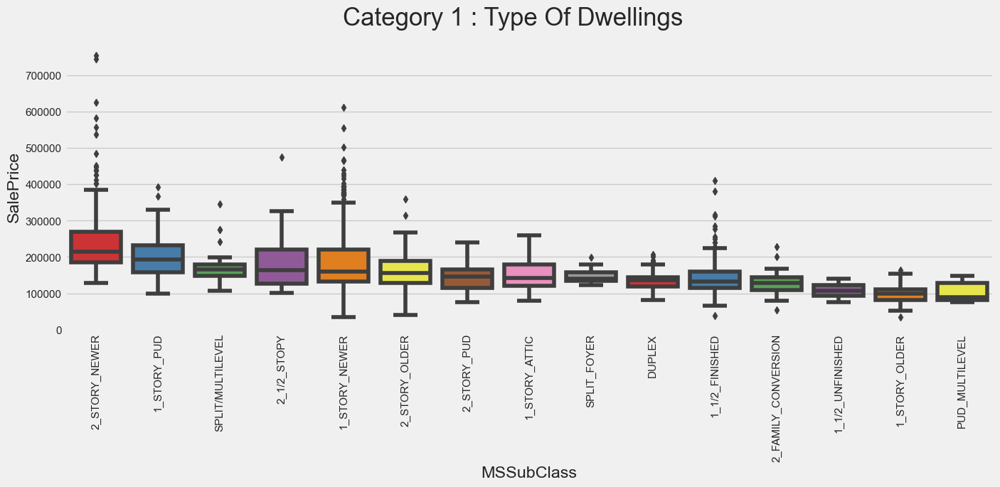

In [153]:
fig=plt.figure(figsize=(15,5))
table = df_new.groupby(['MSSubClass'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
ax=sns.boxplot(data=df_new,x='MSSubClass',y='SalePrice',order=table['MSSubClass'].to_list(),palette='Set1')
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
fig.suptitle("Category 1 : Type Of Dwellings",fontsize=25);

- note : the boxplot of all features are plotted in descending order with respect to their median sale price The features to the left have higher sale price than and the features to the left lower sale price.

- In MSSubClass , The Newer 2-STORY and 1-Story PUDs have on average higher sale price than the others.

- There are outliers present in newer sub classes and the one's on the left.

- We can also see there is some non-uniformity in the sub classes by looking at the size of the boxplot.

In [43]:
#This table tells us the count of the above feature in the dataset and calculates average Sale price.
table=df_new.groupby(['MSSubClass'])['MSSubClass','SalePrice'].agg({"MSSubClass" : 'count','SalePrice': 'median' }).sort_values(by ='SalePrice', ascending=False)
table.style.background_gradient(cmap="Reds")

,MSSubClass,SalePrice
MSSubClass,,
2_STORY_NEWER,299,215200.000000
1_STORY_PUD,87,192000.000000
SPLIT/MULTILEVEL,58,166500.000000
2_1/2_STOPY,16,163500.000000
1_STORY_NEWER,536,159250.000000
2_STORY_OLDER,60,156000.000000
2_STORY_PUD,63,146000.000000
1_STORY_ATTIC,4,142500.000000
SPLIT_FOYER,20,140750.000000


### Category 2 :: Structure of Land and Property
MSZoning: Identifies the general zoning classification of the sale.

Zoning allows local governments to regulate which areas under their jurisdiction may have real estate or land used for particular purposes

Street: Type of road access to property

LotShape: General shape of property

LandContour: Flatness of the property

LotConfig: Lot configuration

LandSlope: Slope of property

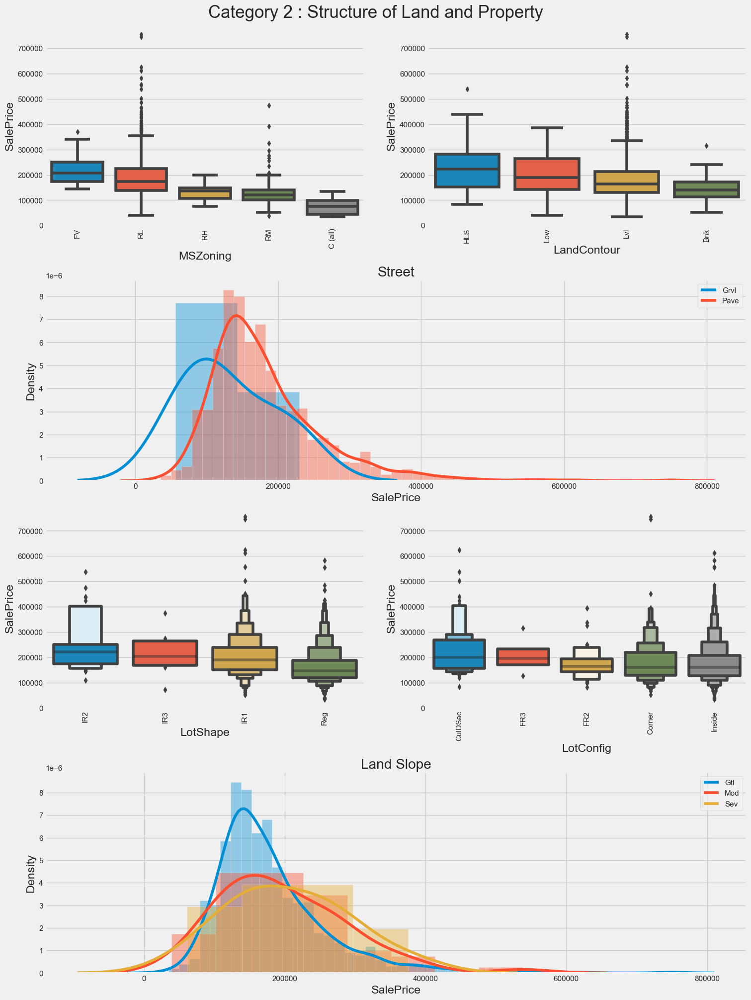

In [44]:
cat2=['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope']
fig=plt.figure(constrained_layout=True,figsize=(15,20))
gs=gridspec.GridSpec(4,2,figure=fig)
plt.subplot(gs[0,0])
table = train.groupby(['MSZoning'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=train,x='MSZoning',y="SalePrice",order=table['MSZoning'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[0,1])
table = train.groupby(['LandContour'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=train,x='LandContour',y="SalePrice",order=table['LandContour'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[1,:])
a1 = sns.distplot(train[train['Street']=='Grvl']['SalePrice'])
a1 = sns.distplot(train[train['Street']=='Pave']['SalePrice'])
plt.legend('upper right' , labels = ['Grvl','Pave'])
plt.xlabel("SalePrice")
plt.title("Street")

plt.subplot(gs[2,0])
table = train.groupby(['LotShape'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=train,x='LotShape',y="SalePrice",order=table['LotShape'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[2,1])
table = train.groupby(['LotConfig'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=train,x='LotConfig',y="SalePrice",order=table['LotConfig'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[3,:])
a1 = sns.distplot(train[train['LandSlope']=='Gtl']['SalePrice'])
a1 = sns.distplot(train[train['LandSlope']=='Mod']['SalePrice'])
a1 = sns.distplot(train[train['LandSlope']=='Sev']['SalePrice'])
plt.legend('upper right' , labels = ['Gtl','Mod','Sev'])
plt.xlabel("SalePrice")
plt.title("Land Slope")

fig.suptitle("Category 2 : Structure of Land and Property",fontsize=25);

- MSZoning:- Floating Village Residential zone (FV) is having higher Sale Price of around 2 lakhs.While Commercial zones are having the lowest Sale Price.And we see a variation in Sale Price in different zones which makes it an important feature for our prediction.
- LandContour:- If the house has significant slope on both sides (HLS) or is nearly flat(Low), Sale Price is more.For Depressed and Banked slopes , Sale price falls down.
- Street :- For flat stones or bricks access , Price is higher and majority of houses with gravel have price around 2 lakhs.But as there is very less data for Gravel street type . this feature is not that good for our prediction.
- LotShape :- We can see that houses with regular shapes have low price.And as the irregularity increases , the average sale price of the house also increases.
- LotConfig :- The configuration of the lot does not appear to vary the price sginificantly.The properties with Cul de Sac(street or passage closed at one end) and FR3(Frontage on 3 sides of property) configuration on average are having high value than the other configurations.
- LandSlope :- Most of the properties are having gentle slope and are lowest priced , while properties having moderate or severe slope have higher value.

### Category 3 :: Overall Quality and Condition

In [45]:
cat3=['OverallQual','OverallCond']
df_new['OverallQual'] = df_new['OverallQual'].replace({10:'Very Exc',9:'Exc',8:'VG',7:'Good',
                                                      6:'Abv Avg',5:'Avg',4:'Bel Avg',3:'Fair',
                                                      2:'Poor',1:'Very Poor'})

#Covert to object
df_new['OverallQual'] = df_new['OverallQual'].astype(object)

df_new['OverallCond'] = df_new['OverallCond'].replace({10:'Very Exc',9:'Exc',8:'VG',7:'Good',
                                                      6:'Abv Avg',5:'Avg',4:'Bel Avg',3:'Fair',
                                                      2:'Poor',1:'Very Poor'})

#Covert to object
df_new['OverallCond'] = df_new['OverallCond'].astype(object)

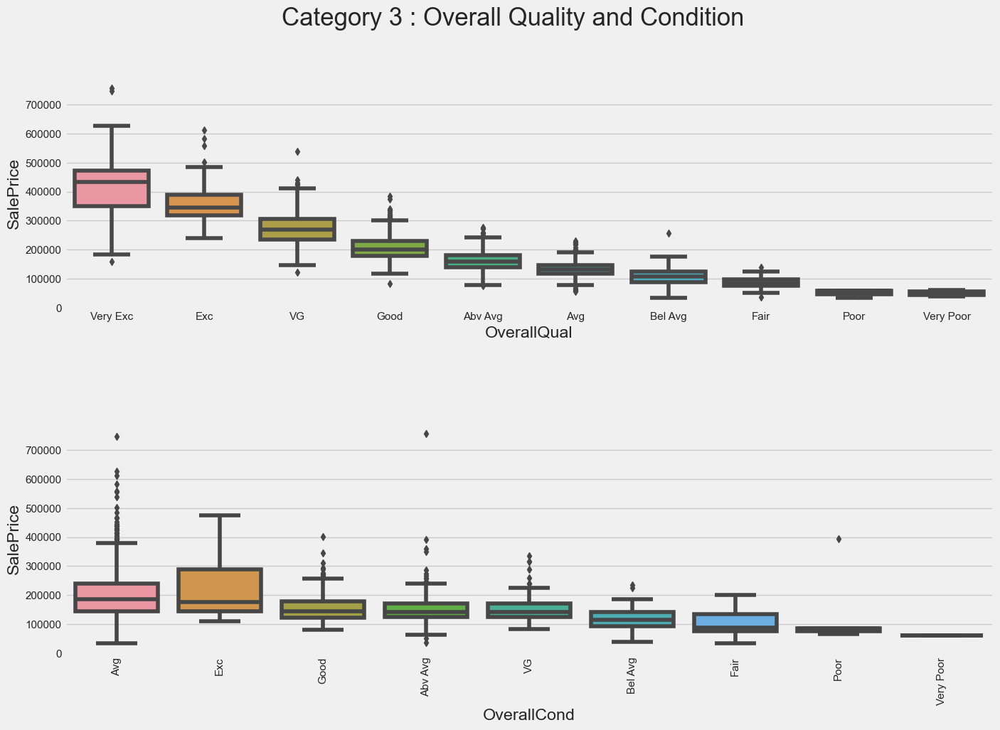

In [46]:
fig = plt.figure(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
plt.subplot(2,1,1)
table=df_new.groupby(['OverallQual'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1=sns.boxplot(data=df_new,x='OverallQual',y='SalePrice',order=table['OverallQual'].to_list())
plt.subplot(2,1,2)
table = df_new.groupby(['OverallCond'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=df_new,x='OverallCond',y="SalePrice",order=table['OverallCond'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

fig.suptitle("Category 3 : Overall Quality and Condition",fontsize=25);

- Overall Quality :- It's obvious that if overall quality of the property is good , the Price will be high and we can clearly see that in the above box plot.This tells us that Overall Quality is an important feature in predicting Sale Price of the house.The below distribution gives us a better look of the variation in price with the overall quality.
- Overall Condition :- Most of the houses are in average condition and very few are in excellent condition as seen in the box plot and the below distribution.Properties in average and excellent condition are having average price high and the properties in very bad condition will have low sale price.

### Category 4 :: Location and Style
Neighborhood: Physical locations within Ames city limits

Condition1: Proximity to various conditions

Condition2: Proximity to various conditions (if more than one is present)

Utilities: Type of utilities available

BldgType: Type of dwelling

HouseStyle: Style of dwelling

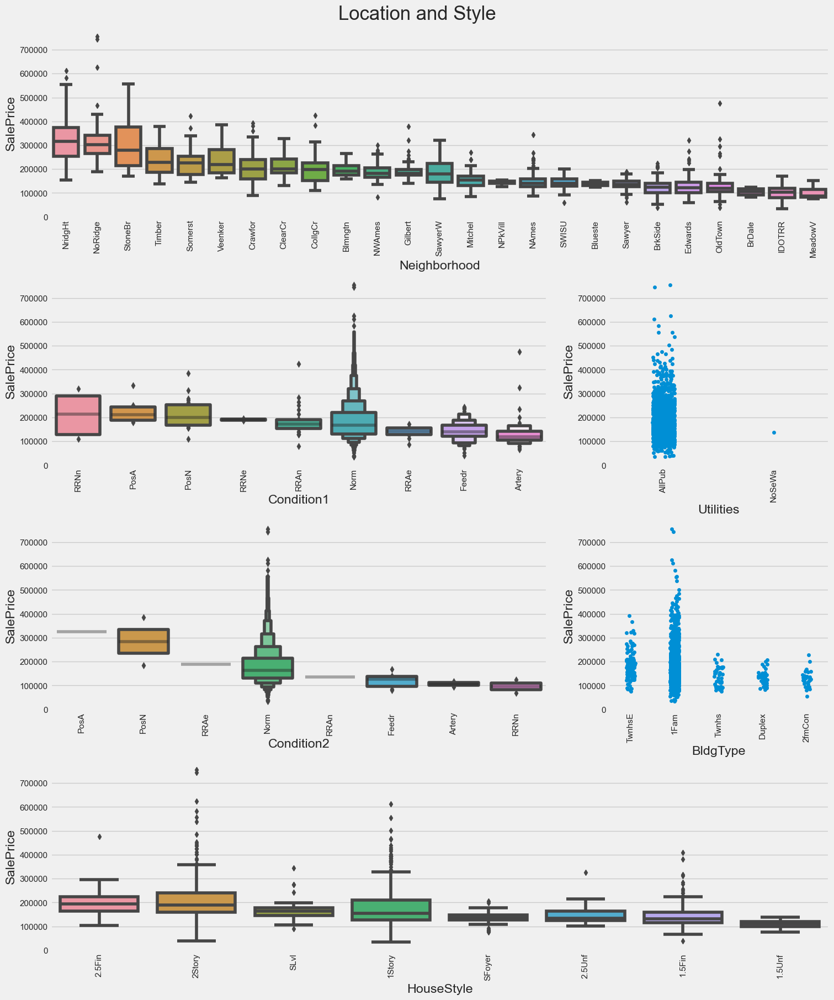

In [47]:
fig = plt.figure(constrained_layout=True,figsize=(15,18))
gs = GridSpec(4, 3, figure=fig)

plt.subplot(gs[0,:])
table = train.groupby(['Neighborhood'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=train,x='Neighborhood',y="SalePrice",order=table['Neighborhood'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[1,:-1])
table = train.groupby(['Condition1'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=train,x='Condition1',y="SalePrice",order=table['Condition1'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[1,-1])
table = train.groupby(['Utilities'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.stripplot(data=train,x='Utilities',y="SalePrice",order=table['Utilities'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[2,:-1])
table = train.groupby(['Condition2'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=train,x='Condition2',y="SalePrice",order=table['Condition2'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[2,-1])
table = train.groupby(['BldgType'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.stripplot(data=train,x='BldgType',y="SalePrice",order=table['BldgType'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[3,:])
table = train.groupby(['HouseStyle'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=train,x='HouseStyle',y="SalePrice",order=table['HouseStyle'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

fig.suptitle("Location and Style",fontsize=25);

- Building Type :- Single family detached dwellings have higher sale price compared to duplex,two family houses and townhouse dwellings
- Condition 1 and 2 :- In Condition 1 and 2 , close proximity to conditions like streets lowers the sale price and to railroads ,price is high.
- House Styles :- 2 Story and 1 Story finished house styles have highest sale price than unfinished properties which is obvious.
- Neighborhood :- We can see variation in sale price in different neighborhoods.From Mitchell neighborhoods , all the neighbors to the right are having consistently low price.
- The below table gives us a proper view of the neighborhoods and their average sale price.

In [48]:
table = df_new.groupby(['Neighborhood'],as_index=False)['SalePrice'].median()
table = table.sort_values(by='SalePrice',ascending=False)
table.style.background_gradient(cmap='Reds')

,Neighborhood,SalePrice
16,NridgHt,315000.000000
15,NoRidge,301500.000000
22,StoneBr,278000.000000
23,Timber,228475.000000
21,Somerst,225500.000000
24,Veenker,218000.000000
6,Crawfor,200624.000000
4,ClearCr,200250.000000
5,CollgCr,197200.000000
0,Blmngtn,191000.000000


**After Mitchel , all the neighbors are having sale price less than 1,40,000.** 
- And the least price for MeadowV neighborhood. Utilities :- 
- There are four utilities given in the description of this dataset.
- But we can only two utilities are available in our dataset . 
 - 1) All Public utilities and 
 - 2) Electricity and Gas only Out of 1460 data , only one house is having Electricity and gas utility in our dataset with Sale Price 137500. 
 - Most of the properties with all public utilities have sale price between 1lakh to 2lakh.

### Category 5 :: Roofing,Foundation and housing exterior
RoofStyle: Type of roof

RoofMatl: Roof material

Exterior1st: Exterior covering on house

Exterior2nd: Exterior covering on house (if more than one material)

MasVnrType: Masonry veneer type (Masonry veneer walls consist of a single non-structural external layer of masonry, typically made of brick)

Foundation: Type of foundation

In [154]:
df=train.copy()

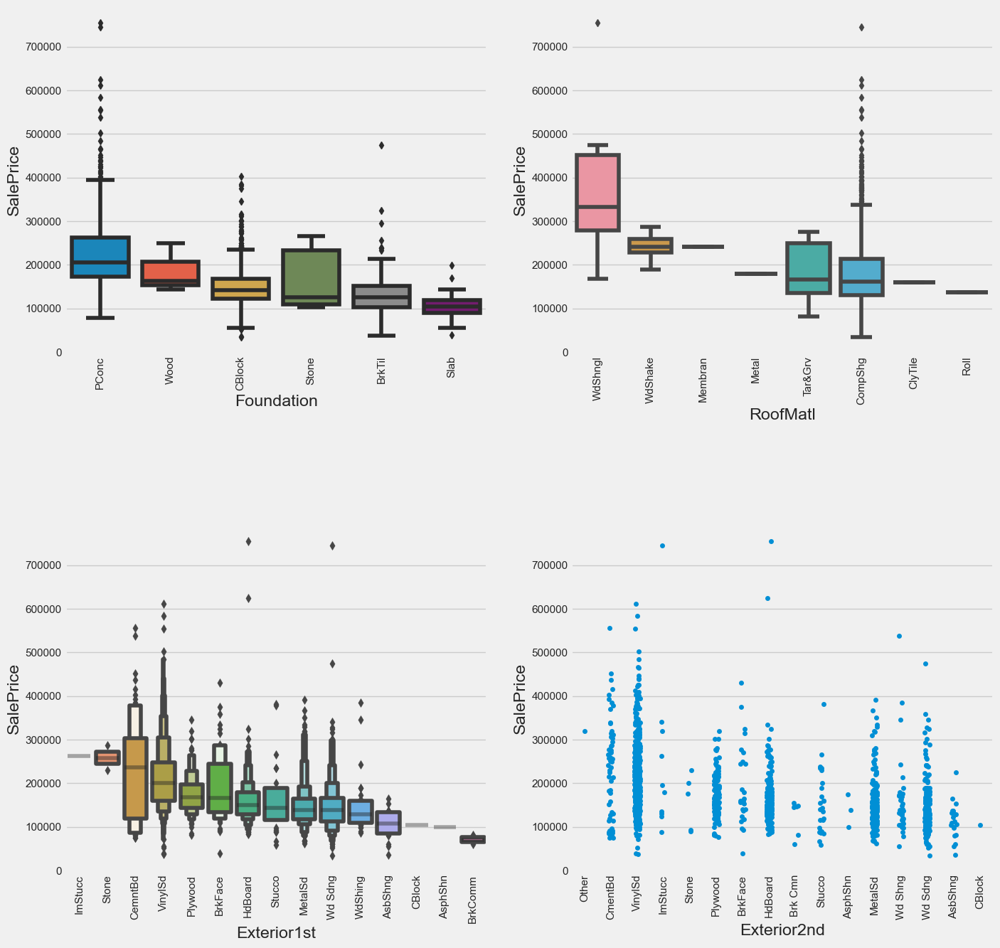

In [50]:
fig = plt.figure(figsize=(15,15))
plt.subplots_adjust(hspace=0.5)

plt.subplot(2,2,1)
table = df.groupby(['Foundation'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=df,x='Foundation',y="SalePrice",order=table['Foundation'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(2,2,2)
table = df.groupby(['RoofMatl'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=df,x='RoofMatl',y="SalePrice",order=table['RoofMatl'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(2,2,3)
table = df.groupby(['Exterior1st'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=df,x='Exterior1st',y="SalePrice",order=table['Exterior1st'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(2,2,4)
table = df.groupby(['Exterior2nd'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.stripplot(data=df,x='Exterior2nd',y="SalePrice",order=table['Exterior2nd'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

fig = px.histogram(df, x="SalePrice", color='RoofStyle',barmode="overlay",title='RoofStyle')
fig.update_layout(height=400)
fig.show()

fig = px.histogram(df, x="SalePrice", color='MasVnrType',barmode="overlay",title="Mason Veneer Type")
fig.update_layout(height=400)
fig.show()

- Exterior 1st :- We can see a difference in Sale Price in exterior covering of the house . Imitation Stucco,Stone,Cement Board coverings have high value in determining sale price ,while the lowest value is for common brick covering.
- Exterior2nd :- Having multiple materials changes the price of the house.Stone value has dropped while Cement board and Vinyl Siding are having almost same price.
- Roof Styles :- Most of the house are having Gable and Hip roof styles and average sale price of 1.5lakhs. The average highest sale price is for properties having Shed roof style and the lowest sale price.

In [51]:
table = df_new.groupby(['RoofStyle'],as_index=False)['SalePrice'].median()
table = table.sort_values(by='SalePrice',ascending=False)
table.style.background_gradient(cmap='Reds')

,RoofStyle,SalePrice
5,Shed,225000.000000
0,Flat,185000.000000
3,Hip,176500.000000
4,Mansard,175000.000000
1,Gable,160000.000000
2,Gambrel,139000.000000


In [52]:
fig = px.histogram(df, x="SalePrice", color='ExterQual',barmode="overlay",title='Exterior Quality')
fig.update_layout(height=400)
fig.show()

fig = px.histogram(df, x="SalePrice", color='ExterCond',barmode="overlay",title="Exterior Condition")
fig.update_layout(height=400)
fig.show()

- Exterior Quality :- If the exterior quality is good or excellent , The price will be more .Most of the properties have average exterior quality and very few have excellent exterior quality.
- Exterior Condition :- Average,good and excellent exterior condition properties will have higher sale price.And here also most of the properties have average exterior condition and only 3 properties in our dataset have excellent exterior condition

### Category 7 :: Basements
BsmtQual: Evaluates the height of the basement

BsmtCond: Evaluates the general condition of the basement

BsmtExposure: Refers to walkout or garden level walls

BsmtFinType1: Rating of basement finished area

BsmtFinType2: Rating of basement finished area (if multiple types)

In [53]:
fig = sp.make_subplots(rows=1, cols=2)
fig.add_trace(go.Box(y=df['SalePrice'],x=df['BsmtQual'],name='Basement Quality'),row=1,col=1)
fig.add_trace(go.Box(y=df['SalePrice'],x=df['BsmtExposure'],name='Basement Exposure'),row=1,col=2)
fig.update_layout( title_text="Basement Quality and Exposure",height=400)
fig.show()

fig = px.histogram(df, x="SalePrice", color='BsmtCond',barmode="overlay",height=400,title='Basement Condition')
fig.show()

fig = sp.make_subplots(rows=1, cols=2)
fig.add_trace(go.Violin(y=df['SalePrice'],x=df['BsmtFinType1'],name='Basement_Finish Type1 '),row=1,col=1)
fig.add_trace(go.Violin(y=df['SalePrice'],x=df['BsmtFinType2'],name='Basement_Finish Type2'),row=1,col=2)
fig.update_layout( title_text="Basement Finish Type 1 and 2",height=400)
fig.show()

- Basement Quality :- Here the Basement quality refers to height of the basement.So excellent means more than 100 inches and poor means less than 70 inches.
So Properties with excellent and good basement quality will have higher sale price.

- Basement Exposure :- Basements with good exposure to garden or walkouts have higher sale price and properties with no basements or the ones which are not known have low sale price.

- Both of the above features help us in predicting Sale Price as we can see variation in Sale Price.

- Basement Condition :- Average and Good condition have higher sale price as seen in other cases.

- Basment finish type 1 and 2 :- Good and Average living quarters and unfinished basements have higher average sale price in both type 1 and type 2 and below average finishes will obviously have less value.

### Category 8 :: Heating and Air Conditioning
Heating: Type of heating

HeatingQC: Heating quality and condition

CentralAir: Central air conditioning

Electrical: Electrical system

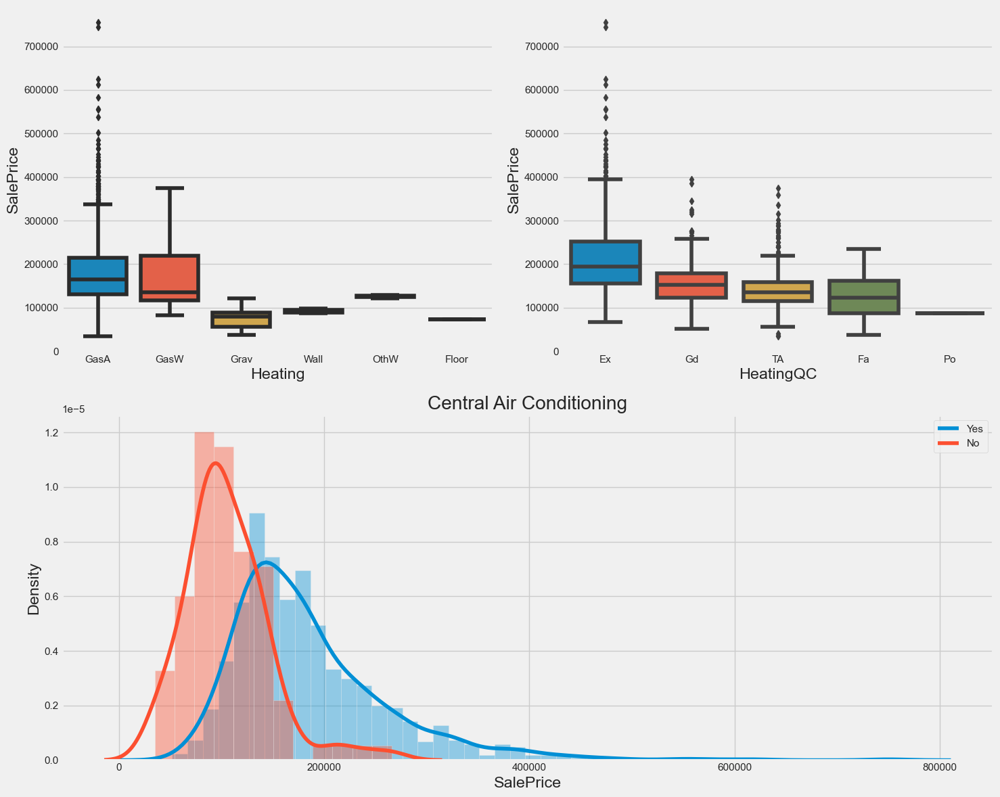

In [54]:
import matplotlib.gridspec as gridspec

fig = plt.figure(tight_layout=True,figsize=(15,12))
gs = gridspec.GridSpec(2, 2)

plt.subplot(gs[0,0])
ax1 = sns.boxplot(data=df,x="Heating",y="SalePrice")

plt.subplot(gs[0,1])
ax1 = sns.boxplot(data=df,x="HeatingQC",y="SalePrice")

plt.subplot(gs[1,:])
sns.distplot(df[df['CentralAir']=='Y']['SalePrice'])
sns.distplot(df[df['CentralAir']=='N']['SalePrice'])
plt.legend('upper right' , labels = ['Yes','No'])
plt.xlabel("SalePrice")
plt.title("Central Air Conditioning")

px.histogram(df, x="SalePrice", color='Electrical',barmode="overlay",title="Electrical System")

- Electrical :- Most of the properties have standard circuit breakers and *
- having highest average sale price of 170000 Properties with Poor fuse box system and mixed system have less than 10000 sale price.
- Heating Quality :- It can be clearly seen in the box plot and no need of explanation.
- Heating :- Heating in the wall or hot water / steam is associated with very low house prices. Gas formed warm air appears to drive a higher sales price.
- Central AC :- It's straightforward ,the properties which have Air conditioning will have higher price than the ones which dont have.

### Category 10 :: Garage
GarageType: Garage location

GarageFinish: Interior finish of the garage

GarageCars: Size of garage in car capacity

GarageQual: Garage quality

GarageCond: Garage condition

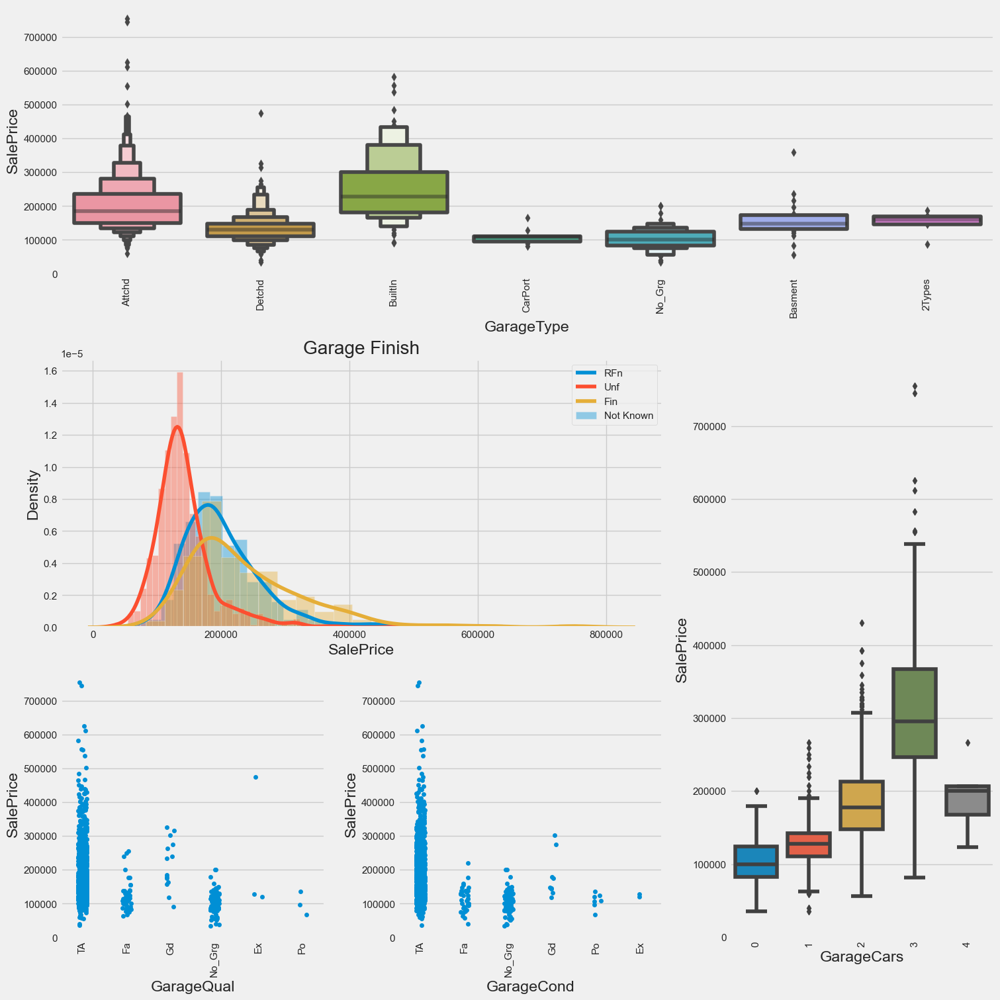

In [55]:
fig = plt.figure(constrained_layout=True,figsize=(15,15))
gs = GridSpec(3, 3, figure=fig)

plt.subplot(gs[0,:])
a1 = sns.boxenplot(data=df,x="GarageType",y="SalePrice")
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[1,:-1])
sns.distplot(df[df['GarageFinish']=='RFn']['SalePrice'])
sns.distplot(df[df['GarageFinish']=='Unf']['SalePrice'])
sns.distplot(df[df['GarageFinish']=='Fin']['SalePrice'])
sns.distplot(df[df['GarageFinish']=='Not Known']['SalePrice'])

plt.legend('upper right' , labels = ['RFn','Unf','Fin','Not Known'])
plt.xlabel("SalePrice")
plt.title("Garage Finish")

plt.subplot(gs[1:,-1])
a1 = sns.boxplot(data=df,x="GarageCars",y="SalePrice")
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[-1,0])
a1 = sns.stripplot(data=df,x="GarageQual",y="SalePrice")
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(gs[-1,-2])
a1 = sns.stripplot(data=df,x="GarageCond",y="SalePrice")
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

Now we are looking at the garage in our properties.

- Garage Type :- Houses with built in or attached garages tend to have the highest prices. Those without a garage or a car port tend to have the lowest price.
- Garage Finish :- Finished and roughly finished garages account for higher sale price than unfinished ones.And the properties which dont have a garage have the lowest price.
- GarageCars :- Here garage cars refers to size of garage in car capacity.So higher the number more the Sale Price

### Category 11 :: Outdoors
PavedDrive: Paved driveway

In [56]:
px.histogram(df, x="SalePrice", color='PavedDrive',barmode="overlay",title="Paved Driveway")

*Paved Driveway :- Most of the houses have Paved driveway in our dataset and these properties have highest sale price than partial and dirt/gravel driveways.

### Category 12 :: Sale Type and Condition
SaleType: Type of sale

SaleCondition: Condition of sale

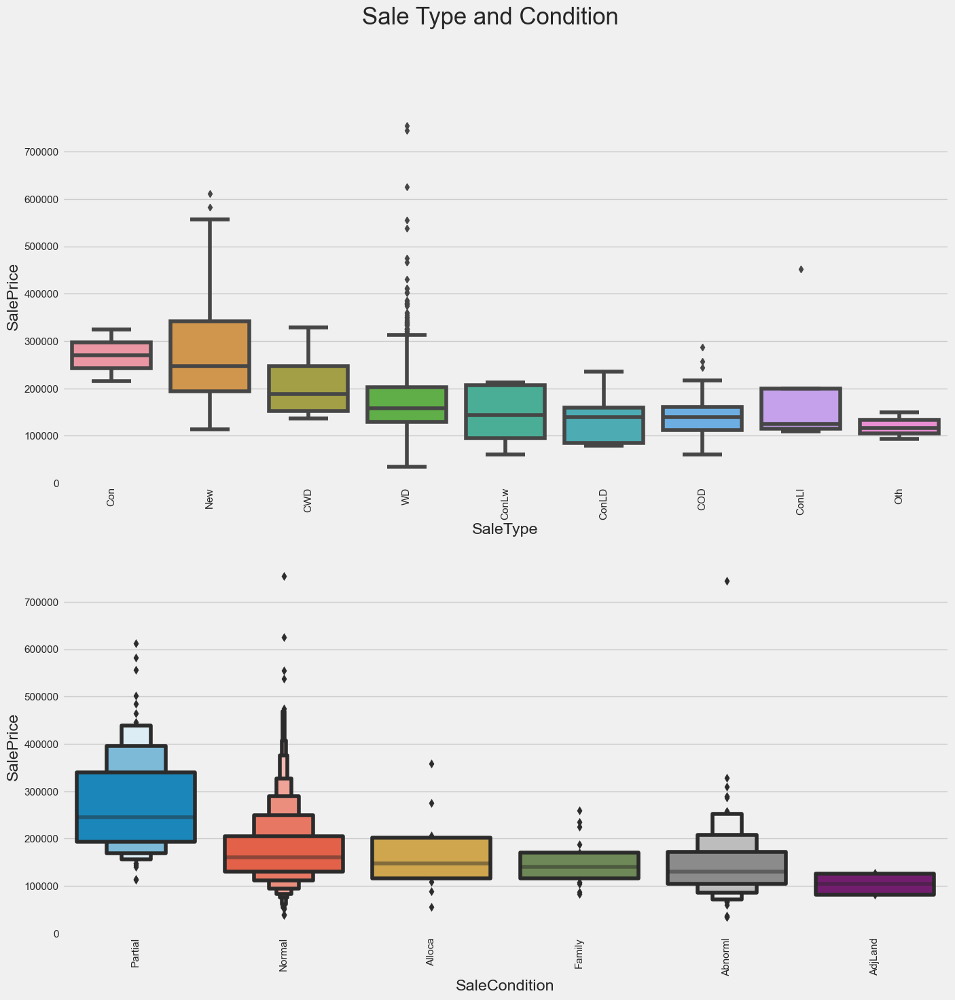

In [57]:
fig = plt.figure(figsize=(15,15))

plt.subplot(2,1,1)
table = df.groupby(['SaleType'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxplot(data=df,x='SaleType',y="SalePrice",order=table['SaleType'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

plt.subplot(2,1,2)
table = df.groupby(['SaleCondition'],as_index=False)['SalePrice'].median().sort_values(by='SalePrice',ascending=False)
a1 = sns.boxenplot(data=df,x='SaleCondition',y="SalePrice",order=table['SaleCondition'].to_list());
a1.set_xticklabels(a1.get_xticklabels(), rotation=90);

fig.suptitle("Sale Type and Condition",fontsize=25);

- Both the variables above exhibit variation in sales price across the levels.
- Sale Type :- Most of the properties are on warranty deed sale.The manor in which the house is sold appears to have different price ranges.
- Sale Condition :- If the house to be sold is in partial or normal condition , the price will definitely be higher than the rest of the conditions.
- Based on the analysis of the above categorical features , we can conclude that the following features are important in predicting Sale Price

- MSSubClass and MSZoning.
- All the Quality features , as the houses with average ,good,excellent quality features will have higher Sale Price.
- Fireplaces and Garage Cars, more the number , higher the Sale Price.
- We also saw variation in Basement Exposure.
- And lastly Sale Type and Sale condition are also one of the important features..

In [58]:
data=train.copy()
data['Sold_Built']=data['YrSold']-data['YearBuilt']
fig=px.scatter(data,x='Sold_Built',y='SalePrice',width=700)
fig.show()
data=df.copy()
data['Sold-Remodelled'] = data['YrSold'] - data['YearRemodAdd']
fig=px.scatter(data,x="Sold-Remodelled",y="SalePrice",width=700)
fig.show()

data=df.copy()
data['Sold-GarageBuilt'] = data['YrSold'] - data['GarageYrBlt']
fig=px.scatter(data,x="Sold-GarageBuilt",y="SalePrice",width=700)
fig.show()

- This clearly shows that the more the house is old , less is the Sale Price.
- That's it we are done with the analysis of all the features.¶
- Now we'll make a predictive model for predicting Sale Price.
- For this section ,we create a separate dataset.

In [155]:
dataset=train.copy()

In [156]:
dataset.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,...,0,0,0,0,0,12,2008,WD,Normal,250000


- As seen in the skewness , there are some features with highly skewed values.
- As our target feature is a continuous variable , we'll be using regression algorithms for prediction.
- And for regression , it is convenient to transform highly skewed variables into a more normalized dataset.
- Before that we need to convert few features datatypes back to int from object that we had change in the start.

In [157]:
object_to_int = ['MSSubClass','OverallQual','OverallCond','GarageCars']
for feature in object_to_int:
  dataset[feature]=dataset[feature].astype(int)

In [158]:
#Similarly in test
#MSSubClass --> object to int

test['MSSubClass'] = test['MSSubClass'].astype(int)
test['OverallQual'] = test['OverallQual'].astype(int)
test['OverallCond'] = test['OverallCond'].astype(int)

In [63]:
#This step we'll extract the features from the dataset with high skewness for applying log transformation.

datetime=['YearBuilt','YearRemodAdd','GarageYrBlt','MoSold','YrSold']

#Extracting continuous variables from the dataset
continuous=[]
for col in dataset.columns:
    if dataset[col].dtype!='O' and len(dataset[col].unique()) >16 and col not in datetime:
        continuous.append(col)

#Extracting features with skewness more than and less than zero
skewed_features=[]
for col in continuous:
    if dataset[col].skew()>0 or dataset[col].skew()<0:
        skewed_features.append(col)

apply_log=[]
for col in skewed_features:
    if 0 not in dataset[col].unique():
        apply_log.append(col)

#Before log transformation
print("Before Log Transformation........................")
for col in apply_log:
    print("{} --- {}".format(col,dataset[col].skew()))

Before Log Transformation........................
LotFrontage --- 2.4091466665496006
LotArea --- 12.207687851233496
1stFlrSF --- 1.3767566220336365
GrLivArea --- 1.3665603560164552
SalePrice --- 1.8828757597682129


In [64]:
for feature in apply_log:
  dataset[feature]=np.log(data[feature])
  #After log transformation
print("\nAfter Log Transformation.........................")
for col in apply_log:
    print("{} --- {}".format(col,dataset[col].skew()))


After Log Transformation.........................
LotFrontage --- -0.9091148013817885
LotArea --- -0.1379938086958118
1stFlrSF --- 0.07915695223960692
GrLivArea --- -0.006995182187690808
SalePrice --- 0.12133506220520406


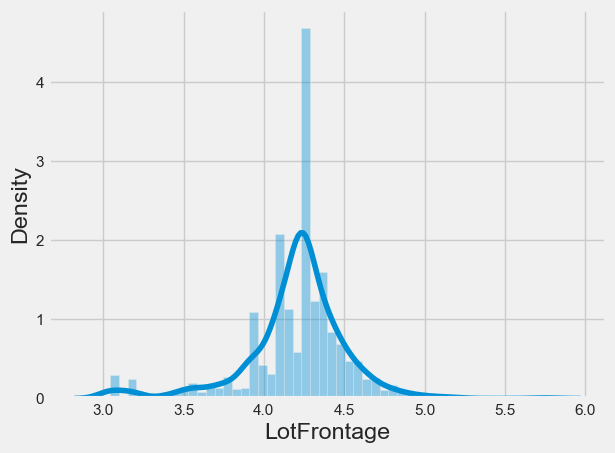

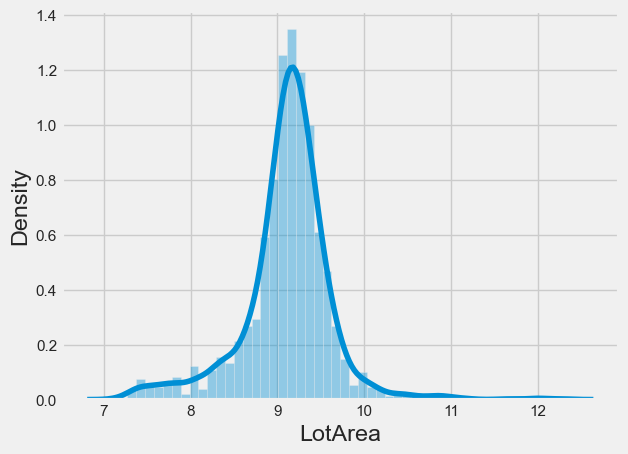

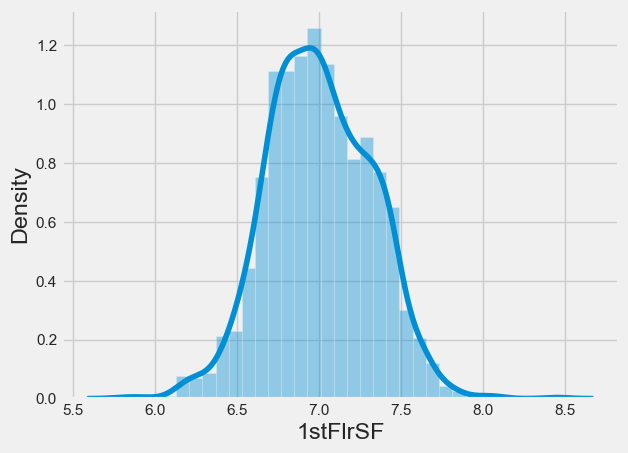

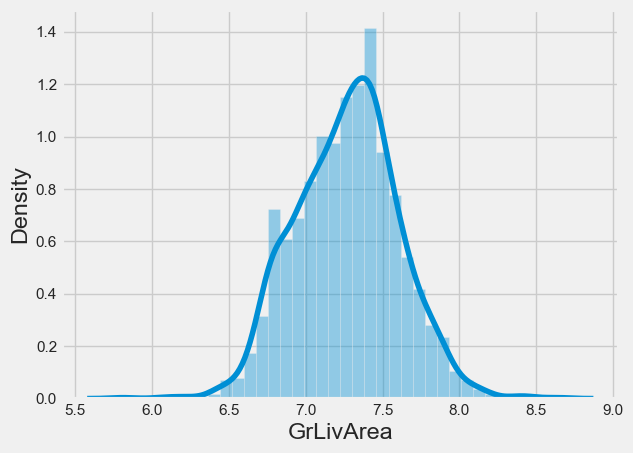

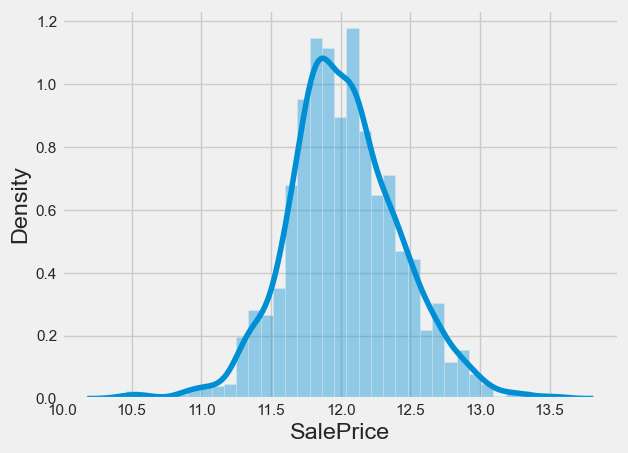

In [65]:
for feature in apply_log:
    fig = sns.distplot(dataset[feature])
    plt.show()

#### label Encoding
**It is important to convert the categorical text data into model-understandable numerical data**

In [159]:
categorical =[]
for col in dataset.columns:
  if dataset[col].dtype=='O':
    categorical.append(col)

In [160]:
label_encoders={}
for column in categorical:
  label_encoders[column]=LabelEncoder()
  dataset[column]=label_encoders[column].fit_transform(dataset[column])

In [161]:
##Label Encoding for test dataset
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

label_encoders = {}
for column in categorical:
    label_encoders[column] = LabelEncoder()
    test[column] = label_encoders[column].fit_transform(test[column])

In [162]:
dataset[categorical]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,3,1,3,3,0,4,0,5,2,2,...,2,6,3,1,2,5,5,2,8,4
1,3,1,3,3,0,2,0,24,1,2,...,3,6,5,1,2,5,5,2,8,4
2,3,1,0,3,0,4,0,5,2,2,...,2,6,5,1,2,5,5,2,8,4
3,3,1,0,3,0,0,0,6,2,2,...,2,6,2,5,3,5,5,2,8,0
4,3,1,0,3,0,2,0,15,2,2,...,2,6,5,1,2,5,5,2,8,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3,1,3,3,0,4,0,8,2,2,...,3,6,5,1,2,5,5,2,8,4
1456,3,1,3,3,0,4,0,14,2,2,...,3,2,5,1,3,5,5,2,8,4
1457,3,1,3,3,0,4,0,6,2,2,...,2,6,2,1,2,5,5,2,8,4
1458,3,1,3,3,0,4,0,12,2,2,...,2,6,3,1,3,5,5,2,8,4


In [163]:
test[categorical]

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,2,1,3,3,0,4,0,12,1,2,...,3,6,3,1,3,4,5,2,8,4
1,3,1,0,3,0,0,0,12,2,2,...,2,6,3,1,3,4,5,2,8,4
2,3,1,0,3,0,4,0,8,2,2,...,3,6,5,1,0,4,5,2,8,4
3,3,1,0,3,0,4,0,8,2,2,...,2,6,2,1,0,4,5,2,8,4
4,3,1,0,1,0,4,0,22,2,2,...,2,6,3,1,2,4,5,2,8,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,4,1,3,3,0,4,0,10,2,2,...,3,6,3,6,1,2,3,2,8,4
1455,4,1,3,3,0,4,0,10,2,2,...,3,6,3,4,3,4,5,2,8,0
1456,3,1,3,3,0,4,0,11,2,2,...,3,6,5,5,3,4,5,2,8,0
1457,3,1,3,3,0,4,0,11,2,2,...,3,6,3,6,1,2,3,2,8,4


In [71]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int32  
 2   MSZoning       1460 non-null   int32  
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   float64
 5   Street         1460 non-null   int32  
 6   LotShape       1460 non-null   int32  
 7   LandContour    1460 non-null   int32  
 8   Utilities      1460 non-null   int32  
 9   LotConfig      1460 non-null   int32  
 10  LandSlope      1460 non-null   int32  
 11  Neighborhood   1460 non-null   int32  
 12  Condition1     1460 non-null   int32  
 13  Condition2     1460 non-null   int32  
 14  BldgType       1460 non-null   int32  
 15  HouseStyle     1460 non-null   int32  
 16  OverallQual    1460 non-null   int32  
 17  OverallCond    1460 non-null   int32  
 18  YearBuil

In [72]:


# Get the list of float columns
float_columns = dataset.select_dtypes(include=['float']).columns

# Convert float columns to int64
dataset[float_columns] = dataset[float_columns].astype('int64')


In [73]:

# Get the list of float columns
float_columns = test.select_dtypes(include=['float']).columns

# Convert float columns to int64
test[float_columns] = test[float_columns].astype('int64')

In [74]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Id             1459 non-null   int64
 1   MSSubClass     1459 non-null   int32
 2   MSZoning       1459 non-null   int32
 3   LotFrontage    1459 non-null   int64
 4   LotArea        1459 non-null   int64
 5   Street         1459 non-null   int32
 6   LotShape       1459 non-null   int32
 7   LandContour    1459 non-null   int32
 8   Utilities      1459 non-null   int32
 9   LotConfig      1459 non-null   int32
 10  LandSlope      1459 non-null   int32
 11  Neighborhood   1459 non-null   int32
 12  Condition1     1459 non-null   int32
 13  Condition2     1459 non-null   int32
 14  BldgType       1459 non-null   int32
 15  HouseStyle     1459 non-null   int32
 16  OverallQual    1459 non-null   int32
 17  OverallCond    1459 non-null   int32
 18  YearBuilt      1459 non-null   int64
 19  YearRe

### Feature Scaling
- It is important to scale all the features so that each feature contributes approximately proportionately to the final Sale Price.
- There are two types of popular feature scaling methods :-
1) Standard Scaler
2) MinMax Scaler
- StandardScaler standardizes a feature by subtracting the mean and then scaling to unit variance. Unit variance means dividing all the values by the standard deviation. ... StandardScaler makes the mean of the distribution 0.
- MinMaxScaler shrinks the range such that the range is now between 0 and 1.
- We can use any one of them , in this exercise we'll go with MinMaxScaler.

In [228]:
y11=dataset['SalePrice']
x11=dataset.drop(columns=['SalePrice'],axis=1)
columns_x=x.columns

In [229]:
scaler=MinMaxScaler()
x11=scaler.fit_transform(x)

In [ ]:
x11 = pd.DataFrame(x11,columns=[columns_x])

**Similarly for test dataset**

In [78]:
test_mod=test
columns_test = test_mod.columns
scaler=MinMaxScaler()
test_mod=scaler.fit_transform(test_mod)
test_mod = pd.DataFrame(test_mod,columns=[columns_test])

In [79]:
test.columns

MultiIndex([(           'Id',),
            (   'MSSubClass',),
            (     'MSZoning',),
            (  'LotFrontage',),
            (      'LotArea',),
            (       'Street',),
            (     'LotShape',),
            (  'LandContour',),
            (    'Utilities',),
            (    'LotConfig',),
            (    'LandSlope',),
            ( 'Neighborhood',),
            (   'Condition1',),
            (   'Condition2',),
            (     'BldgType',),
            (   'HouseStyle',),
            (  'OverallQual',),
            (  'OverallCond',),
            (    'YearBuilt',),
            ( 'YearRemodAdd',),
            (    'RoofStyle',),
            (     'RoofMatl',),
            (  'Exterior1st',),
            (  'Exterior2nd',),
            (   'MasVnrType',),
            (   'MasVnrArea',),
            (    'ExterQual',),
            (    'ExterCond',),
            (   'Foundation',),
            (     'BsmtQual',),
            (     'BsmtCond',),
        

- All the data has been scaled between 0 and 1.
- Train Test Split
- Splitting the data in train and test datasets for model prediction.

In [80]:
from sklearn.model_selection import train_test_split as tts
x_train,x_test,y_train,y_test=tts(x11,y11,test_size=0.3,random_state=0)

### Feature Selection using Lasso

In [84]:
# Using SelectFromModel with lasso for selecting best features.
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
feature_Sel_model=SelectFromModel(Lasso(alpha=0.005,random_state=0))
feature_Sel_model.fit(x_train,y_train)

SelectFromModel(estimator=Lasso(alpha=0.005, random_state=0))

In [85]:
selected_feat = x_train.columns[(feature_Sel_model.get_support())]

In [86]:
x_train= x_train[selected_feat].reset_index(drop=True)

In [87]:
#Similarly for testing dataset

x_test=x_test[selected_feat]
test=test[selected_feat]

#### Model Building
 - Linear Regression

MAE: 0.22884698208348328
MSE: 0.0906381336452036
RMSE: 0.3010616774768977

Accuracy : 0.6730339386053208


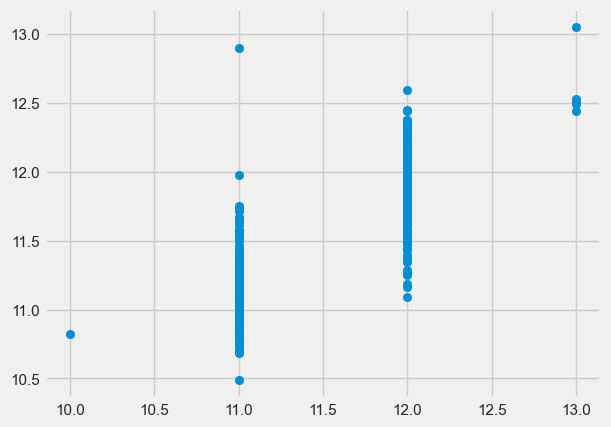

In [88]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

lm = LinearRegression()

#fitting linear model on train dataset
lm.fit(x_train,y_train)
lm_predictions=lm.predict(x_test)

#scatterplot
plt.scatter(y_test,lm_predictions)
#Evaluation
print("MAE:", metrics.mean_absolute_error(y_test, lm_predictions))
print('MSE:', metrics.mean_squared_error(y_test, lm_predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, lm_predictions)))
print("\nAccuracy : {}".format(lm.score(x_test,y_test)))

### Creat Submission file

In [89]:
lr_reg=lm.predict(test_mod)

In [90]:
LR_prediction = np.exp(lr_reg)

In [91]:
LR_prediction

array([ 41339.12039949,  59609.3505641 ,  89280.89577389, ...,
        62499.44024101,  47858.71034116, 119756.12750615])

In [94]:
sample['SalePrice'] = LR_prediction
sample.to_csv('Linear_using_Lasso_Feature_Prat1_submission.csv', index=False)

## Feature Selection Approach 1(Intuitive )

In [280]:
final_list1=['LotArea', 'Street', 'Condition2', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'ExterCond',
        'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF2',
       'HeatingQC', 'CentralAir', '1stFlrSF', '2ndFlrSF',
        'GrLivArea', 'BsmtFullBath',
       'FullBath', 'KitchenAbvGr', 'KitchenQual', 'Functional', 'Fireplaces',
       'GarageCars', 'PavedDrive','WoodDeckSF','ScreenPorch','PoolArea','YrSold','SaleCondition']

### LINEAR REGRESSION on Selected Features (30)

In [174]:
skew_df=dataset[final_list1].copy()
skew_df_test = test[final_list1].copy()

In [175]:
skew_df.shape

(1460, 30)

In [176]:
skew_df_test.shape

(1459, 30)

In [177]:

X = skew_df  # Features
Y =  np.log1p(dataset["SalePrice"])  # Target variable

In [178]:
Y

0       12.247699
1       12.109016
2       12.317171
3       11.849405
4       12.429220
          ...    
1455    12.072547
1456    12.254868
1457    12.493133
1458    11.864469
1459    11.901590
Name: SalePrice, Length: 1460, dtype: float64

In [179]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
import numpy as np

def evaluation(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

        # Explore coefficients and intercept
        print("Coefficient values:")
        for col_name, coef in zip(x_train.columns, model.coef_):
            print("The coefficient for {} is {:.2f}".format(col_name, coef))

        intercept = model.intercept_
        print("The intercept for our model is {:.2f}".format(intercept))

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

In [180]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [181]:
reg_lin=LinearRegression()
reg_lin.fit(X_train,y_train)
# y_pred=reg_lin.predict(X_val)

evaluation(reg_lin, X_train, y_train, X_val, y_val, True)
evaluation(reg_lin, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.13
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.09
_______________________________________________
R^2 Score: 0.89
_______________________________________________

Cross-validation scores: [0.90562622 0.81750752 0.86832382 0.91529803 0.88652895]
Mean CV score: 0.8786569062890024
Standard deviation of CV scores: 0.03457717579753665

Coefficient values:
The coefficient for LotArea is 0.00
The coefficient for Street is 0.24
The coefficient for Condition2 is -0.17
The coefficient for OverallQual is 0.07
The coefficient for OverallCond is 0.04
The coefficient for YearBuilt is 0.00
The coefficient for YearRemodAdd is 0.00
The coefficient for ExterCond is 0.01
The coefficient for BsmtQual is -0.01
The coefficient for BsmtExposure is -0.01
The coefficient for BsmtFinType1 is -0.01
The coefficient for BsmtFinSF2 is 0.00
The coefficient for HeatingQC is -0.

**Based on the provided result, we can interpret the performance of the model as follows:**

#### Train Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.13, which indicates the average difference between the predicted values and the actual values is 0.13. Lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.02, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.09, which represents the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.89, indicating that approximately 89% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores show the performance of the model on different folds of the data during cross-validation. The mean cross-validation score is 0.878, indicating good generalization performance. The standard deviation of the cross-validation scores is 0.034, which represents the variability in the model's performance across different folds.

- Coefficient values: The coefficient values represent the estimated impact of each feature on the target variable. Positive coefficients indicate a positive relationship, while negative coefficients indicate a negative relationship. Features with coefficients close to zero have a minimal impact on the target variable. The intercept value is 16.11, which represents the predicted target value when all the features have a value of zero.

#### Validation Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.19, indicating the average difference between the predicted values and the actual values is 0.19. Similar to the train result, lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.04, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.10, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.76, indicating that approximately 76% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.74, representing the average performance. The standard deviation of the cross-validation scores is 0.14, indicating some variability in the model's performance across different folds.


In [182]:
# test_pred = reg_lin.predict(test_data[selected_features[1:]])
test_pred = reg_lin.predict(test[final_list1])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,113261.0
1,1462,149630.0
2,1463,165906.0
3,1464,187859.0
4,1465,196262.0


In [183]:
submission.to_csv("Result1_based_on_linear_pratnew.csv", index = False, header = True)

#### LASSO (and tuning with GridSearchCV)

In [184]:
reg_lasso=Lasso()
reg_lasso.fit(X_train,y_train)

evaluation(reg_lasso, X_train, y_train, X_val, y_val, True)
evaluation(reg_lasso, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.20
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.14
_______________________________________________
R^2 Score: 0.76
_______________________________________________

Cross-validation scores: [0.78726167 0.69363813 0.77505386 0.78077133 0.76913808]
Mean CV score: 0.7611726144934694
Standard deviation of CV scores: 0.03429808629021837

Coefficient values:
The coefficient for LotArea is 0.00
The coefficient for Street is 0.00
The coefficient for Condition2 is -0.00
The coefficient for OverallQual is 0.00
The coefficient for OverallCond is 0.00
The coefficient for YearBuilt is 0.00
The coefficient for YearRemodAdd is 0.00
The coefficient for ExterCond is 0.00
The coefficient for BsmtQual is -0.00
The coefficient for BsmtExposure is -0.00
The coefficient for BsmtFinType1 is -0.00
The coefficient for BsmtFinSF2 is 0.00
The coefficient for HeatingQC is -0.

**Based on the provided results from the Lasso model, we can interpret the performance as follows:**

#### Train Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.20, indicating the average difference between the predicted values and the actual values is 0.20. Lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.04, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.14, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.76, indicating that approximately 76% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores show the performance of the model on different folds of the data during cross-validation. The mean cross-validation score is 0.761, indicating good generalization performance. The standard deviation of the cross-validation scores is 0.034, which represents the variability in the model's performance across different folds.

- Coefficient values: The coefficient values are all very close to zero, indicating that the Lasso model has heavily penalized or eliminated the impact of most features. This suggests that the Lasso model has performed feature selection and retained only a few features that are deemed important for predicting the target variable. The intercept value is 0.42, which represents the predicted target value when all the features have a value of zero.

#### Validation Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.23, indicating the average difference between the predicted values and the actual values is 0.23. Similar to the train result, lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.05, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.13, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.65, indicating that approximately 65% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.60, representing the average performance. The standard deviation of the cross-validation scores is 0.19, indicating some variability in the model's performance across different folds.

We can see that , the Lasso model has reduced the number of features and selected only a few important ones.












In [185]:
params_dict={'alpha':[0.001, 0.005, 0.01,0.05,0.1,0.5,1]}
reg_lasso_CV=GridSearchCV(estimator=Lasso(),param_grid=params_dict,scoring='neg_mean_squared_error',cv=10)
reg_lasso_CV.fit(X_train,y_train)
reg_lasso_CV.best_params_

{'alpha': 0.001}

In [186]:
def evaluation_v2(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

In [187]:
evaluation_v2(reg_lasso_CV, X_train, y_train, X_val, y_val, True)
evaluation_v2(reg_lasso_CV, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.13
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.09
_______________________________________________
R^2 Score: 0.89
_______________________________________________

Cross-validation scores: [0.90475785 0.81415076 0.88496684 0.91540624 0.88146448]
Mean CV score: 0.8801492361574054
Standard deviation of CV scores: 0.035296962213076905


Validation Result:
Root Mean Squared Error: 0.18
_______________________________________________
Mean Squared Error: 0.03
_______________________________________________
Mean Absolute Error: 
0.10
_______________________________________________
R^2 Score: 0.78
_______________________________________________

Cross-validation scores: [0.67247463 0.86123412 0.81432446 0.48460122 0.84337857]
Mean CV score: 0.74
Standard deviation of CV scores: 0.14


**Based on the  results after tuning the alpha parameter and applying GridSearchCV for the Lasso model, we can interpret the performance as follows:**

#### Train Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.13, indicating the average difference between the predicted values and the actual values is 0.13. Lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.02, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.09, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.89, indicating that approximately 89% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores show the performance of the model on different folds of the data during cross-validation. The mean cross-validation score is 0.880, indicating good generalization performance. The standard deviation of the cross-validation scores is 0.035, which represents the variability in the model's performance across different folds.

#### Validation Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.18, indicating the average difference between the predicted values and the actual values is 0.18. Similar to the train result, lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.03, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.10, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.78, indicating that approximately 78% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.74, representing the average performance. The standard deviation of the cross-validation scores is 0.14, indicating some variability in the model's performance across different folds.

Overall, **after tuning the alpha parameter and applying GridSearchCV, the Lasso model's performance seems to have improved compared to the previous results. The model exhibits lower errors (RMSE, MSE, MAE) and higher R-squared scores on both the training and validation data. The cross-validation scores also suggest good generalization performance.** 

In [188]:

test_pred = reg_lasso_CV.predict(test[final_list1])
test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,112946.0
1,1462,150105.0
2,1463,165892.0
3,1464,188283.0
4,1465,197810.0


In [189]:
submission.to_csv("Result_based_on_lassoModel_prat.csv", index = False, header = True)

### RIDGE (and tuning with GridSearchCV)

In [190]:
reg_ridge=Ridge()
reg_ridge.fit(X_train,y_train)

evaluation(reg_ridge, X_train, y_train, X_val, y_val, True)
evaluation(reg_ridge, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.13
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.09
_______________________________________________
R^2 Score: 0.89
_______________________________________________

Cross-validation scores: [0.90553977 0.81778325 0.8742616  0.91611407 0.88569689]
Mean CV score: 0.8798791172045322
Standard deviation of CV scores: 0.03432998811328059

Coefficient values:
The coefficient for LotArea is 0.00
The coefficient for Street is 0.20
The coefficient for Condition2 is -0.16
The coefficient for OverallQual is 0.07
The coefficient for OverallCond is 0.04
The coefficient for YearBuilt is 0.00
The coefficient for YearRemodAdd is 0.00
The coefficient for ExterCond is 0.01
The coefficient for BsmtQual is -0.01
The coefficient for BsmtExposure is -0.01
The coefficient for BsmtFinType1 is -0.01
The coefficient for BsmtFinSF2 is 0.00
The coefficient for HeatingQC is -0.

**Based on the provided results from the Ridge model above , we can interpret the performance as follows:**

#### Train Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.13, indicating the average difference between the predicted values and the actual values is 0.13. Lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.02, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.09, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.89, indicating that approximately 89% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores show the performance of the model on different folds of the data during cross-validation. The mean cross-validation score is 0.880, indicating good generalization performance. The standard deviation of the cross-validation scores is 0.034, which represents the variability in the model's performance across different folds.

- Coefficient values: The coefficient values represent the estimated impact of each feature on the target variable. Positive coefficients indicate a positive relationship, while negative coefficients indicate a negative relationship. Features with coefficients close to zero have a minimal impact on the target variable. The intercept value is 16.14, which represents the predicted target value when all the features have a value of zero.

#### Validation Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.19, indicating the average difference between the predicted values and the actual values is 0.19. Similar to the train result, lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.04, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.10, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.76, indicating that approximately 76% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.74, representing the average performance. The standard deviation of the cross-validation scores is 0.14, indicating some variability in the model's performance across different folds.

Overall, the Ridge model demonstrates good performance based on the provided metrics. It shows relatively low errors (RMSE, MSE, MAE) and a high R-squared score on both the training and validation data. The cross-validation scores also indicate good generalization performance. 


In [191]:
params_dict={'alpha':[0.1, 0.15, 0.20,0.25,0.30,0.35,0.4,0.45,0.50,0.55,0.60]}
reg_ridge_CV=GridSearchCV(estimator=Ridge(),param_grid=params_dict,scoring='neg_mean_squared_error',cv=10)
reg_ridge_CV.fit(X_train,y_train)
reg_ridge_CV.best_params_

{'alpha': 0.6}

In [192]:
evaluation_v2(reg_ridge, X_train, y_train, X_val, y_val, True)
evaluation_v2(reg_ridge, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.13
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.09
_______________________________________________
R^2 Score: 0.89
_______________________________________________

Cross-validation scores: [0.90553977 0.81778325 0.8742616  0.91611407 0.88569689]
Mean CV score: 0.8798791172045322
Standard deviation of CV scores: 0.03432998811328059


Validation Result:
Root Mean Squared Error: 0.19
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.10
_______________________________________________
R^2 Score: 0.76
_______________________________________________

Cross-validation scores: [0.66959072 0.86001501 0.80972287 0.4920156  0.85792733]
Mean CV score: 0.74
Standard deviation of CV scores: 0.14


- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.74, representing the average performance. The standard deviation of the cross-validation scores is 0.14, indicating some variability in the model's performance across different folds.

**Overall, after tuning the alpha parameter and applying GridSearchCV, the Ridge model's performance seems to have improved compared to the previous results. The model demonstrates relatively low errors (RMSE, MSE, MAE) and a high R-squared score on both the training and validation data. The cross-validation scores also suggest good generalization performance.** 

In [193]:

test_pred = reg_ridge_CV.predict(test[final_list1])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,113192.0
1,1462,149595.0
2,1463,165867.0
3,1464,187836.0
4,1465,196342.0


In [194]:
submission.to_csv("Result_based_on_RIDGE_Model_prat.csv", index = False, header = True)

#### ElasticNet (and tuning with GridSearchCV)

In [195]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

alpha = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
max_iter = [1000, 10000]
l1_ratio = np.arange(0.0, 1.0, 0.1)
tol = [0.5]

elasticnet_gscv = GridSearchCV(estimator=ElasticNet(), 
                                param_grid={'alpha': alpha,
                                            'max_iter': max_iter,
                                            'l1_ratio': l1_ratio,
                                            'tol':tol},   
                                scoring='r2',
                                cv=5)

In [196]:
elasticnet_gscv.fit(X, Y)
elasticnet_gscv.best_params_

{'alpha': 0.01, 'l1_ratio': 0.1, 'max_iter': 1000, 'tol': 0.5}

In [197]:
elasticnet = ElasticNet(alpha = elasticnet_gscv.best_params_['alpha'], 
                        max_iter = elasticnet_gscv.best_params_['max_iter'],
                        l1_ratio = elasticnet_gscv.best_params_['l1_ratio'],
                        tol = elasticnet_gscv.best_params_['tol'])
elasticnet.fit(X_train, y_train)

ElasticNet(alpha=0.01, l1_ratio=0.1, tol=0.5)

In [198]:
evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, True)
evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.15
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.87
_______________________________________________

Cross-validation scores: [0.86519081 0.79531464 0.872118   0.88393407 0.8350542 ]
Mean CV score: 0.8503223452719878
Standard deviation of CV scores: 0.03188991359649297


Validation Result:
Root Mean Squared Error: 0.19
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.75
_______________________________________________

Cross-validation scores: [0.60070001 0.78783746 0.76702309 0.58033771 0.6119716 ]
Mean CV score: 0.67
Standard deviation of CV scores: 0.09


**Based on the above results achieved with the ElasticNet model, we can interpret and summarize the performance as follows:**

#### Train Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.15, indicating the average difference between the predicted values and the actual values is 0.15. Lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.02, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.11, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.87, indicating that approximately 87% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores show the performance of the model on different folds of the data during cross-validation. The mean cross-validation score is 0.850, indicating good generalization performance. The standard deviation of the cross-validation scores is 0.032, which represents the variability in the model's performance across different folds.

#### Validation Result:

- Root Mean Squared Error (RMSE): The RMSE value is 0.19, indicating the average difference between the predicted values and the actual values is 0.19. Similar to the train result, lower values of RMSE indicate better model performance.
- Mean Squared Error (MSE): The MSE value is 0.04, which is the average of the squared differences between predicted and actual values. Smaller MSE values indicate better model performance.
- Mean Absolute Error (MAE): The MAE value is 0.11, representing the average absolute difference between predicted and actual values. Lower MAE values indicate better model performance.
- R-squared Score (R^2): The R^2 score is 0.75, indicating that approximately 75% of the variance in the target variable can be explained by the model. Higher R^2 values suggest better model fit.
- Cross-validation scores: The cross-validation scores for the validation data are shown, indicating the model's performance on different folds. The mean cross-validation score is 0.67, representing the average performance. The standard deviation of the cross-validation scores is 0.09, indicating some variability in the model's performance across different folds.


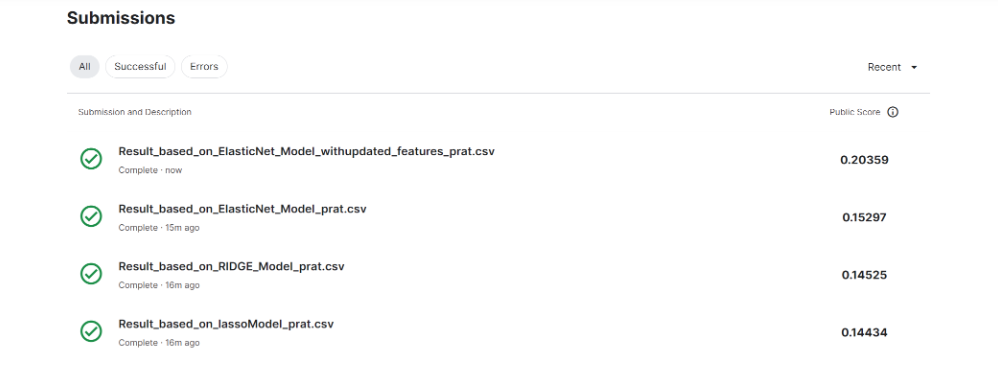

**In summary, based on the Kaggle scores:**

- The Ridge model has the lowest Kaggle score of 0.14525, followed closely by the LASSO model with a Kaggle score of 0.14434. These models perform slightly better than the ElasticNet model with a Kaggle score of 0.15297.
- The LASSO and Ridge models exhibit similar performance, with slightly better performance than the ElasticNet model based on the Kaggle scores.


In [199]:

test_pred = elasticnet.predict(test[final_list1])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,112544.0
1,1462,153678.0
2,1463,158124.0
3,1464,181894.0
4,1465,224635.0


In [200]:
submission.to_csv("Result_based_on_ElasticNet_Model_prat.csv", index = False, header = True)

Text(0.5, 1.0, 'Coefficients in the ElasticNet Model')

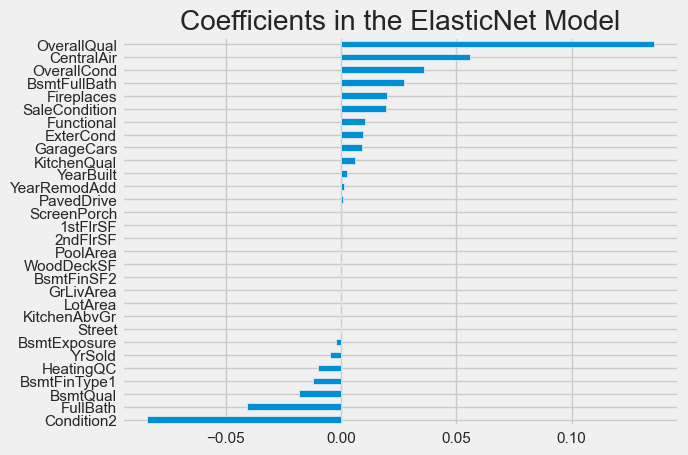

In [201]:
coef = pd.Series(elasticnet.coef_, index=X_train.columns)
important_features = coef.sort_values()
important_features.plot(kind="barh")
plt.title("Coefficients in the ElasticNet Model")


In [202]:
important_features

Condition2      -0.083984
FullBath        -0.040659
BsmtQual        -0.018160
BsmtFinType1    -0.012275
HeatingQC       -0.010133
YrSold          -0.004652
BsmtExposure    -0.002280
Street           0.000000
KitchenAbvGr     0.000000
LotArea          0.000004
GrLivArea        0.000033
BsmtFinSF2       0.000034
WoodDeckSF       0.000069
PoolArea         0.000159
2ndFlrSF         0.000206
1stFlrSF         0.000307
ScreenPorch      0.000319
PavedDrive       0.000866
YearRemodAdd     0.001415
YearBuilt        0.002562
KitchenQual      0.006021
GarageCars       0.009129
ExterCond        0.009378
Functional       0.010565
SaleCondition    0.019453
Fireplaces       0.019990
BsmtFullBath     0.027285
OverallCond      0.035809
CentralAir       0.055972
OverallQual      0.135544
dtype: float64

### Feature Creation

In [239]:
import numpy as np

def new_features(features):    
    features['TotalSF'] = features['TotalBsmtSF'] + features['1stFlrSF'] + features['2ndFlrSF']
    
    features['Total_Bathrooms'] = (
        features['FullBath'] + (0.5 * features['HalfBath']) +
        features['BsmtFullBath'] + (0.5 * features['BsmtHalfBath'])
    )    

    features['YearsSinceRemodel'] = features['YrSold'].astype(int) - features['YearRemodAdd'].astype(int)

    features['House_Age'] = features['YrSold'] - features['YearBuilt']
    
    features['reModeled'] = np.where(features['YearRemodAdd'] == features['YearBuilt'], 0, 1)
    features['isNew'] = np.where(features['YrSold'] == features['YearBuilt'], 1, 0)
    
    features['GarageYrBlt'] = features['GarageYrBlt'].astype('int')
    features['GarageYrBlt'] = features['YrSold'] - features['GarageYrBlt']
    features['YearBuilt'] = features['YrSold'] - features['YearBuilt']
    
    features.drop(["YrSold", "MoSold", "TotalBsmtSF", "BsmtFinSF1", "BsmtFinSF2", "1stFlrSF", 
                   "2ndFlrSF", "FullBath", "HalfBath", "BsmtFullBath", "BsmtHalfBath"], axis=1, inplace=True)

    return features

In [240]:
new_df=dataset.copy()
new_test=test.copy()

In [241]:
features = new_features(new_df)
features.shape

(1460, 72)

In [242]:

new_features(new_test)
new_test.shape

(1459, 71)

In [243]:
new_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,MiscVal,SaleType,SaleCondition,TotalSF,Total_Bathrooms,YearsSinceRemodel,House_Age,reModeled,isNew
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,8,4,1778.0,1.0,49,49,0,0
1,1462,20,3,81.0,14267,1,0,3,0,0,...,0,12500,8,4,2658.0,1.5,52,52,0,0
2,1463,60,3,74.0,13830,1,0,3,0,4,...,0,0,8,4,2557.0,2.5,12,13,1,0
3,1464,60,3,78.0,9978,1,0,3,0,4,...,0,0,8,4,2530.0,2.5,12,12,0,0
4,1465,120,3,43.0,5005,1,0,1,0,4,...,0,0,8,4,2560.0,2.0,18,18,0,0


## Feature Selection Approach 2 (Using OLS and  P-Values)

In [281]:
import pandas as pd
import statsmodels.api as sm

 

# Load your dataset into a pandas DataFrame
df_ols = features.copy()

 

#df_x=df.loc[:, df.columns != 'SalePrice']
# Drop a specific column
column_to_drop = 'SalePrice'
df_ols = df_ols.drop(column_to_drop, axis=1)

 

# Exclude columns of object datatype
df_numeric = df_ols.select_dtypes(exclude=['object'])

 

#X = df[['OverallQual','GrLivArea','TotalBsmtSF','GarageCars','1stFlrSF']]  # Replace with your feature columns
X = df_numeric
y = dataset['SalePrice']  # Replace with your target variable column

 

# Add a constant column to the features (required for the statsmodels library)
X = sm.add_constant(X)

 

# Fit the linear regression model and obtain p-values
model = sm.OLS(y,X).fit()
p_values = model.pvalues
print(p_values)
# Set the significance level (e.g., 0.05)
significance_level = 0.05

 

# Select features with p-values below the significance level
selected_features = p_values[p_values < significance_level].index


# Print the selected features
print("Total {} Selected features based on p-values which are:".format(len(selected_features)))
print("==============================================================================")

#Top Features on the basis of p-value
Top_Features=pd.DataFrame(selected_features,columns=['Top Features'])
Top_Features



const                0.159054
Id                   0.351909
MSSubClass           0.002259
MSZoning             0.582863
LotFrontage          0.017410
                       ...   
Total_Bathrooms      0.005558
YearsSinceRemodel    0.164916
House_Age            0.002796
reModeled            0.232323
isNew                0.181082
Length: 72, dtype: float64
Total 33 Selected features based on p-values which are:


,Top Features
0,MSSubClass
1,LotFrontage
2,LotArea
3,Street
4,LandContour
5,Neighborhood
6,Condition2
7,HouseStyle
8,OverallQual
9,OverallCond


In [247]:
feat_list_new=selected_features[1:]

In [248]:
feat_list_new

Index(['LotFrontage', 'LotArea', 'Street', 'LandContour', 'Neighborhood',
       'Condition2', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'RoofStyle', 'RoofMatl', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'BsmtQual', 'BsmtExposure', 'BsmtUnfSF', 'GrLivArea', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageCars', 'WoodDeckSF', 'ScreenPorch',
       'SaleCondition', 'TotalSF', 'Total_Bathrooms', 'House_Age'],
      dtype='object')

In [249]:
# Assuming you have an Index object called 'feat_list_new'
feat_list_new = list(feat_list_new)
feat_list_new.append('SalePrice')

print(feat_list_new)

['LotFrontage', 'LotArea', 'Street', 'LandContour', 'Neighborhood', 'Condition2', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtUnfSF', 'GrLivArea', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'ScreenPorch', 'SaleCondition', 'TotalSF', 'Total_Bathrooms', 'House_Age', 'SalePrice']


#### Correlation with SalePrice of 33 Selected Features

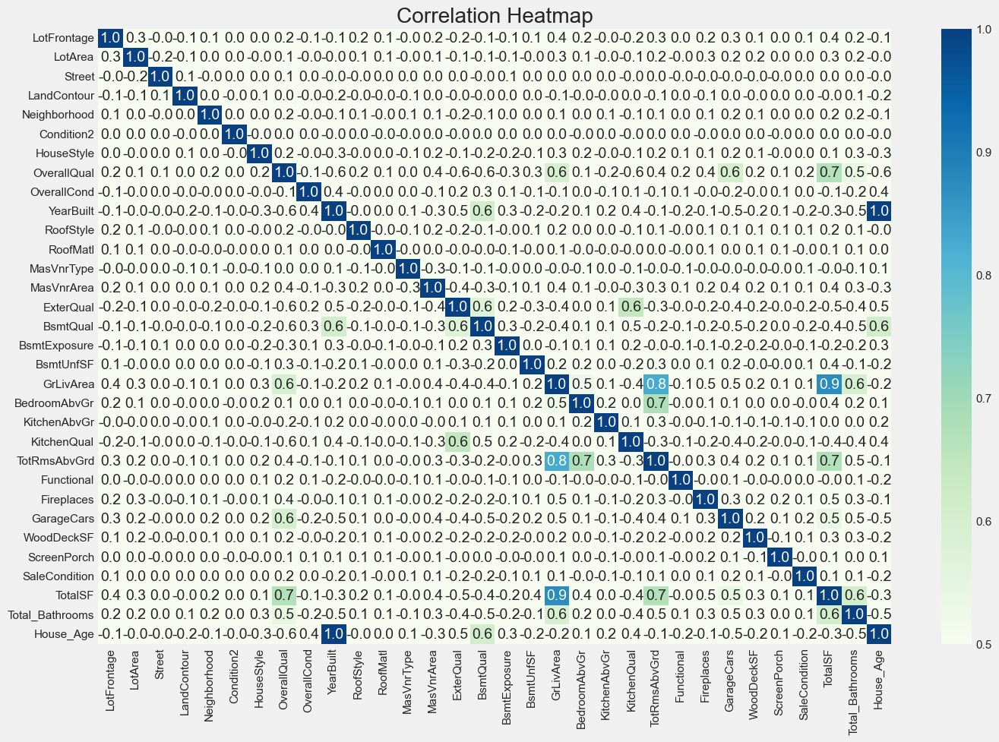

In [250]:
plot_correlation_heatmap(new_df, selected_features[1:])

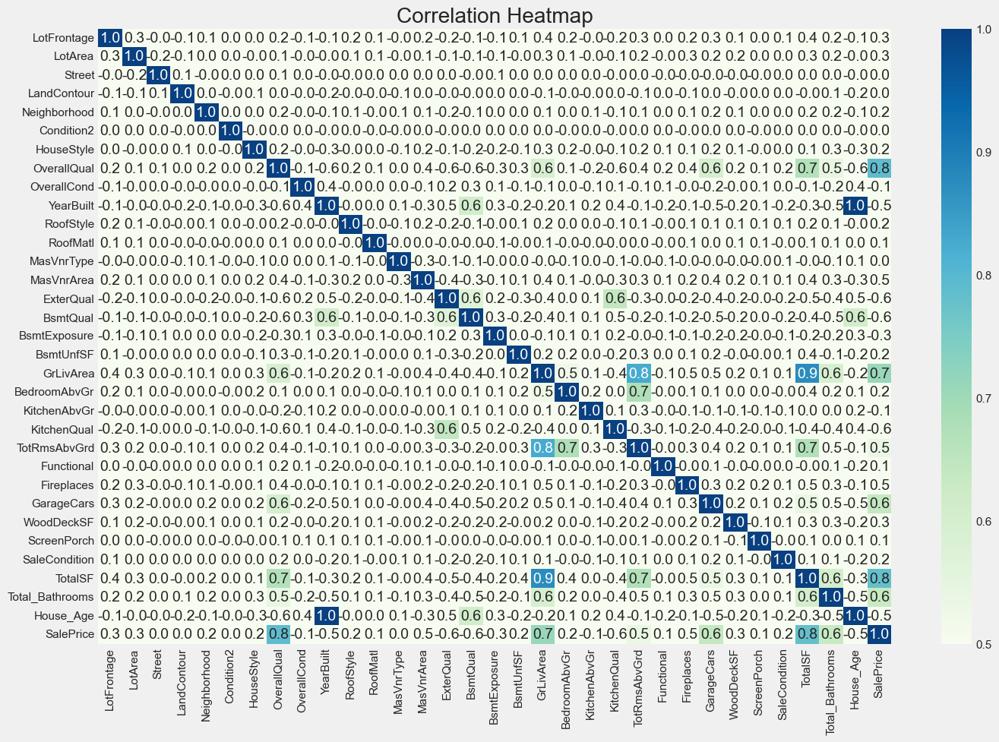

In [251]:
plot_correlation_heatmap(new_df, feat_list_new)

In [252]:
print(feat_list_new)

['LotFrontage', 'LotArea', 'Street', 'LandContour', 'Neighborhood', 'Condition2', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'BsmtQual', 'BsmtExposure', 'BsmtUnfSF', 'GrLivArea', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'ScreenPorch', 'SaleCondition', 'TotalSF', 'Total_Bathrooms', 'House_Age', 'SalePrice']


In [253]:
final_list=['TotalSF', 'GrLivArea', 'OverallQual', 'YearBuilt',
       'MasVnrArea', 'ExterQual', 'BsmtQual',
        'KitchenQual', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars',
       'Total_Bathrooms']

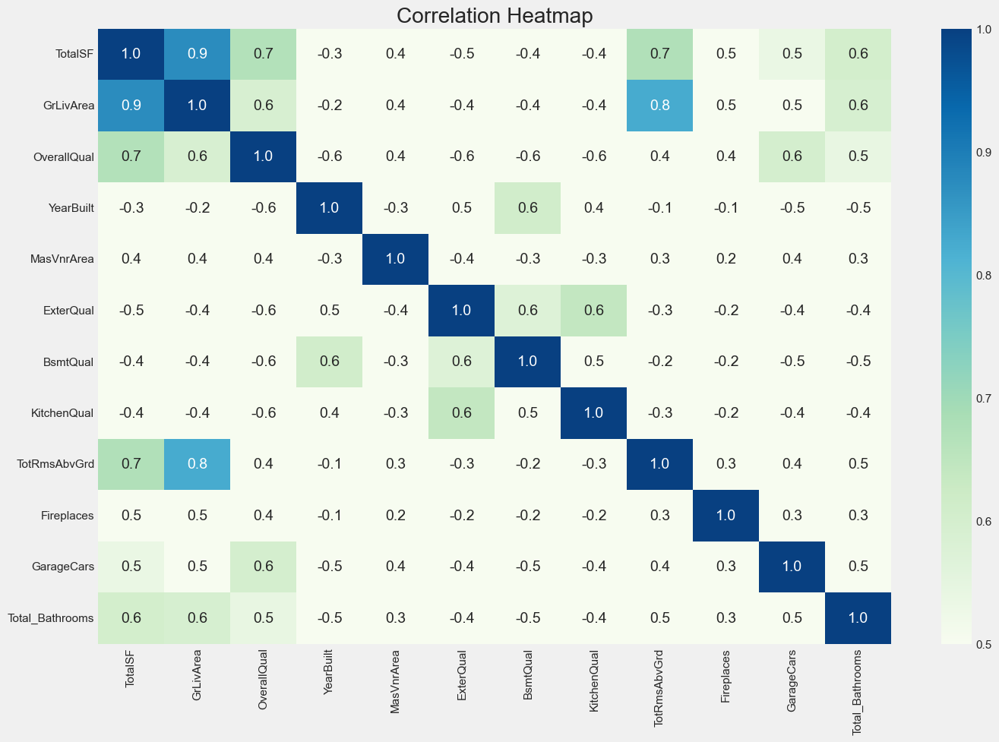

In [254]:
plot_correlation_heatmap(new_df, final_list)

In [255]:
# final_df = train_data.copy()
final_df = new_df.copy()
# final_df = skew_df.copy()

# Assuming you have your data stored in the `data` variable, where the last column is the target variable
X = final_df[final_list]  # Features
Y =  np.log1p(dataset["SalePrice"])  # Target variable

In [256]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
import numpy as np

def evaluation(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

        # Explore coefficients and intercept
        print("Coefficient values:")
        for col_name, coef in zip(x_train.columns, model.coef_):
            print("The coefficient for {} is {:.2f}".format(col_name, coef))

        intercept = model.intercept_
        print("The intercept for our model is {:.2f}".format(intercept))

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

In [257]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size = 0.25, random_state = 0)

#### LINEAR REGRESSION

In [258]:
reg_lin=LinearRegression()
reg_lin.fit(X_train,y_train)
# y_pred=reg_lin.predict(X_val)

evaluation(reg_lin, X_train, y_train, X_val, y_val, True)
evaluation(reg_lin, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.16
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.85
_______________________________________________

Cross-validation scores: [0.87723218 0.76471458 0.85492579 0.85859731 0.83479997]
Mean CV score: 0.8380539654917218
Standard deviation of CV scores: 0.03906628911137754

Coefficient values:
The coefficient for TotalSF is 0.00
The coefficient for GrLivArea is 0.00
The coefficient for OverallQual is 0.09
The coefficient for YearBuilt is -0.00
The coefficient for MasVnrArea is -0.00
The coefficient for ExterQual is 0.01
The coefficient for BsmtQual is -0.00
The coefficient for KitchenQual is -0.03
The coefficient for TotRmsAbvGrd is 0.00
The coefficient for Fireplaces is 0.07
The coefficient for GarageCars is 0.08
The coefficient for Total_Bathrooms is 0.07
The intercept for our model is 1

In [259]:
# test_pred = reg_lin.predict(test_data[selected_features[1:]])
test_pred = reg_lin.predict(new_test[final_list])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,105684.0
1,1462,141964.0
2,1463,166686.0
3,1464,186451.0
4,1465,194298.0


In [260]:
submission.to_csv("Result_based_on_LinearREG_Model_prat_withupdatedFeatures.csv", index = False, header = True)

#### LASSO (and tuning with GridSearchCV)

In [261]:
reg_lasso=Lasso()
reg_lasso.fit(X_train,y_train)

evaluation(reg_lasso, X_train, y_train, X_val, y_val, True)
evaluation(reg_lasso, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.20
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.14
_______________________________________________
R^2 Score: 0.76
_______________________________________________

Cross-validation scores: [0.78594689 0.64971174 0.75767957 0.80329612 0.79875447]
Mean CV score: 0.7590777590824904
Standard deviation of CV scores: 0.05694617885517038

Coefficient values:
The coefficient for TotalSF is 0.00
The coefficient for GrLivArea is 0.00
The coefficient for OverallQual is 0.00
The coefficient for YearBuilt is -0.00
The coefficient for MasVnrArea is 0.00
The coefficient for ExterQual is -0.00
The coefficient for BsmtQual is -0.00
The coefficient for KitchenQual is -0.00
The coefficient for TotRmsAbvGrd is -0.00
The coefficient for Fireplaces is 0.00
The coefficient for GarageCars is 0.00
The coefficient for Total_Bathrooms is 0.00
The intercept for our model is 

In [262]:
params_dict={'alpha':[0.001, 0.005, 0.01,0.05,0.1,0.5,1]}
reg_lasso_CV=GridSearchCV(estimator=Lasso(),param_grid=params_dict,scoring='neg_mean_squared_error',cv=10)
reg_lasso_CV.fit(X_train,y_train)
reg_lasso_CV.best_params_

{'alpha': 0.001}

In [263]:
def evaluation_v2(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

In [264]:
evaluation_v2(reg_lasso_CV, X_train, y_train, X_val, y_val, True)
evaluation_v2(reg_lasso_CV, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.16
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.85
_______________________________________________

Cross-validation scores: [0.87731518 0.76367654 0.85587703 0.86106981 0.83553694]
Mean CV score: 0.8386950995222492
Standard deviation of CV scores: 0.03981234973244506


Validation Result:
Root Mean Squared Error: 0.19
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.76
_______________________________________________

Cross-validation scores: [0.82949436 0.83656968 0.79290784 0.43616982 0.81152835]
Mean CV score: 0.74
Standard deviation of CV scores: 0.15


In [265]:
# test_pred = reg_lasso_CV.predict(test_data[selected_features])
test_pred = reg_lasso_CV.predict(new_test[final_list])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,106111.0
1,1462,142163.0
2,1463,166754.0
3,1464,185784.0
4,1465,194861.0


In [266]:
submission.to_csv("Result_based_on_LASSO_Model_prat_withupdatedFeatures.csv", index = False, header = True)

#### RIDGE (and tuning with GridSearchCV)

In [267]:
reg_ridge=Ridge()
reg_ridge.fit(X_train,y_train)

evaluation(reg_ridge, X_train, y_train, X_val, y_val, True)
evaluation(reg_ridge, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.16
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.85
_______________________________________________

Cross-validation scores: [0.87718588 0.76460781 0.85498384 0.85875728 0.83487779]
Mean CV score: 0.8380825200711841
Standard deviation of CV scores: 0.039117712240958426

Coefficient values:
The coefficient for TotalSF is 0.00
The coefficient for GrLivArea is 0.00
The coefficient for OverallQual is 0.09
The coefficient for YearBuilt is -0.00
The coefficient for MasVnrArea is -0.00
The coefficient for ExterQual is 0.01
The coefficient for BsmtQual is -0.00
The coefficient for KitchenQual is -0.03
The coefficient for TotRmsAbvGrd is 0.00
The coefficient for Fireplaces is 0.07
The coefficient for GarageCars is 0.08
The coefficient for Total_Bathrooms is 0.07
The intercept for our model is 

In [268]:
params_dict={'alpha':[0.1, 0.15, 0.20,0.25,0.30,0.35,0.4,0.45,0.50,0.55,0.60]}
reg_ridge_CV=GridSearchCV(estimator=Ridge(),param_grid=params_dict,scoring='neg_mean_squared_error',cv=10)
reg_ridge_CV.fit(X_train,y_train)
reg_ridge_CV.best_params_

{'alpha': 0.6}

In [269]:
evaluation_v2(reg_ridge, X_train, y_train, X_val, y_val, True)
evaluation_v2(reg_ridge, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.16
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.85
_______________________________________________

Cross-validation scores: [0.87718588 0.76460781 0.85498384 0.85875728 0.83487779]
Mean CV score: 0.8380825200711841
Standard deviation of CV scores: 0.039117712240958426


Validation Result:
Root Mean Squared Error: 0.19
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.76
_______________________________________________

Cross-validation scores: [0.82566129 0.83527674 0.79202619 0.44100332 0.81139046]
Mean CV score: 0.74
Standard deviation of CV scores: 0.15


In [270]:
# test_pred = reg_lasso_CV.predict(test_data[selected_features])
test_pred = reg_ridge_CV.predict(new_test[final_list])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,105697.0
1,1462,141981.0
2,1463,166695.0
3,1464,186436.0
4,1465,194299.0


In [271]:
submission.to_csv("Result_based_on_RIDGE_Model_prat_withupdatedFeatures.csv", index = False, header = True)

#### ElasticNet (and tuning with GridSearchCV)

##### Conduct hyperparameter tuning for the ElasticNet.

In [272]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

alpha = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
max_iter = [1000, 10000]
l1_ratio = np.arange(0.0, 1.0, 0.1)
tol = [0.5]

elasticnet_gscv = GridSearchCV(estimator=ElasticNet(), 
                                param_grid={'alpha': alpha,
                                            'max_iter': max_iter,
                                            'l1_ratio': l1_ratio,
                                            'tol':tol},   
                                scoring='r2',
                                cv=5)

In [273]:
elasticnet_gscv.fit(X, Y)
elasticnet_gscv.best_params_

{'alpha': 0.1, 'l1_ratio': 0.0, 'max_iter': 1000, 'tol': 0.5}

In [274]:
elasticnet = ElasticNet(alpha = elasticnet_gscv.best_params_['alpha'], 
                        max_iter = elasticnet_gscv.best_params_['max_iter'],
                        l1_ratio = elasticnet_gscv.best_params_['l1_ratio'],
                        tol = elasticnet_gscv.best_params_['tol'])
elasticnet.fit(X_train, y_train)

ElasticNet(alpha=0.1, l1_ratio=0.0, tol=0.5)

In [275]:
evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, True)
evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.18
_______________________________________________
Mean Squared Error: 0.03
_______________________________________________
Mean Absolute Error: 
0.13
_______________________________________________
R^2 Score: 0.81
_______________________________________________

Cross-validation scores: [0.83780269 0.68816521 0.83203716 0.84184016 0.81781368]
Mean CV score: 0.8035317780023605
Standard deviation of CV scores: 0.058254616719065615


Validation Result:
Root Mean Squared Error: 0.25
_______________________________________________
Mean Squared Error: 0.06
_______________________________________________
Mean Absolute Error: 
0.13
_______________________________________________
R^2 Score: 0.59
_______________________________________________

Cross-validation scores: [ 0.88551383  0.85462273  0.80017401 -0.05414725  0.85783822]
Mean CV score: 0.67
Standard deviation of CV scores: 0.36


**Here is a summary of each model's performance based on the above results:**

#### LASSO:

- Train Result: The LASSO model achieved a Root Mean Squared Error (RMSE) of 0.16, Mean Squared Error (MSE) of 0.02, and Mean Absolute Error (MAE) of 0.11. The R-squared (R^2) score is 0.85, indicating that approximately 85% of the variance in the target variable is explained by the model. The cross-validation scores have a mean of 0.84 and a standard deviation of 0.04, suggesting good generalization performance.
- Validation Result: The model's performance on the validation data shows an RMSE of 0.19, MSE of 0.04, and MAE of 0.11. The R^2 score is 0.76, indicating that around 76% of the variance in the target variable is explained. The cross-validation scores have a mean of 0.74 and a standard deviation of 0.15.

#### RIDGE:

- Train Result: The Ridge model achieved similar performance to LASSO, with an RMSE of 0.16, MSE of 0.02, and MAE of 0.11. The R^2 score is 0.85, indicating a good fit. The cross-validation scores have a mean of 0.84 and a standard deviation of 0.04, suggesting reasonable generalization.
- Validation Result: The Ridge model's performance on the validation data is also similar to LASSO, with an RMSE of 0.19, MSE of 0.04, and MAE of 0.11. The R^2 score is 0.76, indicating a moderate fit. The cross-validation scores have a mean of 0.74 and a standard deviation of 0.15.

#### ElasticNet:

- Train Result: The ElasticNet model achieved an RMSE of 0.18, MSE of 0.03, and MAE of 0.13. The R^2 score is 0.81, indicating that approximately 81% of the variance in the target variable is explained. The cross-validation scores have a mean of 0.80 and a standard deviation of 0.06, suggesting decent generalization.
- Validation Result: The model's performance on the validation data shows an RMSE of 0.25, MSE of 0.06, and MAE of 0.13. The R^2 score is 0.59, indicating a moderate fit. The cross-validation scores have a mean of 0.67 and a relatively high standard deviation of 0.36.

**In summary, based on the provided results:**

- LASSO and Ridge models exhibit similar performance, with slightly better performance than ElasticNet.
- LASSO and Ridge models have comparable metrics for both train and validation results, indicating consistent performance.
- ElasticNet shows relatively higher errors and lower R^2 scores compared to LASSO and Ridge models, indicating slightly weaker performance.




In [276]:
# test_pred = reg_lasso_CV.predict(test_data[selected_features])
test_pred = elasticnet.predict(new_test[final_list])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,109676.0
1,1462,158831.0
2,1463,169760.0
3,1464,179629.0
4,1465,208923.0


In [277]:
submission.to_csv("Result_based_on_ElasticNet_Model_prat_withupdatedFeatures.csv", index = False, header = True)

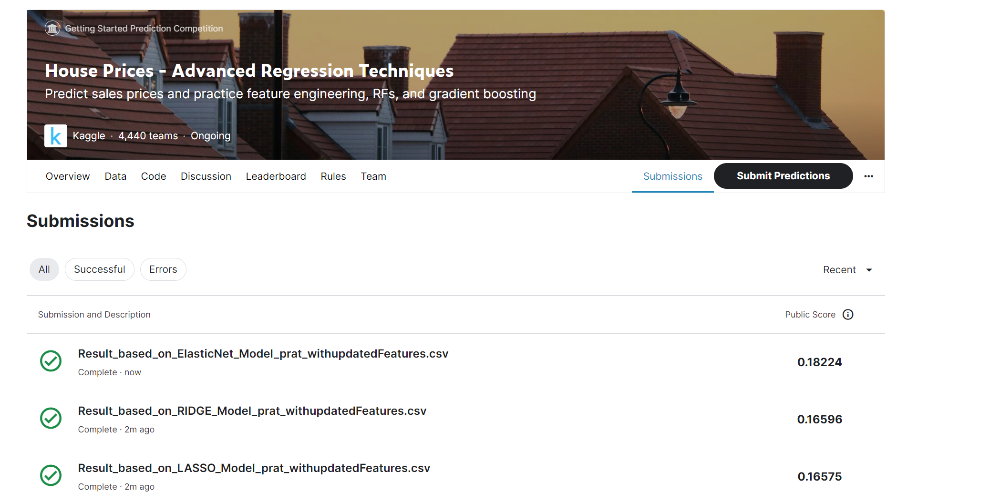

**In summary, based on the Kaggle scores:**

- The Lasso model achieved the best Kaggle score of 0.16575, followed closely by the Ridge model with a Kaggle score of 0.16596. 
- The ElasticNet model obtained a slightly lower Kaggle score of 0.18224.
- Both Lasso and Ridge models perform similarly and outperform the ElasticNet model based on the Kaggle scores.


Text(0.5, 1.0, 'Coefficients in the ElasticNet Model')

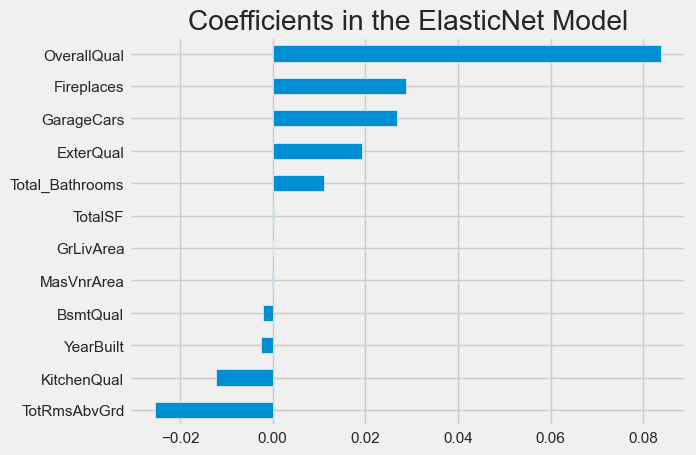

In [278]:
coef = pd.Series(elasticnet.coef_, index=X_train.columns)
important_features = coef.sort_values()
important_features.plot(kind="barh")
plt.title("Coefficients in the ElasticNet Model")

**Observations:**
- Features such as "BsmtQual","YearBuilt" , "KitchenQual" and "TotRmsAbvGrd" have negative coefficients, indicating that higher values of these features are associated with lower predicted Sale Prices.

- On the other hand, features like "GarageCars," "OverallQual," "ExterQual," "Fireplaces"  have positive coefficients. This means that higher values of these features are associated with higher predicted Sale Prices.

- Among these positive coefficients, "OverallQual" has the highest magnitude, indicating that the overall quality of the house has the most significant impact on the predicted Sale Price.

- Additionally, features such as "Fireplaces," "GarageCars," also have relatively high positive coefficients, indicating that the presence of a fireplace, the overall condition of the house, and certain GarageCars exposures contribute significantly to higher predicted Sale Prices.

In [279]:
important_features

TotRmsAbvGrd      -0.025457
KitchenQual       -0.012121
YearBuilt         -0.002574
BsmtQual          -0.002169
MasVnrArea        -0.000102
GrLivArea          0.000046
TotalSF            0.000333
Total_Bathrooms    0.011151
ExterQual          0.019258
GarageCars         0.026797
Fireplaces         0.028741
OverallQual        0.083790
dtype: float64

## Feature Selection Approach 3 with RFE, Random Forest, Linear Models

In [203]:
# First extract the target variable which is our House prices
Y = dataset['SalePrice'].values
# Drop price from the house dataframe and create a matrix out of the house data
house = dataset.drop(['SalePrice'], axis=1)
X = house.values
# Store the column/feature names into a list "colnames"
colnames = house.columns

In [204]:
Y

array([208500, 181500, 223500, ..., 266500, 142125, 147500], dtype=int64)

In [205]:
X

array([[1.000e+00, 6.000e+01, 3.000e+00, ..., 2.008e+03, 8.000e+00,
        4.000e+00],
       [2.000e+00, 2.000e+01, 3.000e+00, ..., 2.007e+03, 8.000e+00,
        4.000e+00],
       [3.000e+00, 6.000e+01, 3.000e+00, ..., 2.008e+03, 8.000e+00,
        4.000e+00],
       ...,
       [1.458e+03, 7.000e+01, 3.000e+00, ..., 2.010e+03, 8.000e+00,
        4.000e+00],
       [1.459e+03, 2.000e+01, 3.000e+00, ..., 2.010e+03, 8.000e+00,
        4.000e+00],
       [1.460e+03, 2.000e+01, 3.000e+00, ..., 2.008e+03, 8.000e+00,
        4.000e+00]])

In [206]:
# Define dictionary to store our rankings
ranks = {}
# Create our function which stores the feature rankings to the ranks dictionary
def ranking(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x,2), ranks)
    return dict(zip(names, ranks))

In [207]:
from sklearn.feature_selection import RFE, f_regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso 
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor

### Recursive Feature Elimination ( RFE )

**Recursive Feature Elimination or RFE uses a model ( eg. linear Regression or SVM) to select either the best or worst-performing feature, and then excludes this feature.** 

In [208]:
# Construct our Linear Regression model
lr = LinearRegression()
lr.fit(X,Y)
#stop the search when only the last feature is left
rfe = RFE(lr, n_features_to_select=1, verbose =3 )
rfe.fit(X,Y)
ranks["RFE"] = ranking(list(map(float, rfe.ranking_)), colnames, order=-1)

Fitting estimator with 76 features.
Fitting estimator with 75 features.
Fitting estimator with 74 features.
Fitting estimator with 73 features.
Fitting estimator with 72 features.
Fitting estimator with 71 features.
Fitting estimator with 70 features.
Fitting estimator with 69 features.
Fitting estimator with 68 features.
Fitting estimator with 67 features.
Fitting estimator with 66 features.
Fitting estimator with 65 features.
Fitting estimator with 64 features.
Fitting estimator with 63 features.
Fitting estimator with 62 features.
Fitting estimator with 61 features.
Fitting estimator with 60 features.
Fitting estimator with 59 features.
Fitting estimator with 58 features.
Fitting estimator with 57 features.
Fitting estimator with 56 features.
Fitting estimator with 55 features.
Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 fe

#### Linear Models Feature Ranking

In [209]:
# Using Linear Regression
lr = LinearRegression()
lr.fit(X,Y)
ranks["LinReg"] = ranking(np.abs(lr.coef_), colnames)

# Using Ridge 
ridge = Ridge(alpha = 7)
ridge.fit(X,Y)
ranks['Ridge'] = ranking(np.abs(ridge.coef_), colnames)

# Using Lasso
lasso = Lasso(alpha=.05)
lasso.fit(X, Y)
ranks["Lasso"] = ranking(np.abs(lasso.coef_), colnames)

#### Random Forest Feature Ranking
Sklearn's Random Forest model also comes with it's own inbuilt feature ranking attribute.

In [210]:
rf = RandomForestRegressor(n_jobs=-1, n_estimators=50, verbose=3)
rf.fit(X,Y)
ranks["RF"] = ranking(rf.feature_importances_, colnames);

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    0.1s finished


building tree 1 of 50building tree 2 of 50
building tree 3 of 50

building tree 4 of 50
building tree 5 of 50
building tree 6 of 50
building tree 7 of 50
building tree 8 of 50
building tree 9 of 50
building tree 10 of 50
building tree 11 of 50
building tree 12 of 50
building tree 13 of 50
building tree 14 of 50
building tree 15 of 50
building tree 16 of 50
building tree 17 of 50
building tree 18 of 50
building tree 19 of 50
building tree 20 of 50
building tree 21 of 50
building tree 22 of 50
building tree 23 of 50
building tree 24 of 50
building tree 25 of 50
building tree 26 of 50
building tree 27 of 50
building tree 28 of 50
building tree 29 of 50
building tree 30 of 50
building tree 31 of 50
building tree 32 of 50
building tree 33 of 50
building tree 34 of 50
building tree 35 of 50
building tree 36 of 50
building tree 37 of 50
building tree 38 of 50
building tree 39 of 50
building tree 40 of 50
building tree 41 of 50
building tree 42 of 50
building tree 43 of 50
building tree 44 of 

### Feature Ranking Matrix

**We combine the scores from the various methods above and output it in a matrix form for convenient viewing as such:**

In [282]:
pd.set_option('display.max_rows', 100)
# Create empty dictionary to store the mean value calculated from all the scores
r = {}
for name in colnames:
    r[name] = round(np.mean([ranks[method][name] for method in ranks.keys()]), 2)

methods = sorted(ranks.keys())

# Create a DataFrame to store the results
df_rank = pd.DataFrame(columns=methods)

for name in colnames:
    df_rank.loc[name] = [ranks[method][name] for method in methods]

mean_column = df_rank['Mean']
df_rank = df_rank.drop(columns=['Mean'])
df_rank['Mean'] = mean_column
df_rank.reset_index(inplace=True)
df_rank.rename(columns={'index': 'Features'}, inplace=True)
df_rank.sort_values('Mean', ascending=False,inplace=True)
df_rank.reset_index(inplace=True,drop=True)

df_rank

,Features,Lasso,LinReg,RF,RFE,Ridge,Mean
0,Utilities,1.00,1.00,0.00,0.91,0.48,0.68
1,OverallQual,0.21,0.21,1.00,1.00,0.90,0.66
2,Street,0.57,0.56,0.00,0.97,1.00,0.62
3,GarageCars,0.21,0.21,0.03,0.92,0.84,0.44
4,KitchenAbvGr,0.22,0.22,0.00,0.85,0.75,0.41
5,ExterQual,0.18,0.18,0.00,0.96,0.71,0.41
6,KitchenQual,0.16,0.16,0.00,0.88,0.69,0.38
7,Condition2,0.17,0.17,0.00,0.69,0.68,0.34
8,BsmtFullBath,0.13,0.13,0.00,0.93,0.53,0.34
9,LandSlope,0.12,0.12,0.00,0.99,0.43,0.33


In [212]:
# Put the mean scores into a Pandas dataframe
meanplot = pd.DataFrame(list(r.items()), columns= ['Feature','Mean Ranking'])

# Sort the dataframe
meanplot = meanplot.sort_values('Mean Ranking', ascending=False)

In [213]:
imp_features = meanplot[meanplot['Mean Ranking'] >= 0.2]
imp_features.reset_index(inplace=True,drop=True)
imp_features

,Feature,Mean Ranking
0,Utilities,0.68
1,OverallQual,0.66
2,Street,0.62
3,GarageCars,0.44
4,KitchenAbvGr,0.41
5,ExterQual,0.41
6,KitchenQual,0.38
7,Condition2,0.34
8,BsmtFullBath,0.34
9,LandSlope,0.33


<Figure size 4000x1500 with 0 Axes>

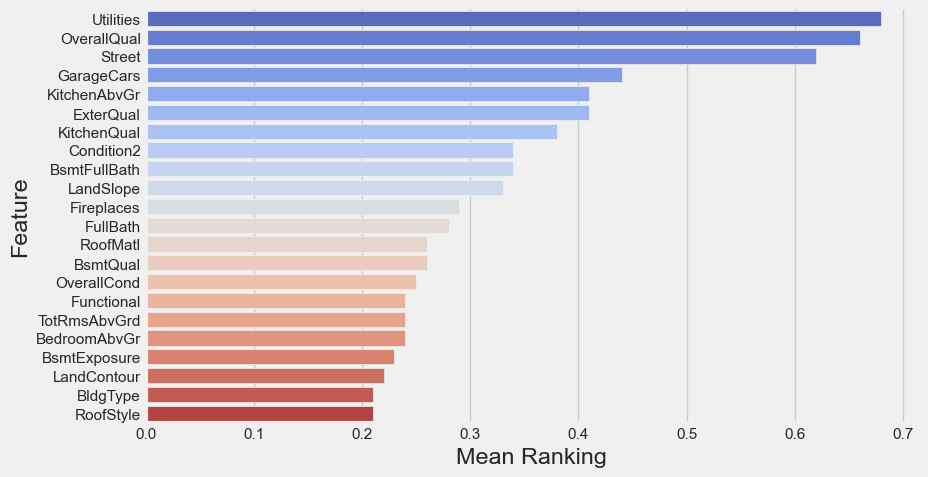

In [214]:
# Let's plot the ranking of the features
plt.figure(figsize=(40, 15))
sns.catplot(x="Mean Ranking", y="Feature", data = imp_features, kind="bar", 
               aspect=1.9, palette='coolwarm')

#### Correlation with SalePrice for Top 10 Features

In [215]:
# based on above importance we have selected with importance factor greater than >0.30

final_list_2=['Utilities', 'OverallQual','Street','GarageCars', 'KitchenAbvGr',
  'ExterQual', 'KitchenQual', 'Condition2', 'BsmtFullBath', 'LandSlope']

In [217]:
# final_df = train_data.copy()
final_df = dataset.copy()
# final_df = skew_df.copy()

# Assuming you have your data stored in the `data` variable, where the last column is the target variable
X = final_df[final_list_2]  # Features
Y =  np.log1p(dataset["SalePrice"])  # Target variable

In [218]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [219]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV

alpha = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]
max_iter = [1000, 10000]
l1_ratio = np.arange(0.0, 1.0, 0.1)
tol = [0.5]

elasticnet_gscv = GridSearchCV(estimator=ElasticNet(), 
                                param_grid={'alpha': alpha,
                                            'max_iter': max_iter,
                                            'l1_ratio': l1_ratio,
                                            'tol':tol},   
                                scoring='r2',
                                cv=5)

In [220]:
elasticnet_gscv.fit(X, Y)
elasticnet_gscv.best_params_

{'alpha': 0.001, 'l1_ratio': 0.1, 'max_iter': 1000, 'tol': 0.5}

In [221]:
elasticnet = ElasticNet(alpha = elasticnet_gscv.best_params_['alpha'], 
                        max_iter = elasticnet_gscv.best_params_['max_iter'],
                        l1_ratio = elasticnet_gscv.best_params_['l1_ratio'],
                        tol = elasticnet_gscv.best_params_['tol'])
elasticnet.fit(X_train, y_train)

evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, True)
evaluation_v2(elasticnet, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.20
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.15
_______________________________________________
R^2 Score: 0.75
_______________________________________________

Cross-validation scores: [0.78674544 0.71943754 0.75529752 0.75489057 0.65545046]
Mean CV score: 0.7343643065077433
Standard deviation of CV scores: 0.04484085924281307


Validation Result:
Root Mean Squared Error: 0.20
_______________________________________________
Mean Squared Error: 0.04
_______________________________________________
Mean Absolute Error: 
0.15
_______________________________________________
R^2 Score: 0.74
_______________________________________________

Cross-validation scores: [0.77042218 0.70107629 0.70595382 0.73816655 0.76922771]
Mean CV score: 0.74
Standard deviation of CV scores: 0.03


In [222]:
# test_pred = reg_lasso_CV.predict(test_data[selected_features])
test_pred = elasticnet.predict(test[final_list_2])

test_pred = np.expm1(test_pred)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,113232.0
1,1462,138882.0
2,1463,132284.0
3,1464,162249.0
4,1465,239182.0


**Based on the evaluation of the models using only the features with an importance factor greater than 0.30, here are the summarized results and performance evaluation:**

#### Model_summary:

- Train Result: The model achieved an RMSE of 0.20, MSE of 0.04, and MAE of 0.15. The R^2 score is 0.75, indicating that approximately 75% of the variance in the target variable is explained by the model. The cross-validation scores have a mean of 0.73 and a standard deviation of 0.04, suggesting reasonably good generalization performance.
- Validation Result: The model's performance on the validation data shows an RMSE of 0.20, MSE of 0.04, and MAE of 0.15. The R^2 score is 0.74, indicating that around 74% of the variance in the target variable is explained. The cross-validation scores have a mean of 0.74 and a standard deviation of 0.03.
- Kaggle Score: The model achieved a Kaggle score of 0.20359 on the test data.

#### Performance Evaluation:

- The model shows moderate performance with an RMSE of 0.20, indicating the average prediction error of approximately 0.20 units.
- The R^2 score of 0.75 suggests that the model captures a substantial portion of the variance in the target variable.
- The cross-validation scores indicate that the model's performance is consistent across different subsets of the data, with a mean CV score of 0.73.
- The Kaggle score of 0.20359 suggests that the model's performance on the test data is reasonable.

In short we can say that  the model exhibits decent performance, but there is room for improvement. Further analysis and refinement may be necessary to enhance the model's predictive power and reduce the prediction errors.

In [223]:
submission.to_csv("Result_based_on_ElasticNet_Model_withupdated_features_prat.csv", index = False, header = True)

Text(0.5, 1.0, 'Coefficients in the ElasticNet Model')

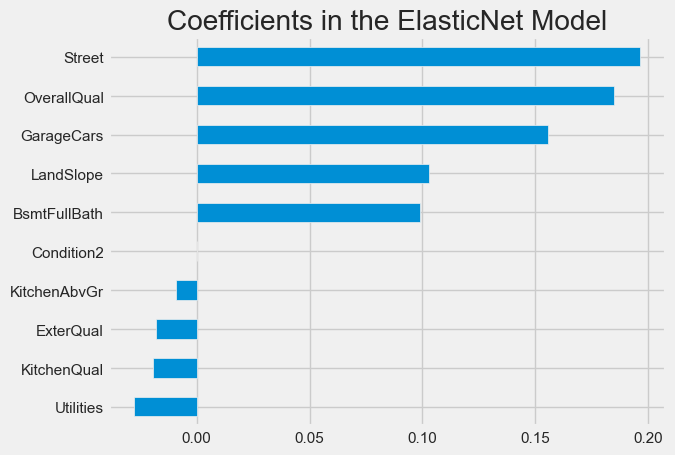

In [224]:
coef = pd.Series(elasticnet.coef_, index=X_train.columns)
important_features = coef.sort_values()
important_features.plot(kind="barh")
plt.title("Coefficients in the ElasticNet Model")

In [226]:
def plot_correlation_heatmap(data, column_names):
    # Create correlation matrix from data excluding the last column
    corr_mat = data[column_names].corr()

    # Plot correlation heatmap
    plt.figure(figsize=(15, 10))
    sns.heatmap(corr_mat,
                annot=True,
                fmt='.1f',
                cmap='GnBu',
                vmin=0.5,
                vmax=1)
    plt.title('Correlation Heatmap')
    plt.show()


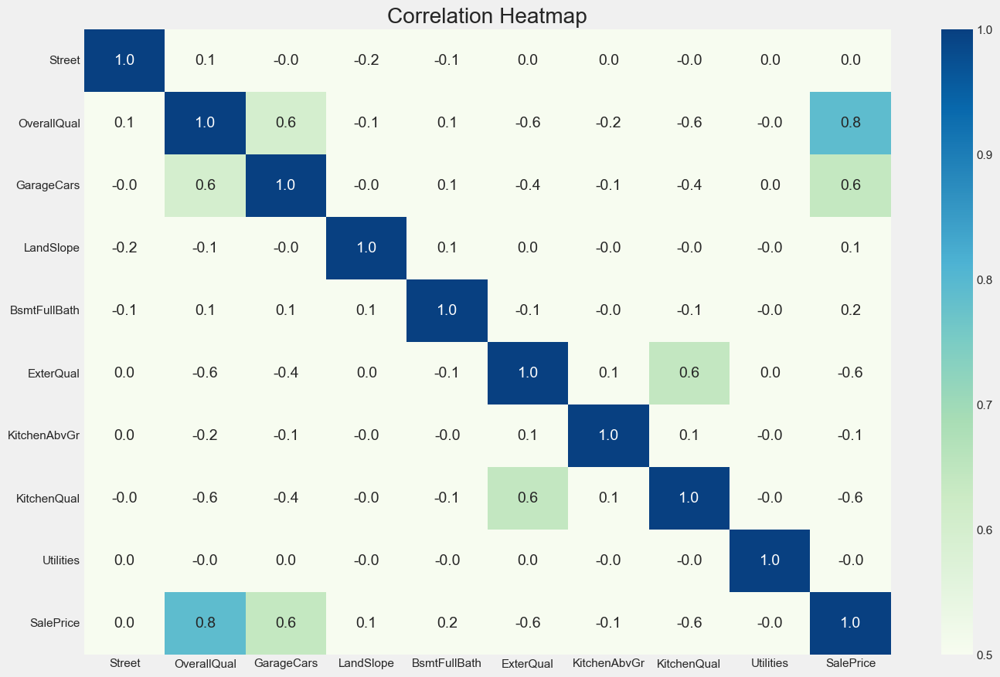

In [227]:
#final_list_2=['Utilities', 'OverallQual','Street','GarageCars', 'KitchenAbvGr',
#  'ExterQual', 'KitchenQual', 'Condition2', 'BsmtFullBath', 'LandSlope']

final_list=['Street', 'OverallQual', 'GarageCars',
  'LandSlope', 'BsmtFullBath', 'ExterQual', 'KitchenAbvGr', 'KitchenQual','Utilities','SalePrice']
plot_correlation_heatmap(dataset, final_list)

### Conclusion And Summary

In this project, I have conducted a cpntinued EDA  (from last week analysis ) to understand the numerical and categorical data and important features. Based on exploratory analysis, I performed data preprocessing and feature engineering. 
Finally, I have trained linear,
- lasso
- ridge
- Elasticnet 

**These  models  are compared on the basis of RMSE,R2 and Cross Validation scores.**

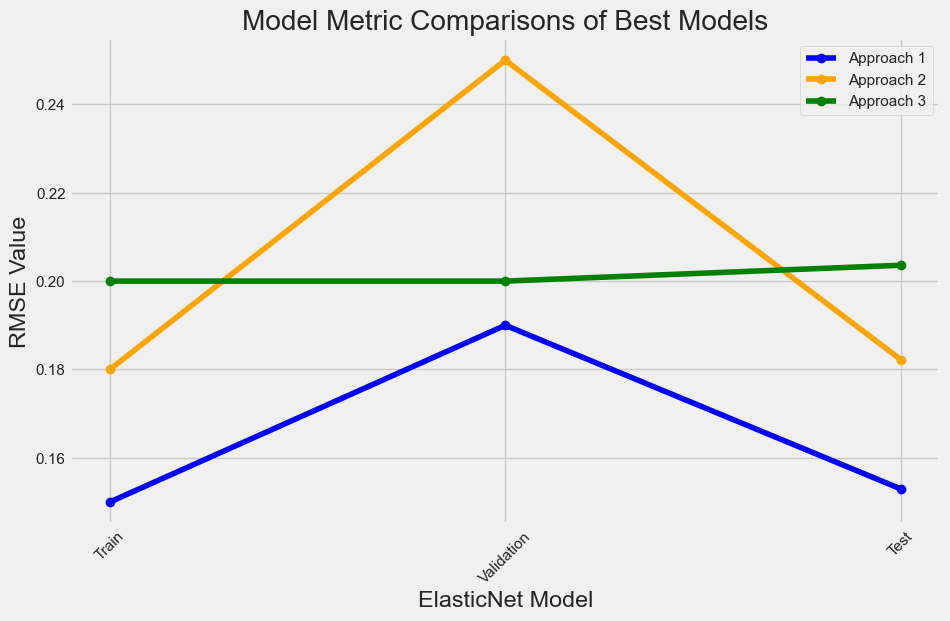

In [283]:
import matplotlib.pyplot as plt

# Define the model names
model_names = ['Train', 'Validation', 'Test']

# Define the evaluation metrics for Approach 1 and Approach 2
approach1_rmse = [0.15, 0.19, 0.15297]
approach2_rmse = [0.18, 0.25, 0.18224]
approach3_rmse = [0.20, 0.20, 0.20359]
# Define the colors for Approach 1 and Approach 2
approach1_color = 'blue'
approach2_color = 'orange'
approach3_color = 'green'
# Plotting the metrics
plt.figure(figsize=(10, 6))

plt.plot(model_names, approach1_rmse, marker='o', color=approach1_color, label='Approach 1')
plt.plot(model_names, approach2_rmse, marker='o', color=approach2_color, label='Approach 2')
plt.plot(model_names, approach3_rmse, marker='o', color=approach3_color, label='Approach 3')

plt.title('Model Metric Comparisons of Best Models')
plt.xlabel('ElasticNet Model')
plt.ylabel('RMSE Value')

plt.xticks(rotation=45)
plt.grid(True)
plt.legend()

plt.show()

## Kaggle Submission

### User Name: YushVats

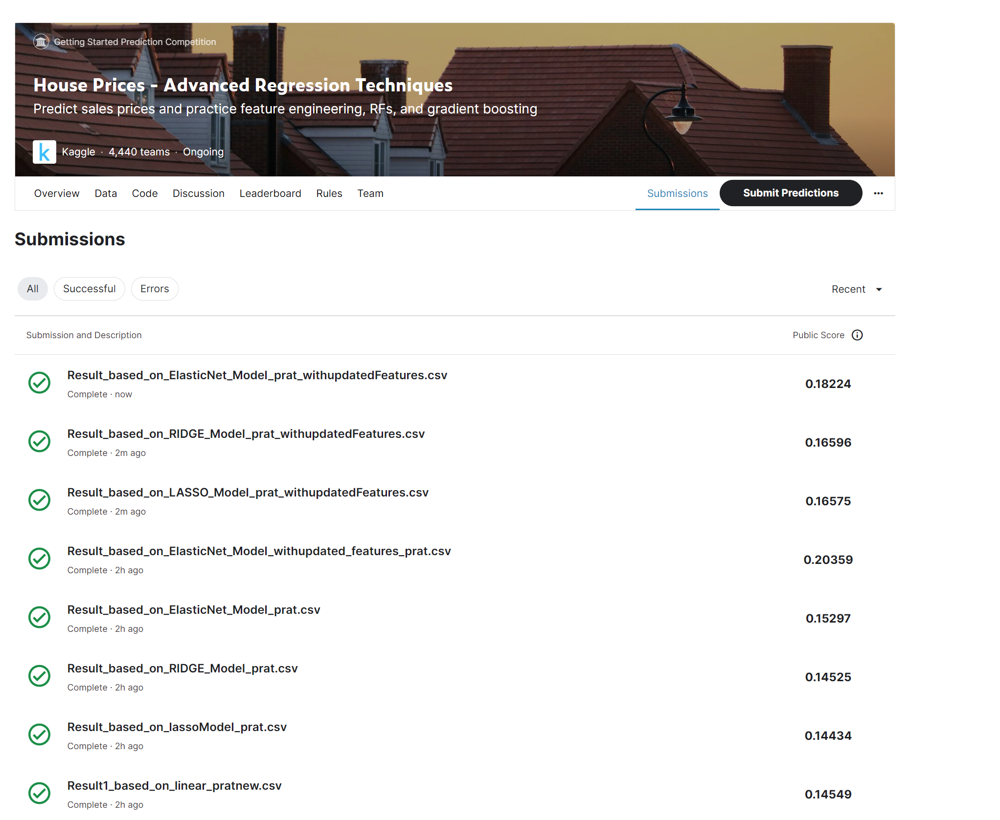

#### Evaluate performance of the model using the Kaggle metric upon which your scores are evaluated.

To evaluate the performance of the models using the Kaggle metric based on the provided scores, we can analyze the Kaggle scores for each model and compare them. The model with the lowest Kaggle score is generally considered to have better performance.

**Based on the provided matrix:**

- elasticnet_model_with_new_features: Kaggle Score = 0.20359
- elasticnet_model_with_default_features: Kaggle Score = 0.15297
- RIDGE_MODEL_with_new_Feature: Kaggle Score = 0.18224
- RIDGE_MODEL_with_default_Feature: Kaggle Score = 0.14525
- LASSO_MODEL_with_new_Feature: Kaggle Score = 0.16575
- LASSO_MODEL_with_default_Feature: Kaggle Score = 0.14434
- Linear_Regression_MODEL_with_default_Feature: Kaggle Score = 0.14549

**From the scores above, we can observe the following:**

- The model "LASSO_MODEL_with_default_Feature" has the lowest Kaggle score of 0.14434, indicating the best performance among the provided models.
- The "RIDGE_MODEL_with_default_Feature" and "Linear_Regression_MODEL_with_default_Feature" models have similar Kaggle scores of 0.14525 and 0.14549, respectively, suggesting comparable performance.
- The "elasticnet_model_with_default_features" model has a slightly higher Kaggle score of 0.15297, indicating a slightly worse performance compared to the models with lower scores.
- The "LASSO_MODEL_with_new_Feature" and "RIDGE_MODEL_with_new_Feature" models have higher Kaggle scores of 0.16575 and 0.18224, respectively, indicating relatively lower performance compared to the models with lower scores.

In summary, based on the provided Kaggle scores, the "LASSO_MODEL_with_default_Feature" model achieved the best performance among the listed models, followed by the "RIDGE_MODEL_with_default_Feature" and "Linear_Regression_MODEL_with_default_Feature" models.

## Below part is kept from last week submission.

## Week2 Submission kept below for continued work

### Management/Research Question
In layman’s terms, what is the management/research question of interest, and why would anyone care? 

**This question is significant because it helps individuals and organizations involved in the real estate market make informed decisions and understand the value of a property.**

**Here's why different stakeholders should care about this question:**

- **Homeowners:** Homeowners are interested in understanding how specific features and factors can impact the value of their homes. This knowledge allows them to make informed decisions about renovations, pricing, and future investments in order to maximize the value of their properties.

- **Real Estate Agents:** Real estate agents can provide better service to their clients by having knowledge about the factors that influence house prices. This allows them to give accurate pricing recommendations and insights, helping their clients make informed decisions about buying or selling a home.

- **Property Developers:** Property developers need to understand the relationship between housing features and sale prices in order to make strategic decisions about property design, amenities, and target markets. This knowledge helps them create successful and desirable developments that meet market demand.

- **Policy Makers:** Policy makers can use housing market data to analyze the demand for specific types of housing and identify areas that require revitalization or infrastructure development. By formulating effective policies based on this information, they can address housing needs and ensure a well-functioning housing market.

In short we can say that  understanding the factors that influence housing prices is crucial for various stakeholders as it enables them to make better decisions related to buying, selling, developing, and regulating housing.

### Requirements

1. Conduct your analysis using a cross-validation design.
2. Conduct EDA and provide appropriate visualizations in the process.
3. Build a minimum of two separate regression models using the training set.
4. Evaluate polynomial, indicator, dichotomous, & piecewise model components.
5. Create at least one feature from the data set.
6. Evaluate the models’ assumptions.
7. Evaluate goodness of fit metrics on the training and validation sets.
8. Submit predictions for the unseen test set available on Kaggle.com.
9. Provide your Kaggle user name and a screen snapshot of your Kaggle scores.
10. Discuss what your models tell you in layman’s terms

### Import Libraries 

In [130]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec 
from scipy import stats
import seaborn as sns
from scipy.stats import skew
sns.set()
import datetime

import warnings
warnings.simplefilter(action='ignore')

### Load Data

In [131]:
train= pd.read_csv("train.csv")
test = pd.read_csv('test.csv')


### Section1. 
#### Conduct EDA and provide appropriate visualizations in the process.

In [132]:
#first 5 rows
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [133]:
#Number of rows and columns
train.shape,test.shape

((1460, 81), (1459, 80))

In [134]:
#information of dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [135]:
#Description of our dataset
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [136]:
'''
1- Positive skewness occurs when the tail of the distribution extends to the right
2- Negative skewness occurs when the tail of the distribution extends to the left
3- A symmetrical distribution has a skewness of 0,
'''
skew = train. skew()
skew

Id                0.000000
MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchenAbvGr      4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.649415
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
S

#### Numerical Variables

In [137]:
#Dropping & SalePrice
df_train = train.drop(['Id', 'SalePrice'], axis=1)
df_test = test.drop('Id', axis=1)

In [138]:
# List of Numerical Features
num_list = [f for f in train.columns if train.dtypes[f] != 'object']
num_list.remove('SalePrice')

# Selecting columns excluding the object (string) data type as numerical variables
num_var_train = df_train.select_dtypes(exclude='object')
num_var_test = df_test.select_dtypes(exclude='object')

# Printing the number of numerical features in the dataset
print("Number of numerical features in train dataset are: ", num_var_train.shape[1])
print("Number of numerical features in test dataset are: ", num_var_test.shape[1])

Number of numerical features in train dataset are:  36
Number of numerical features in test dataset are:  36


In [139]:
discrete=[]
for col in train.columns:
  if train[col].dtype=='int64' and len(train[col].unique())<=15:
    discrete.append(col)
discrete

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'PoolArea',
 'MoSold',
 'YrSold']

####  Discrete Numerical Analysis

In [140]:
for col in discrete:
  print('{} has {} unique values . '.format(col,train[col].unique()))

MSSubClass has [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40] unique values . 
OverallQual has [ 7  6  8  5  9  4 10  3  1  2] unique values . 
OverallCond has [5 8 6 7 4 2 3 9 1] unique values . 
BsmtFullBath has [1 0 2 3] unique values . 
BsmtHalfBath has [0 1 2] unique values . 
FullBath has [2 1 3 0] unique values . 
HalfBath has [1 0 2] unique values . 
BedroomAbvGr has [3 4 1 2 0 5 6 8] unique values . 
KitchenAbvGr has [1 2 3 0] unique values . 
TotRmsAbvGrd has [ 8  6  7  9  5 11  4 10 12  3  2 14] unique values . 
Fireplaces has [0 1 2 3] unique values . 
GarageCars has [2 3 1 0 4] unique values . 
PoolArea has [  0 512 648 576 555 480 519 738] unique values . 
MoSold has [ 2  5  9 12 10  8 11  4  1  7  3  6] unique values . 
YrSold has [2008 2007 2006 2009 2010] unique values . 


Text(0.5, 0.98, 'Discrete Numerical Analysis')

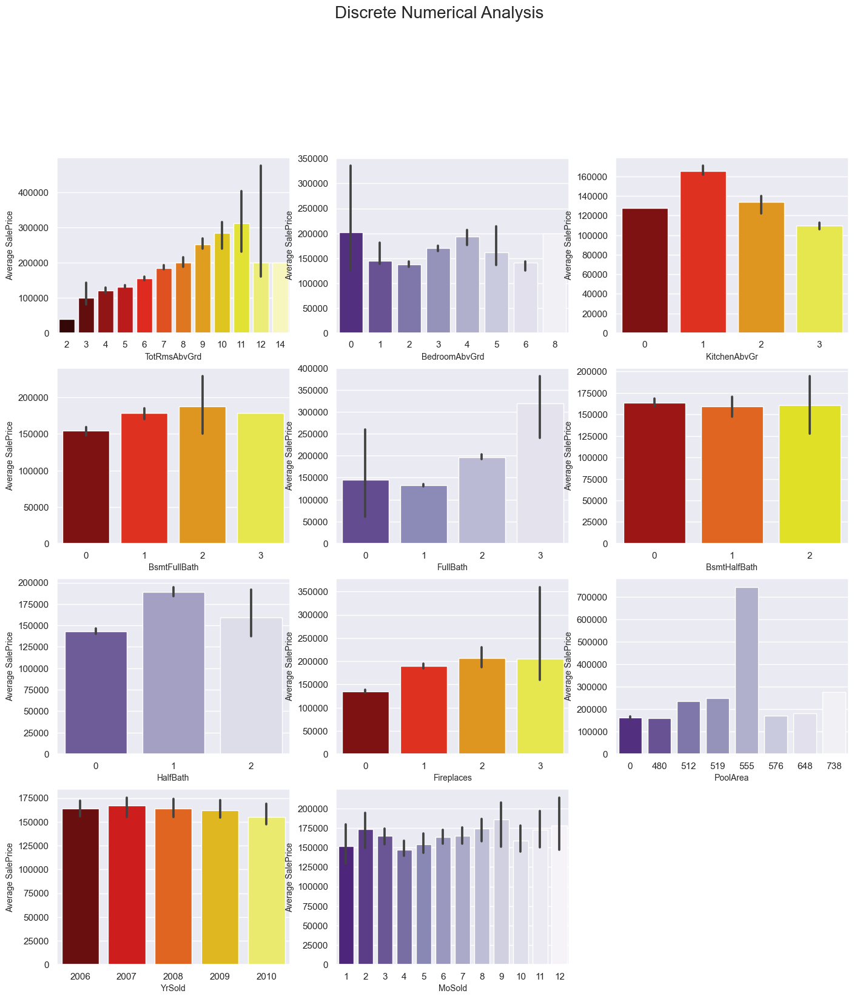

In [141]:
plt.figure(figsize=(15,25))
plt.subplot(6,3,1)
sns.barplot(data=train,x='TotRmsAbvGrd',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("TotRmsAbvGrd",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,2)
sns.barplot(data=train,x='BedroomAbvGr',estimator=np.median,y='SalePrice',palette='Purples_r')
plt.xlabel("BedroomAbvGrd",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,3)
sns.barplot(data=train,x='KitchenAbvGr',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("KitchenAbvGr",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,4)
sns.barplot(data=train,x='BsmtFullBath',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("BsmtFullBath",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,5)
sns.barplot(data=train,x='FullBath',estimator=np.median,y='SalePrice',palette='Purples_r')
plt.xlabel("FullBath",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,6)
sns.barplot(data=train,x='BsmtHalfBath',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("BsmtHalfBath",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,7)
sns.barplot(data=train,x='HalfBath',estimator=np.median,y='SalePrice',palette='Purples_r')
plt.xlabel("HalfBath",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,8)
sns.barplot(data=train,x='Fireplaces',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("Fireplaces",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,9)
sns.barplot(data=train,x='PoolArea',estimator=np.median,y='SalePrice',palette='Purples_r')
plt.xlabel("PoolArea",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,10)
sns.barplot(data=train,x='YrSold',estimator=np.median,y='SalePrice',palette='hot')
plt.xlabel("YrSold",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.subplot(6,3,11)
sns.barplot(data=train,x='MoSold',estimator=np.median,y='SalePrice',palette='Purples_r')
plt.xlabel("MoSold",fontsize=10)
plt.ylabel("Average SalePrice",fontsize=10)
plt.suptitle("Discrete Numerical Analysis",fontsize=20)

#### Observations: 

- Total Rooms Above Ground : as a total number of the rooms increases , average price of the house increase
- Bedroom Above Ground :Here we don't see a exponential curve, as for 0 bedrooms the sale price is highest followed by 4 and 8 bedrooms.The lowest is for 2 and 6 bedrooms.
- Kitchen Above ground :- Here as the number increases , price decreases.Price is highest for only one kitchent that is enough .No one demands for more than one kitchen.
- InBasemnt Full bathroomsandBasement Half bathrooms` we don't see a much difference.If there is no bathroom,obviously price will be less
- Now if we don't consider basement rooms,i.e Above grade Full Bathrooms and Half bathrooms .If there are 3 full bathrooms ,the price is highest and for 1 or 2 half bathrooms the average price is more than 150000.
- Fireplaces :- As fireplaces will increase in the house , sale price will also increase.
- poolArea :- Here we are talking about square feet. And from the barplot 555 sqft area is having highest sale price on average.More Area , More Sale Price
- Year Sold :- The houses in our dataset were sold from year 2006.We can see a bit downward slope from 2006 to 2010.
- Month Sold :- There is not much to study about which month the house sold has higher or lower Sale Price.

#### Now we can analyze the rest of the continuous numerical features

In [142]:
#Here we create a list of all the numerical features in our dataset.
#And we have already separated the discrete features.

num=[]
for col in train.columns:
   if train[col].dtype=='int64' and col not in ['YearBuilt','YearRemodAdd','MoSold','YrSold','GarageYrBlt'] and col not in discrete:
        num.append(col)

In [143]:
print("Numerical Features :: \n\n{}".format(num))  

Numerical Features :: 

['Id', 'LotArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'SalePrice']


### Datetime Features
We have four year features in our dataset.

- YearBuilt
- YearRemodAdd
- GarageYrBlt
- YrSold
We will analyze these features with Sale Price and try to gather some information.

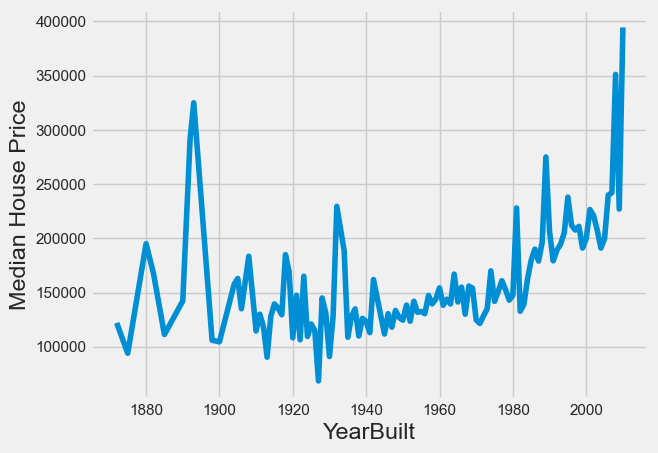

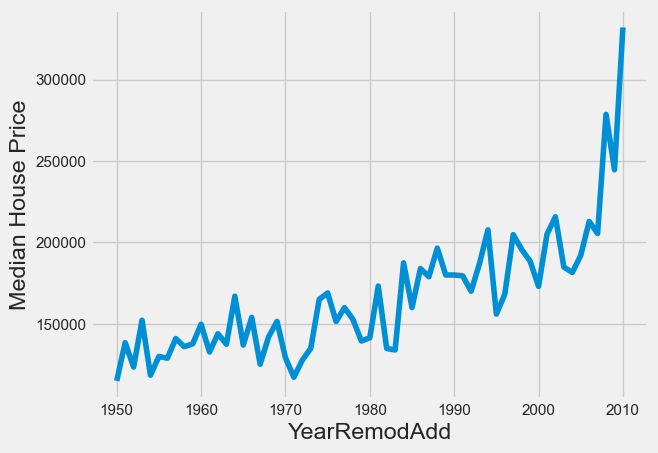

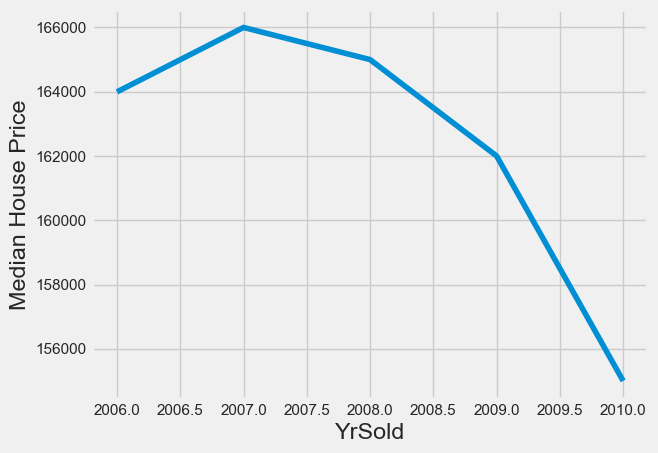

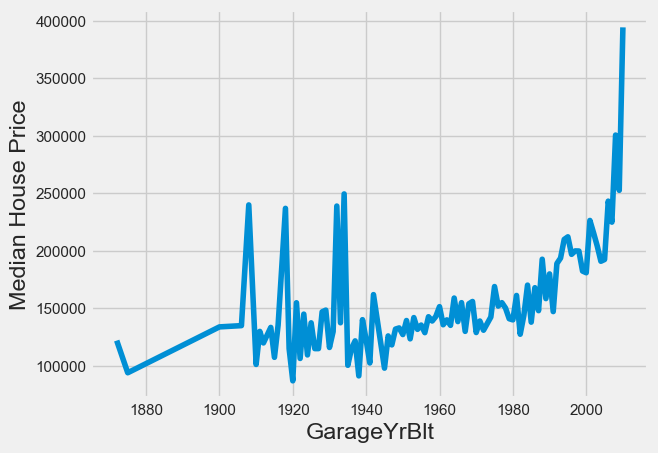

In [232]:
year_features = ['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt']
for feature in year_features:
  ax=train.groupby([feature])['SalePrice'].median().plot()
  plt.ylabel("Median House Price")
  plt.show()

#### Categorical Variables

In [144]:
# List of Categorical Features
cat_list = [f for f in train.columns if train.dtypes[f] == 'object']

# Selecting columns with object (string) data type as categorical variables
category_var_train = df_train.select_dtypes(include='object')
category_var_test = df_test.select_dtypes(include='object')


# Printing the number of categorical features in the dataset
print("Number of categorical features in train dataset are: ", category_var_train.shape[1])
print("Number of categorical features in test dataset are: ", category_var_test.shape[1])

Number of categorical features in train dataset are:  43
Number of categorical features in test dataset are:  43


#### Observations: 

- As per above code we can say that the train dataset of house prices has 43 categorical features & 36 numerical features that can affect the target variable of `SalePrice`.

- We have dropped the `Id` column as it won't add any value for predicting the `SalePrice` and dropped `SalePrice` since it is a target variable.

In [145]:
cat=[]
for col in train.columns:
    if train[col].dtype=='object':
        cat.append(col)

#printing the list
print("Categorical variables :: \n\n{}".format(cat))

Categorical variables :: 

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


##  SalePrice Analysis

In [146]:
train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [147]:
train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

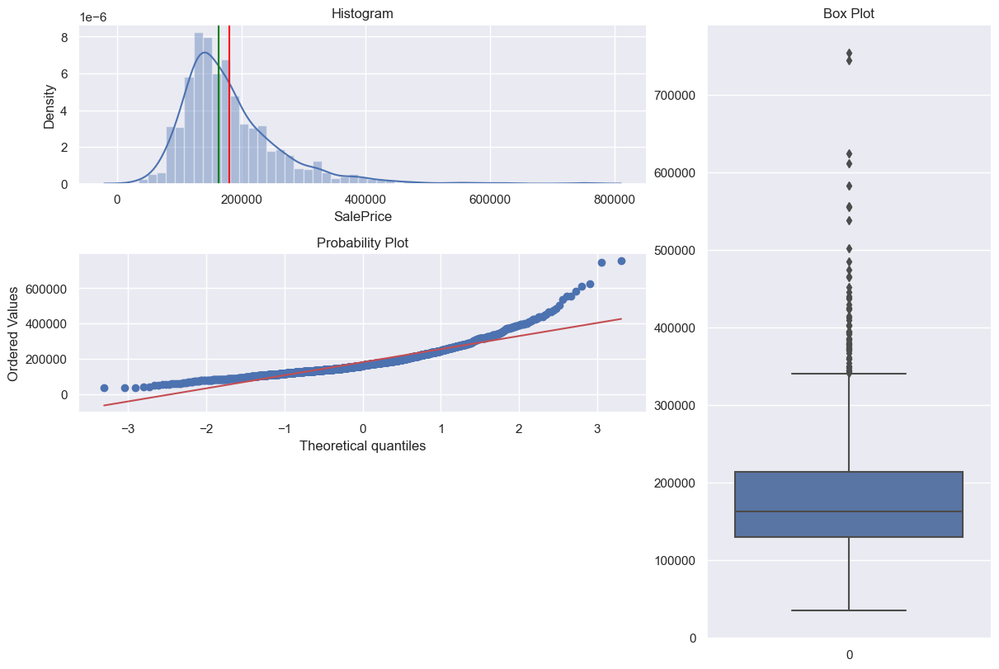

In [148]:
def three_chart_plot(df, feature):
    fig = plt.figure(constrained_layout = True, figsize = (12, 8))
    grid = gridspec.GridSpec(ncols = 3, nrows = 3, figure = fig)
    
    ax1 = fig.add_subplot(grid[0, :2])
    ax1.set_title('Histogram')
    
    sns.distplot(df.loc[:, feature], norm_hist = True, ax = ax1)
    
    plt.axvline(x = df[feature].mean(), c = 'red')
    plt.axvline(x = df[feature].median(), c = 'green')
    
    ax2 = fig.add_subplot(grid[1, :2])
    ax2.set_title('QQ_plot')
    stats.probplot(df.loc[:,feature], plot = ax2)

    ## Customizing the Box Plot. 
    ax3 = fig.add_subplot(grid[:, 2])
    ## Set title. 
    ax3.set_title('Box Plot')
    sns.boxplot(df.loc[:,feature], orient = 'v', ax = ax3 )
    
three_chart_plot(train, 'SalePrice')

####  Summary based on above plot: 

- The histogram plot of the SalePrice reveals a non-normal distribution with a right skew. The presence of a longer tail on the right side indicates that there are relatively higher-priced houses in the dataset.

- The boxplot highlights the presence of outliers in the SalePrice variable. The points outside the whiskers indicate data points that deviate significantly from the majority of the observations.

- The probability plot provides a comparison between the expected distribution of SalePrice if it were normally distributed (represented by the red line) and the actual distribution (represented by the blue points). We can observe substantial deviations from normality at both ends of the plot, indicating a departure from a perfectly normal distribution.

In [149]:
saleprice_skew = train['SalePrice'].skew()

print(f"Skewness of the SalesPrice is {saleprice_skew:.2f}")
saleprice_kurt = train['SalePrice'].kurt()

print(f"Kurtosis of the SalesPrice is {saleprice_kurt:.2f}")

Skewness of the SalesPrice is 1.88
Kurtosis of the SalesPrice is 6.54


#### Observations: 

- Skewness refers to the amount of asymmetry in the given feature or in other words amount of distortions from the normal distribution. 

- Here we can observe that the value of skewness is quite high which means that there is a large amount of asymmetry. 

- The peak of the histogram represents the mode i.e the price for which maximum number of houses were sold.

- As the mean of the feature is greater than the median which is greater than the mode and the line is flat towards the right in the histogram, the given feature is **Positively Skewed**. Most of the houses were sold less than the average price.

- A kurtosis value of 6.54 suggests that the 'SalesPrice' variable being analyzed has a distribution that is more peaked and has heavier tails than a normal distribution. 

- This indicates the presence of outliers or the influence of certain factors causing the distribution to deviate from a normal shape.

### Log Transformation

In [150]:
# Log Transformation on SalePrice
y_train = np.log1p(train["SalePrice"])
y_train = pd.DataFrame(y_train,columns=['SalePrice'])
y_train.head()

,SalePrice
0,12.247699
1,12.109016
2,12.317171
3,11.849405
4,12.429220


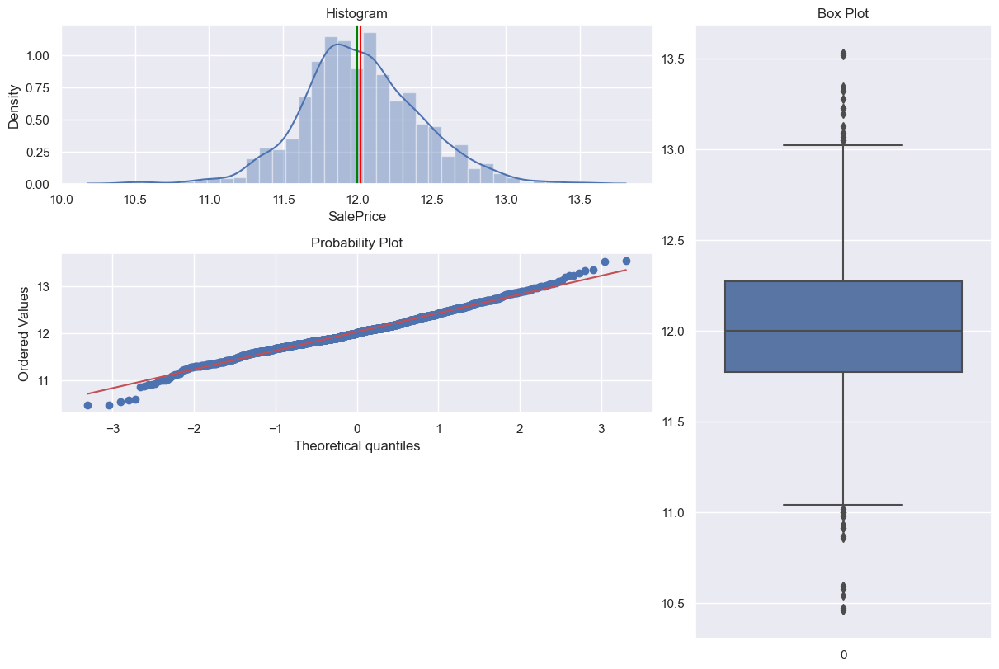

In [151]:
three_chart_plot(y_train, 'SalePrice')

### Missing Data/Null Values Analysis

In [152]:
def null_table(data):
    """
    A function which returns the number and percentage of null values in the given dataset.
    """
    indices = data.isnull().sum().index
    values = data.isnull().sum().values
    percentages = []
    for i in indices:
        percentages.append((data[i].isnull().sum() / data[i].shape[0]) * 100)
    d = {'Columns' : indices, 'Count of Null Values' : values, 'Approximate Percentage of Null Values' : percentages}
    # data = dict(zip(indices, percentages))
    null_frame = pd.DataFrame(data = d)
    return null_frame

In [153]:
null_frame_train = null_table(train)
null_frame_train.sort_values(by = 'Approximate Percentage of Null Values',ascending=False).head(10)

,Columns,Count of Null Values,Approximate Percentage of Null Values
72,PoolQC,1453,99.520548
74,MiscFeature,1406,96.301370
6,Alley,1369,93.767123
73,Fence,1179,80.753425
57,FireplaceQu,690,47.260274
3,LotFrontage,259,17.739726
59,GarageYrBlt,81,5.547945
64,GarageCond,81,5.547945
58,GarageType,81,5.547945
60,GarageFinish,81,5.547945


In [154]:
null_frame_test = null_table(test)
null_frame_test.sort_values(by = 'Approximate Percentage of Null Values',ascending=False).head(10)

,Columns,Count of Null Values,Approximate Percentage of Null Values
72,PoolQC,1456,99.794380
74,MiscFeature,1408,96.504455
6,Alley,1352,92.666210
73,Fence,1169,80.123372
57,FireplaceQu,730,50.034270
3,LotFrontage,227,15.558602
59,GarageYrBlt,78,5.346127
63,GarageQual,78,5.346127
60,GarageFinish,78,5.346127
64,GarageCond,78,5.346127


#### Observations: 

- NA has a different meaning in this dataset. It is not necessarily indicative of missing data that needs to be imputed or removed.

- In several columns, such as 'Alley' and 'GarageType', the presence of NA actually represents a specific condition or feature of the house(whether present or not available as well). For example, NA in 'Alley' means the house has no alley access, and NA in 'GarageType' means the house has no garage. Similar patterns are observed in other columns as well.

- It is important to consider these NA values as they can have an impact on the final prices of the houses. Ignoring or removing these values could lead to biased or inaccurate predictions.

- One way to handle these NA values is to replace them appropriately with proper abbreviations or categories that reflect the corresponding columns. This ensures that the information about the absence of certain features is retained in the dataset.

- It is worth noting that the target variable 'SalePrice' does not have any null values, which means we have complete data for this variable.

**Let's combine both the train and test dataset and analyze the null values**

In [155]:
numtrain = train.shape[0]
numtest = test.shape[0]
y_train = train['SalePrice'].to_frame()
# Combine train and test sets
total = pd.concat((train, test), sort = False).reset_index(drop = True)
# Drop the target "SalePrice" and Id columns
total.drop(['SalePrice'], axis = 1, inplace = True)
print(f"Total size is {total.shape}")

Total size is (2919, 80)


In [156]:
def miss_val_percent(data, thresh = 20, color = 'black', edgecolor = 'black', height = 3, width = 15):
    
    plt.figure(figsize = (width, height))
    percentage = (data.isnull().mean()) * 100
    percentage.sort_values(ascending = False).plot.bar(edgecolor = edgecolor)
    plt.axhline(y = thresh, color = 'r', linestyle = '-')
    
    plt.title('Missing values percentage per column', fontsize=20, weight='bold' )
    
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh+12.5, f'Columns with more than {thresh}% missing values', fontsize=12, color='crimson',
         ha='left' ,va='top')
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh - 5, f'Columns with less than {thresh}% missing values', fontsize=12, color='green',
         ha='left' ,va='top')
    plt.xlabel('Columns', size=15, weight='bold')
    plt.ylabel('Missing values percentage')
    plt.yticks(weight ='bold')
    
    return plt.show()

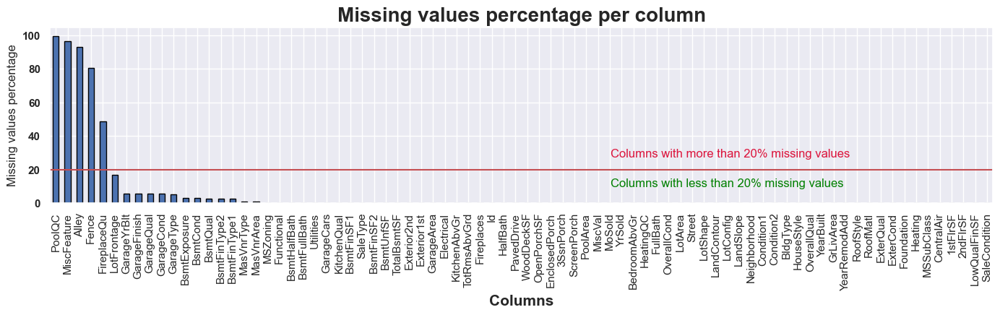

In [157]:
miss_val_percent(total, 20, color=sns.color_palette('Reds',15))

#### Observation: 

- There are 5 features having more than 20 percent null values. We can deal with these values appropriately by either replacing,imputing or dropping the rows/columns.

In [158]:
missing_data_count = total.isnull().sum()
missing_data_percent = total.isnull().sum() / len(total) * 100
missing_data = pd.DataFrame({
    'Count': missing_data_count,
    'Percent': missing_data_percent
})
missing_data = missing_data[missing_data.Count > 0]
missing_data.sort_values(by='Count', ascending=False, inplace=True)

In [159]:
len(missing_data)

34

In [160]:
missing_data.head(10)

,Count,Percent
PoolQC,2909,99.657417
MiscFeature,2814,96.402878
Alley,2721,93.216855
Fence,2348,80.438506
FireplaceQu,1420,48.646797
LotFrontage,486,16.649538
GarageFinish,159,5.447071
GarageQual,159,5.447071
GarageCond,159,5.447071
GarageYrBlt,159,5.447071


There are 34 features that have missing values. I will divide them into three groups based on the data description:
   - **Group 1 - Categorical variables where `NA` means no feature:** `PoolQC`, `MiscFeature`, `Alley`, `Fence`, `FireplaceQu`, `GarageType`, `GarageFinish`, `GarageQual`, `GarageCond`, `BsmtQual`, `BsmtCond`, `BsmtExposure`, `BsmtFinType1`, `BsmtFinType2`, `MasVnrType` (15 variables)
   
    For this group I will impute `NA` with `'None'`.
    
   - **Group 2 - Numerical variables where `NA` means no feature:** `GarageArea`, `GarageCars`, `BsmtFinSF1`, `BsmtFinSF2`, `BsmtUnfSF`, `TotalBsmtSF`, `BsmtFullBath`, `BsmtHalfBath`, `MasVnrArea` (10 variables)
   
    For this group I will impute `NA` with `0`.
    
   - **Group 3 - Other variables:** `Functional`, `MSZoning`, `Electrical`, `KitchenQual`, `Exterior1st`, `Exterior2nd`, `SaleType`, `Utilities`, `LotFrontage`, `GarageYrBlt` (9 variables)
        - I will impute `Functional`, `MSZoning`, `Electrical`, `KitchenQual`, `Exterior1st`, `Exterior2nd`, `SaleType`, `Utilities` with their *modes*,
        - impute `LotFrontage` with its *mean*,
        - impute `GarageYrBlt` with `YearBuilt`.

In [161]:
from sklearn.impute import SimpleImputer
# Group 1:
group_1 = [
    'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'BsmtQual', 'BsmtCond',
    'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'MasVnrType'
]
train[group_1] = train[group_1].fillna("None")
test[group_1] = test[group_1].fillna("None")

# Group 2:
group_2 = [
    'GarageArea', 'GarageCars', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
    'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'MasVnrArea'
]

train[group_2] = train[group_2].fillna(0)
test[group_2] = test[group_2].fillna(0)

# Group 3:
group_3a = [
    'Functional', 'MSZoning', 'Electrical', 'KitchenQual', 'Exterior1st',
    'Exterior2nd', 'SaleType', 'Utilities'
]

imputer = SimpleImputer(strategy='most_frequent')
train[group_3a] = pd.DataFrame(imputer.fit_transform(train[group_3a]), index=train.index)
test[group_3a] = pd.DataFrame(imputer.fit_transform(test[group_3a]), index=test.index)



train.LotFrontage = train.LotFrontage.fillna(train.LotFrontage.mean())
test.LotFrontage = test.LotFrontage.fillna(test.LotFrontage.mean())


train.GarageYrBlt = train.GarageYrBlt.fillna(train.YearBuilt)
test.GarageYrBlt = test.GarageYrBlt.fillna(test.YearBuilt)

**Need to Check if there is any missing value left:**

In [162]:
sum(train.isnull().sum())

0

In [163]:
#Find out missing values in test dataset.
test.isna().sum().sum()

0

**Milestone**:- All missing values have been handled as no null values in both train & test dataset

### Outlier Analysis for Independent Variables

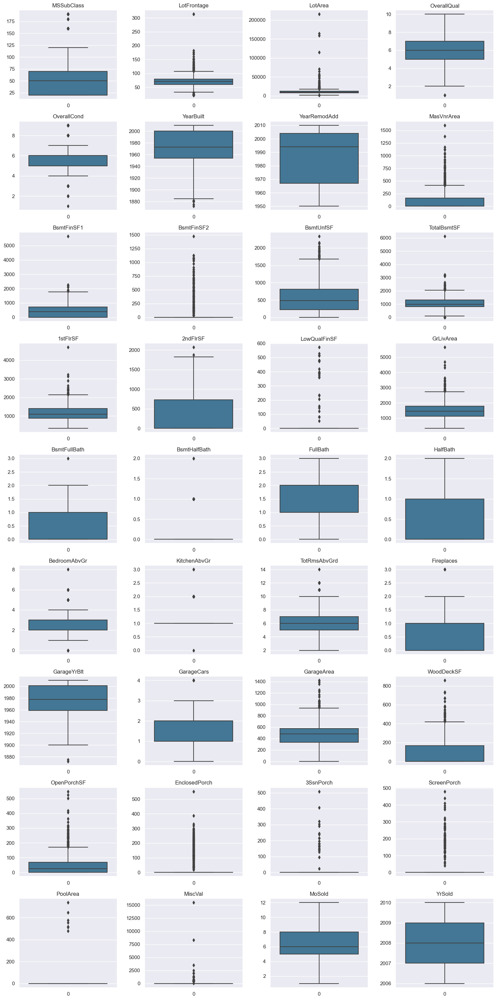

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns

# Find outliers for all numerical columns (before handling missing values)
numerical_df = train.select_dtypes(exclude=['object'])
numerical_df = numerical_df.drop(["Id", "SalePrice"], axis=1)
num_plots = len(numerical_df.columns)

# Determine the number of rows and columns for subplots
num_rows = 9  # Number of rows for subplots
num_cols = 4  # Number of columns for subplots

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 30))
fig.subplots_adjust(hspace=0.4, wspace=0.3)  # Adjust the vertical and horizontal spacing between subplots

# Flatten the axes array to easily iterate over subplots
axes = axes.flatten()

# Iterate over the columns and plot box plots
for i, column in enumerate(numerical_df.columns):
    ax = axes[i]
    sns.boxplot(numerical_df[column], orient='v', ax=ax,palette='mako')
    ax.set_title(column)  # Set the title of the subplot

# Hide unused subplots
for j in range(i+1, num_rows*num_cols):
    axes[j].axis('off')

plt.tight_layout()  # Adjust the layout to prevent overlap of subplots
plt.show()


#### Observation: 

- From the above box plots we can most of the columns are having outliers and some columns are having high zero values such as `PoolArea`,`MiscVal`,`BsmtHalfBath` and so on.

- For checking if the outliers are valid or invalid we need to analyse each of the variable and accordingly decide to keep or remove the outliers.

## GrLivArea

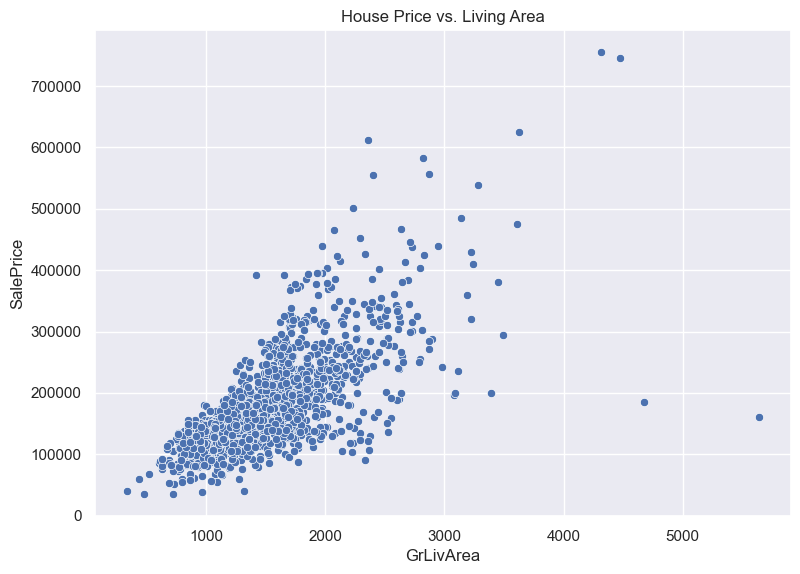

In [165]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='GrLivArea', y='SalePrice', data=train)
title = plt.title('House Price vs. Living Area')

There are two observations lying separately from the rest. They have large living area but low price. They are the outliers that we are looking for. I will delete them from the training set.

In [166]:
outlier_index = train[(train.GrLivArea > 4000) & (train.SalePrice < 200000)].index
train.drop(outlier_index, axis=0, inplace=True)
train.reset_index(inplace=True,drop=True)

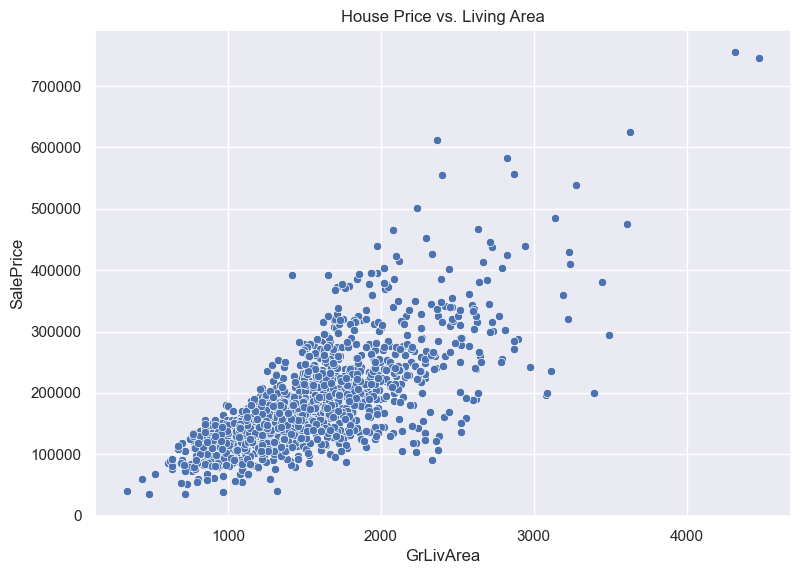

In [167]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='GrLivArea', y='SalePrice', data=train)
title = plt.title('House Price vs. Living Area')

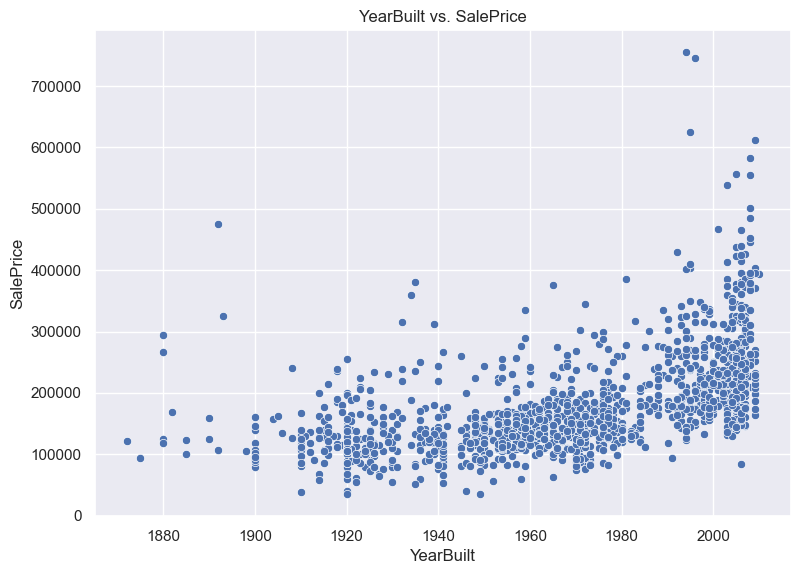

Correlation between YearBuilt and SalePrice: 0.52


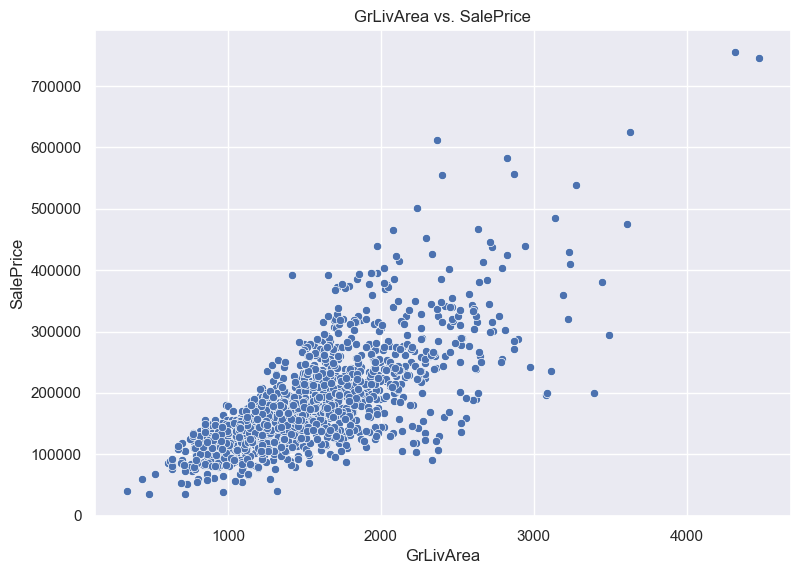

Correlation between GrLivArea and SalePrice: 0.73


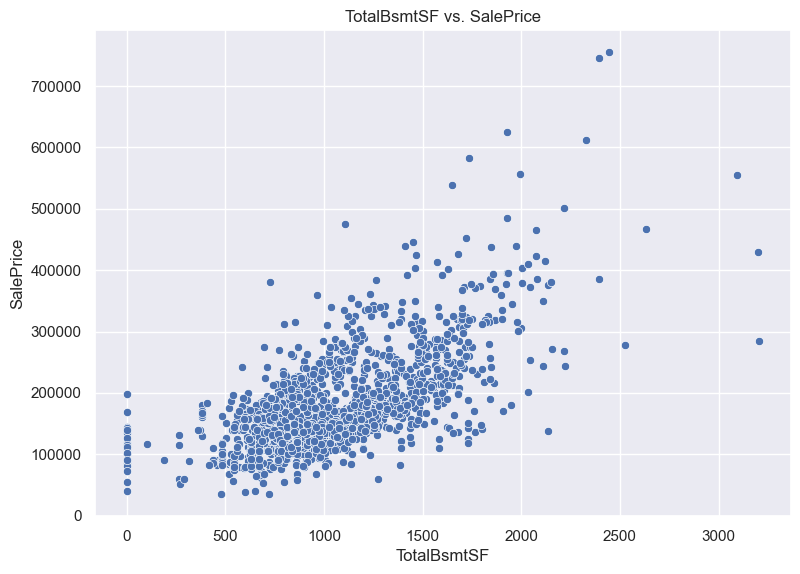

Correlation between TotalBsmtSF and SalePrice: 0.65


In [168]:
# Select three potential predictors
predictors = ['YearBuilt', 'GrLivArea', 'TotalBsmtSF']

# Scatter plots and correlations
for predictor in predictors:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=train, x=predictor, y='SalePrice')
    plt.title(f'{predictor} vs. SalePrice')
    plt.xlabel(predictor)
    plt.ylabel('SalePrice')
    plt.show()
    
    correlation = train[predictor].corr(train['SalePrice'])
    print(f"Correlation between {predictor} and SalePrice: {correlation:.2f}")

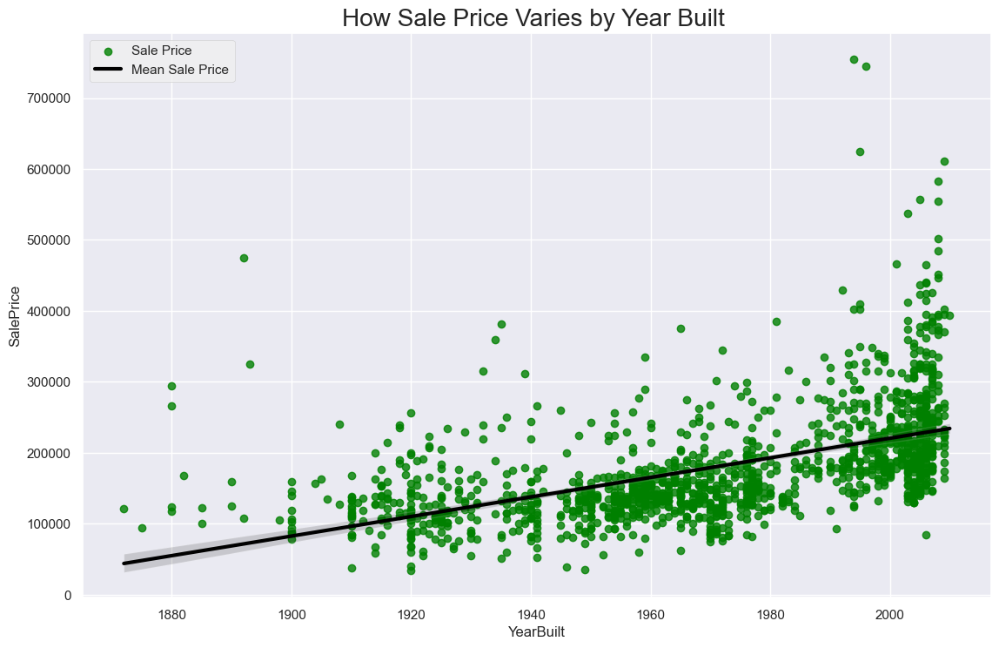

In [169]:
plt.figure(figsize=(12,8))
# Scatter plot
#sns.scatterplot(data=data, x='GrLivArea', y='SalePrice', s=32)

# Regression line
sns.regplot(data=train, x='YearBuilt', y='SalePrice',scatter_kws={"color":"green"},line_kws={"linewidth":3,"color":"black","label":"Mean Sale Price"},label="Sale Price")
plt.style.use("fivethirtyeight")
plt.title("How Sale Price Varies by Year Built ")

# Add labels and title
plt.xlabel('YearBuilt')
plt.ylabel('SalePrice')
plt.legend()

# Display the plot
plt.show()

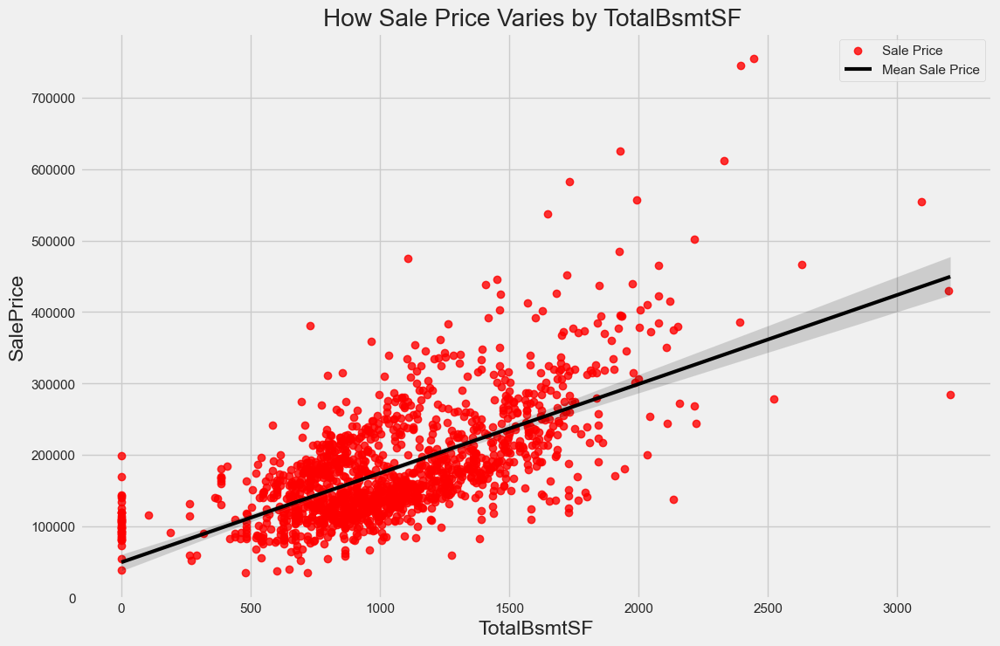

In [170]:
plt.figure(figsize=(12,8))
# Scatter plot
#sns.scatterplot(data=data, x='GrLivArea', y='SalePrice', s=32)

# Regression line
sns.regplot(data=train, x='TotalBsmtSF', y='SalePrice',scatter_kws={"color":"red"},line_kws={"linewidth":3,"color":"black","label":"Mean Sale Price"},label="Sale Price")
plt.style.use("fivethirtyeight")
plt.title("How Sale Price Varies by TotalBsmtSF ")

# Add labels and title
plt.xlabel('TotalBsmtSF')
plt.ylabel('SalePrice')
plt.legend()

# Display the plot
plt.show()

###  Potential Predictors

### Correlation with Numerical Features

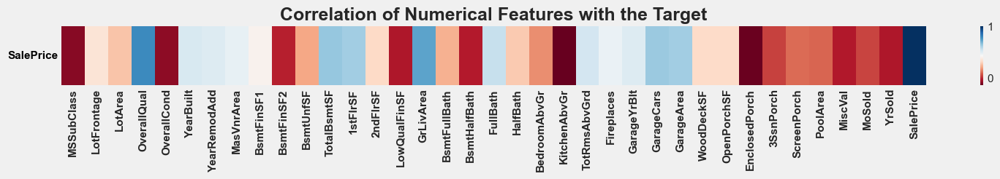

In [171]:
numerical_df = train.select_dtypes(exclude = 'object')
numerical_df = numerical_df.drop('Id', axis=1)

corr_num = numerical_df.corr()

f, ax = plt.subplots(figsize = (17, 1))

sns.heatmap(corr_num.sort_values(by='SalePrice', ascending=False).head(1), cmap='RdBu')

plt.title('Correlation of Numerical Features with the Target', weight='bold', fontsize=18)
plt.xticks(weight='bold')
plt.yticks(weight='bold', color='black', rotation=0)



plt.show()

In [172]:
correlation = train.corr()['SalePrice'].sort_values(ascending = False).to_frame().head(10)

cmap = sns.light_palette("cyan", as_cmap = True)

corr_house = correlation.style.background_gradient(cmap = cmap)

corr_house

,SalePrice
SalePrice,1.000000
OverallQual,0.795774
GrLivArea,0.734968
TotalBsmtSF,0.651153
GarageCars,0.641047
1stFlrSF,0.631530
GarageArea,0.629217
FullBath,0.562165
TotRmsAbvGrd,0.537769
YearBuilt,0.523608


#### Observation: 

- From the above table, we can conclude that __better the overall quality of the house, more will be the price of the house which is also true in real life and same is true for the living area i.e as the area increases, more will be the Sale Price.__

- __`OverallQual`,`GrLivArea`,`GarageCars`,`GarageArea` and `TotalBsmtSF` are the top 5 highly correlated features with the target variable of `SalePrice`__

#### OverallQual Vs Sale Price Analysis

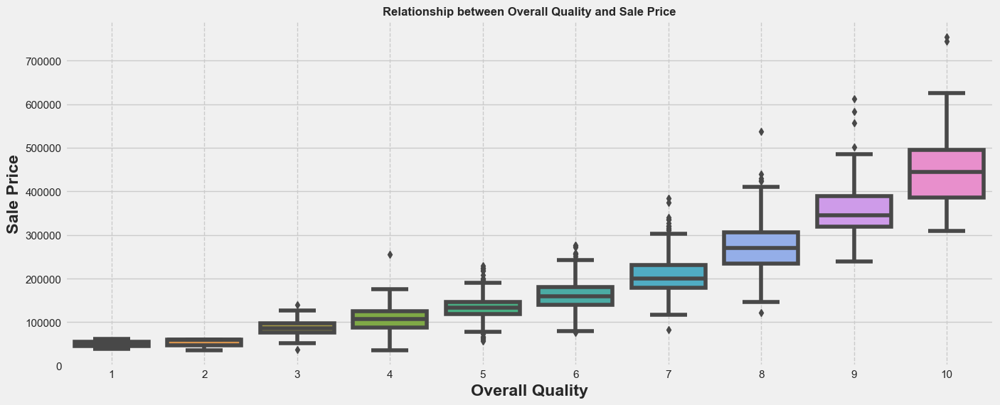

In [173]:
plt.figure(figsize=((15, 6)))
sns.boxplot(data=train, x='OverallQual', y='SalePrice')
plt.title('Relationship between Overall Quality and Sale Price', weight = 'bold', fontsize = 12)
plt.grid(axis='x', linestyle='--')
plt.xlabel('Overall Quality', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

#### GarageCars Vs Sale Price Analysis
Interestingly, houses with garage which can hold 4 cars are cheaper than houses with 3-car garage.

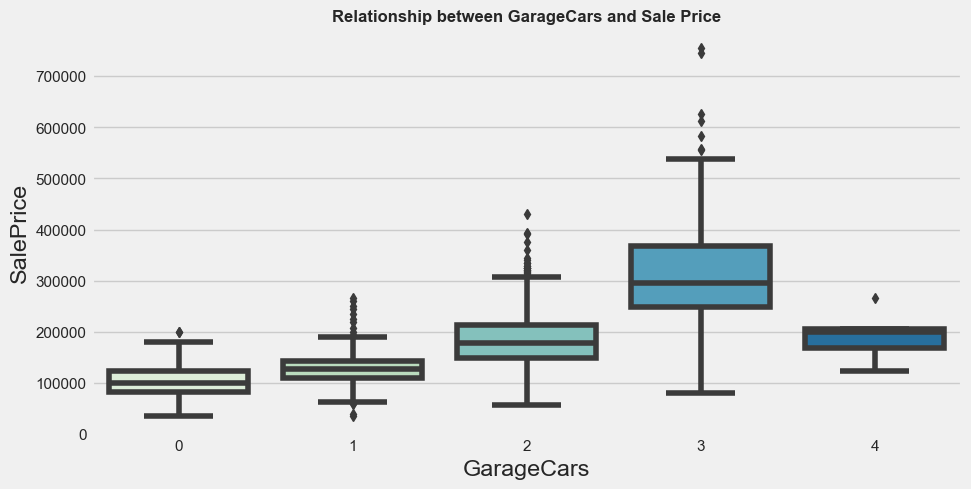

In [174]:
plt.figure(figsize=(10, 5))
sns.boxplot(x='GarageCars', y='SalePrice', data=train, palette='GnBu')
title = plt.title('Relationship between GarageCars and Sale Price', weight = 'bold', fontsize = 12)

#### Year Built Vs Sale Price Analysis

The age of the house also plays an important role in its price. Newer houses have higher average prices. There are several houses built before 1900 having a high price.

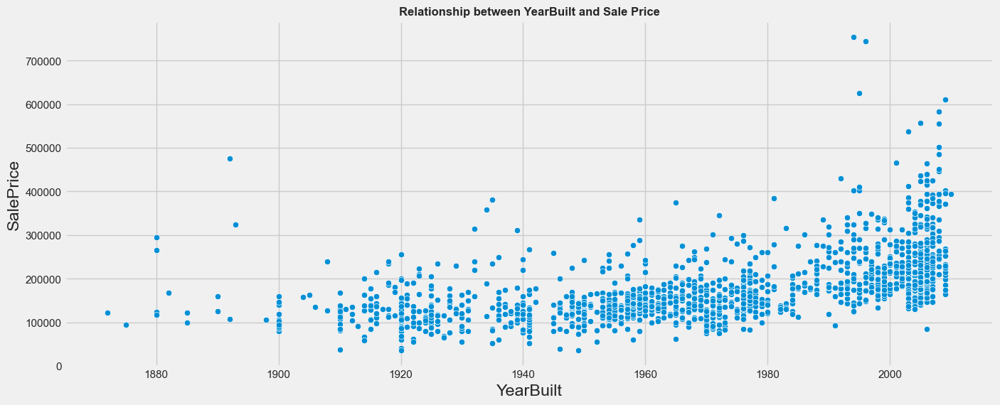

In [175]:
plt.figure(figsize=(15, 6))
sns.scatterplot(x='YearBuilt', y='SalePrice', data=train)
title = plt.title('Relationship between YearBuilt and Sale Price', weight = 'bold', fontsize = 12)

### Categorical Feature Analysis

In [176]:
df_train = train.copy()

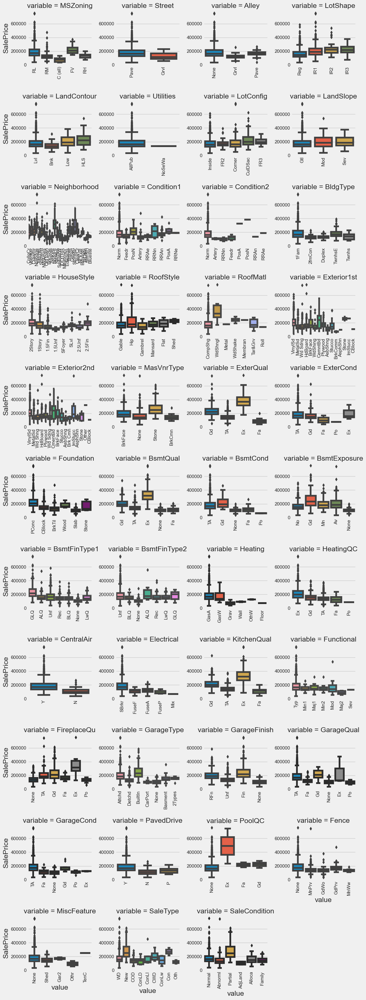

In [177]:
# for c in cat_list:
#     train[c] = train[c].astype('category')
#     if train[c].isnull().any():
#         train[c] = train[c].cat.add_categories(['MISSING'])
#         train[c] = train[c].fillna('MISSING')

def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
f = pd.melt(df_train, id_vars=['SalePrice'], value_vars=cat_list)
g = sns.FacetGrid(f, col="variable",  col_wrap=4, sharex=False, sharey=False)
g = g.map(boxplot, "value", "SalePrice")

### Analysis of Variance (ANOVA) test on Categorical Features in relation to the 'SalePrice'

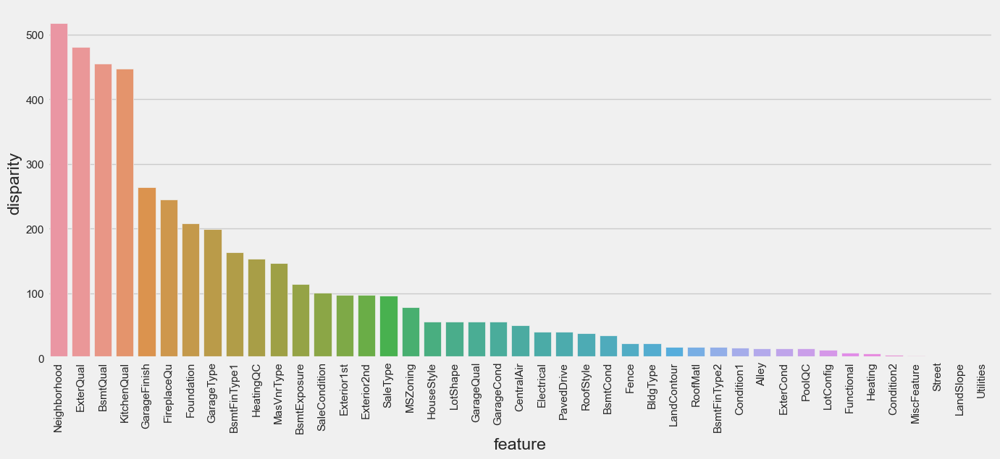

In [178]:
def anova(frame):
    anv = pd.DataFrame()
    anv['feature'] = cat_list
    pvals = []
    for c in cat_list:
        samples = []
        for cls in frame[c].unique():
            s = frame[frame[c] == cls]['SalePrice'].values
            samples.append(s)
        pval = stats.f_oneway(*samples)[1]
        pvals.append(pval)
    anv['pval'] = pvals
    return anv.sort_values('pval')

anova_results = anova(df_train)
anova_results['disparity'] = np.log(1./anova_results['pval'].values)
anova_results.reset_index(inplace=True,drop=True)
plt.figure(figsize = ((15, 6)))
sns.barplot(data=anova_results, x='feature', y='disparity')
x=plt.xticks(rotation=90)
plt.show()

In [179]:
anova_results.head()

,feature,pval,disparity
0,Neighborhood,1.694312e-225,517.554369
1,ExterQual,1.610719e-209,480.763603
2,BsmtQual,1.127319e-198,455.792006
3,KitchenQual,3.872591e-195,447.650169
4,GarageFinish,3.149921e-115,263.649908


#### Observations: 

- The 'Neighborhood' feature has a very low p-value, indicating a strong association with the 'SalePrice'. The disparity value (517.64) suggests a significant difference in 'SalePrice' across different neighborhoods.

- Similarly, 'ExterQual', 'BsmtQual', 'KitchenQual', and 'GarageFinish' also have very low p-values, indicating significant associations with the 'SalePrice'.

- Features like 'GarageType', 'BsmtFinType1', 'HeatingQC', and 'MasVnrType' show relatively lower p-values, suggesting their influence on the 'SalePrice'.

- On the other hand, features like 'MiscFeature', 'Condition2', 'Street', 'LandSlope', and 'Utilities' have higher p-values, indicating a weaker association with the 'SalePrice'.

### Applying Encoding  to the Categorical Variables

In [180]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['spmean'] = frame[[feature, 'SalePrice']].groupby(feature).mean()['SalePrice']
    ordering = ordering.sort_values('spmean')
    ordering['ordering'] = range(1, ordering.shape[0]+1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature+'_En'] = o
    
cat_encoded = []
for q in cat_list:  
    encode(df_train, q)
    cat_encoded.append(q+'_En')
print(cat_encoded)

['MSZoning_En', 'Street_En', 'Alley_En', 'LotShape_En', 'LandContour_En', 'Utilities_En', 'LotConfig_En', 'LandSlope_En', 'Neighborhood_En', 'Condition1_En', 'Condition2_En', 'BldgType_En', 'HouseStyle_En', 'RoofStyle_En', 'RoofMatl_En', 'Exterior1st_En', 'Exterior2nd_En', 'MasVnrType_En', 'ExterQual_En', 'ExterCond_En', 'Foundation_En', 'BsmtQual_En', 'BsmtCond_En', 'BsmtExposure_En', 'BsmtFinType1_En', 'BsmtFinType2_En', 'Heating_En', 'HeatingQC_En', 'CentralAir_En', 'Electrical_En', 'KitchenQual_En', 'Functional_En', 'FireplaceQu_En', 'GarageType_En', 'GarageFinish_En', 'GarageQual_En', 'GarageCond_En', 'PavedDrive_En', 'PoolQC_En', 'Fence_En', 'MiscFeature_En', 'SaleType_En', 'SaleCondition_En']


In [181]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageType_En,GarageFinish_En,GarageQual_En,GarageCond_En,PavedDrive_En,PoolQC_En,Fence_En,MiscFeature_En,SaleType_En,SaleCondition_En
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,3.0,2.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,2.0
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0


**New Encoded features of all categorical variables are added to train dataset**

In [182]:
df_test = test.copy()


def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['ordering'] = range(1, ordering.shape[0]+1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature+'_En'] = o

In [183]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,None,Reg,Lvl,AllPub,...,120,0,None,MnPrv,None,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,None,IR1,Lvl,AllPub,...,0,0,None,None,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,None,IR1,Lvl,AllPub,...,0,0,None,MnPrv,None,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,None,IR1,Lvl,AllPub,...,0,0,None,None,None,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,None,IR1,HLS,AllPub,...,144,0,None,None,None,0,1,2010,WD,Normal


In [184]:
cat_encoded_test = []
for q in cat_list:  
    encode(df_test, q)
    cat_encoded_test.append(q+'_En')
print(cat_encoded)

['MSZoning_En', 'Street_En', 'Alley_En', 'LotShape_En', 'LandContour_En', 'Utilities_En', 'LotConfig_En', 'LandSlope_En', 'Neighborhood_En', 'Condition1_En', 'Condition2_En', 'BldgType_En', 'HouseStyle_En', 'RoofStyle_En', 'RoofMatl_En', 'Exterior1st_En', 'Exterior2nd_En', 'MasVnrType_En', 'ExterQual_En', 'ExterCond_En', 'Foundation_En', 'BsmtQual_En', 'BsmtCond_En', 'BsmtExposure_En', 'BsmtFinType1_En', 'BsmtFinType2_En', 'Heating_En', 'HeatingQC_En', 'CentralAir_En', 'Electrical_En', 'KitchenQual_En', 'Functional_En', 'FireplaceQu_En', 'GarageType_En', 'GarageFinish_En', 'GarageQual_En', 'GarageCond_En', 'PavedDrive_En', 'PoolQC_En', 'Fence_En', 'MiscFeature_En', 'SaleType_En', 'SaleCondition_En']


### Correlations analysis  with both Numerical and Categorical Features

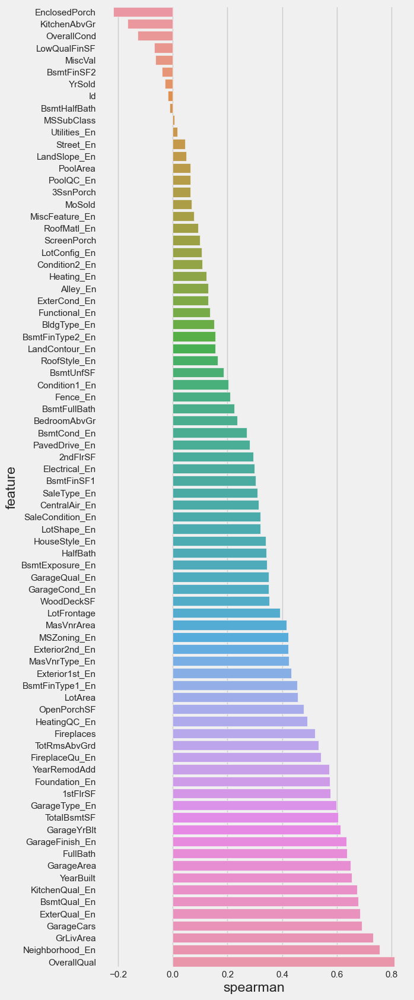

In [185]:
def spearman(frame, features):
    spr = pd.DataFrame()
    spr['feature'] = features
    spr['spearman'] = [frame[f].corr(frame['SalePrice'], 'spearman') for f in features]
    spr = spr.sort_values('spearman')
    plt.figure(figsize=(6, 0.25*len(features)))
    sns.barplot(data=spr, y='feature', x='spearman', orient='h')

features = num_list + cat_encoded
spearman(df_train, features)

#### Observations: 

- Spearman correlation is better to work with in this case because it picks up relationships between variables even when they are nonlinear. 

- __`OverallQual` is main criterion in establishing house price which was also observed with correlation with only numerical features.__ 

- __From the categorical columns,`Neighborhood` has big influence on Sale Price.__

- So the __top 3 potentially high influencing predictors are `OverallQual`, `Neighborhood` and `GrLivArea`.__

In [186]:
frame = df_train

spr = pd.DataFrame()
spr['feature'] = features
spr['spearman'] = [frame[f].corr(frame['SalePrice'], 'spearman') for f in features]
spr = spr.sort_values('spearman',ascending=False)

In [187]:
spr.head(10)

,feature,spearman
4,OverallQual,0.811082
45,Neighborhood_En,0.757141
16,GrLivArea,0.732342
26,GarageCars,0.690974
55,ExterQual_En,0.685228
58,BsmtQual_En,0.678946
67,KitchenQual_En,0.673825
6,YearBuilt,0.653422
27,GarageArea,0.650284
19,FullBath,0.636262


#### Neighborhood Vs Sale Price Analysis

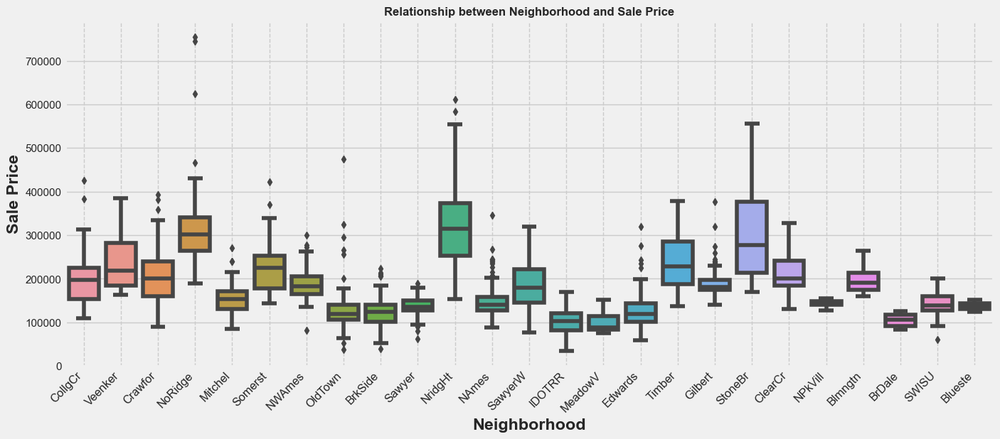

In [188]:
plt.figure(figsize=((15, 6)))
sns.boxplot(data=df_train, x='Neighborhood', y='SalePrice')
plt.title('Relationship between Neighborhood and Sale Price', weight = 'bold', fontsize = 12)
plt.grid(axis='x', linestyle='--')
plt.xticks(rotation=45, horizontalalignment='right',fontsize='small')
plt.xlabel('Neighborhood', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

#### Observations: 

- From the above boxplot we can observe high variability in Sale Price mostly across all the Neighborhood categories.

#### ExterQual Vs Sale Price Analysis

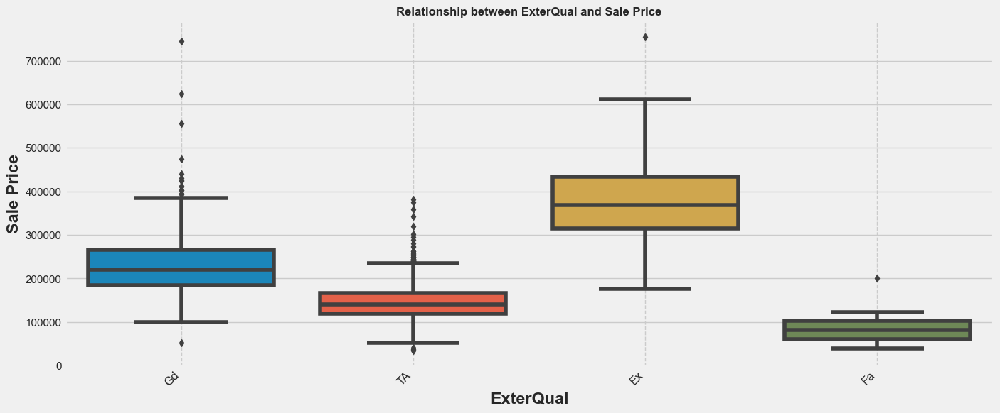

In [189]:
plt.figure(figsize=((15, 6)))
sns.boxplot(data=train, x='ExterQual', y='SalePrice')
plt.title('Relationship between ExterQual and Sale Price', weight = 'bold', fontsize = 12)
plt.grid(axis='x', linestyle='--')
plt.xticks(rotation=45, horizontalalignment='right',fontsize='small')
plt.xlabel('ExterQual', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

#### BsmtQual Vs Sale Price Analysis

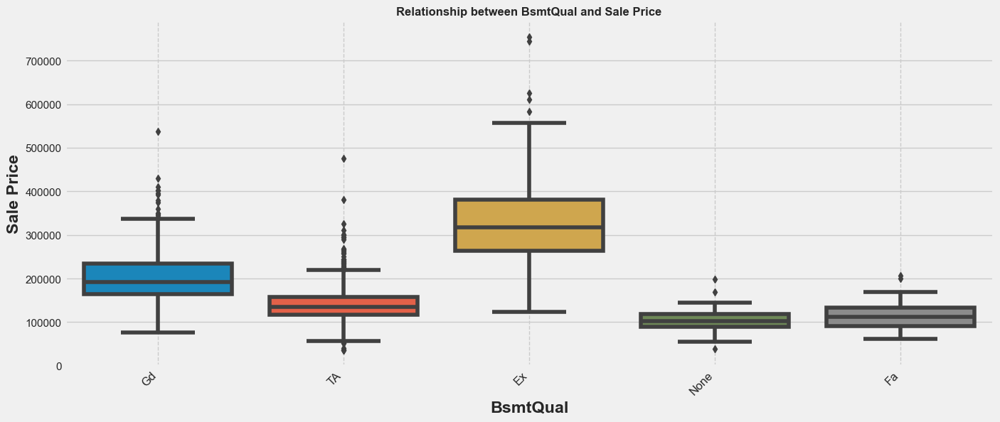

In [190]:
plt.figure(figsize=((15, 6)))
sns.boxplot(data=train, x='BsmtQual', y='SalePrice')
plt.title('Relationship between BsmtQual and Sale Price', weight = 'bold', fontsize = 12)
plt.grid(axis='x', linestyle='--')
plt.xticks(rotation=45, horizontalalignment='right',fontsize='small')
plt.xlabel('BsmtQual', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

#### Observations: 

- From the above boxplot we can observe variation in Sale Price across all the BsmtQual categories.

### Pairplots

**Comparison of  sale price  to each of the top 10 highly correlated independent variables**

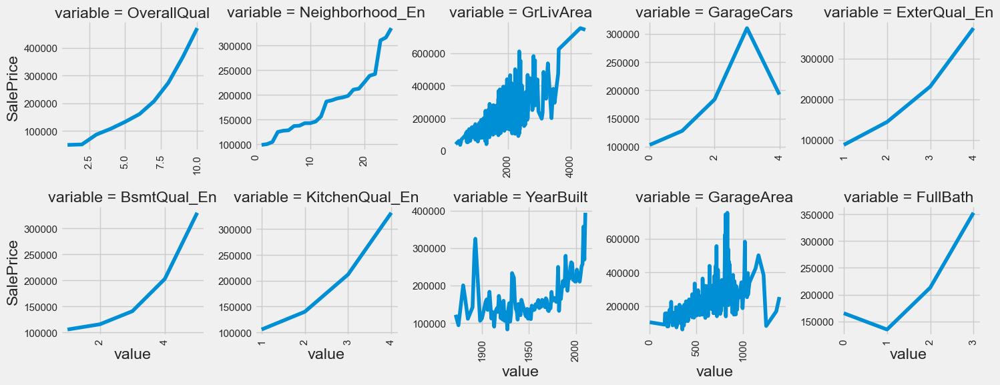

In [191]:
def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
top_10 = ['OverallQual', 'Neighborhood_En', 'GrLivArea', 'GarageCars', 'ExterQual_En', 'BsmtQual_En', 'KitchenQual_En', 'YearBuilt', 'GarageArea', 'FullBath']   
f = pd.melt(df_train, id_vars=['SalePrice'], value_vars=top_10)
g = sns.FacetGrid(f, col="variable",  col_wrap=5, sharex=False, sharey=False)
g = g.map(pairplot, "value", "SalePrice")

#### Observations: 

- From the above pairplots, most of top features observe to be having kind off increasing trend.

### Linear Regression Assumption

Before we move forward we need to understand the assumptions of linear regression:
* Linearity
* Homoscedasticity
* No or little Multicollinearity
* Independence of Error

Since we fit a linear model, we assume that the relationship is linear, and the errors, or residuals, are pure random fluctuations around the true line. We expect that the variability in the dependent variable doesn't increase as the value of the independent increases, which is the assumptions of equal variance, also known as Homoscedasticity. We also assume that the observations are independent of one another(No Multicollinearity), and a correlation between sequential observations or auto-correlation is not there.

Now, these assumptions are prone to happen altogether. In other words, if we see one of these assumptions in the dataset, it's more likely that we may come across with others mentioned above. Therefore, we can find and fix various assumptions with a few unique techniques.

In order to discover the linearity let's plot scatter plots for GrLivArea and MasVnrArea

<Axes: xlabel='MasVnrArea', ylabel='SalePrice'>

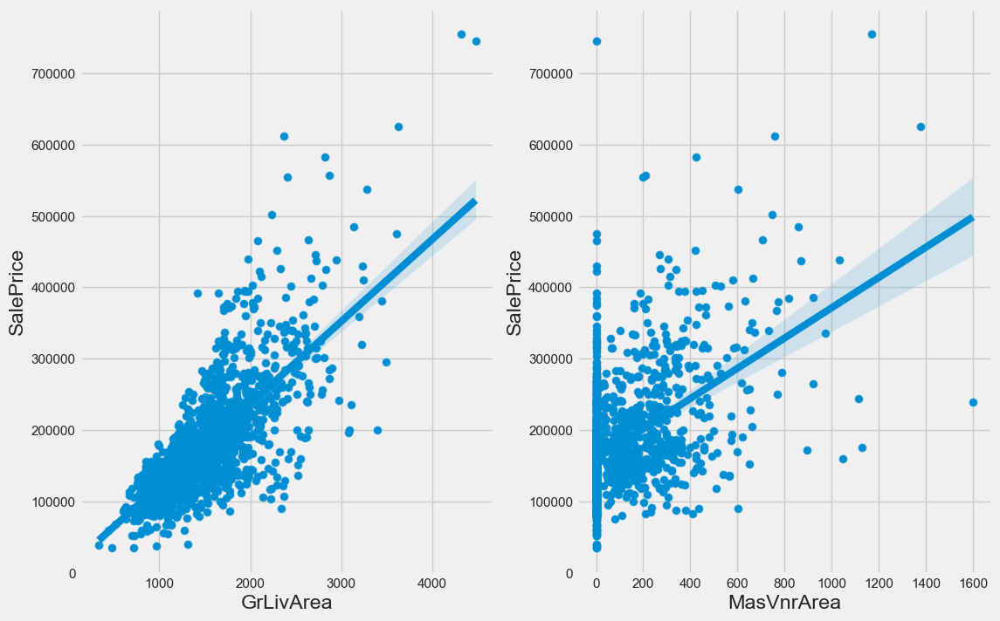

In [192]:
## Scatter plotting for SalePrice and GrLivArea.
fig, (ax1, ax2) = plt.subplots(figsize = (12, 8), ncols = 2,sharey = False)
 
sns.scatterplot(x = train['GrLivArea'], y = train['SalePrice'],  ax = ax1)
## Putting a regression line. 
sns.regplot(x = train['GrLivArea'], y = train['SalePrice'], ax = ax1)

sns.scatterplot(x = train['MasVnrArea'],y = train['SalePrice'], ax = ax2)
## regression line for MasVnrArea and SalePrice. 
sns.regplot(x = train['MasVnrArea'], y = train['SalePrice'], ax=ax2)

We can observe that the relationship between Sales Price and GrLivArea is much more linear than the relationship between Sales Price and MasVnrArea.


Let's look at the residual plot for independent variable GrLivArea and our target variable SalePrice. 

A residual value is a measure of how much a regression line vertically misses a data point. Regression lines are the best fit of a set of data. We can think of the lines as averages; a few data points will fit the line and others will miss. 
- A residual plot has the Residual Values on the vertical axis; 
- the horizontal axis displays the independent variable.

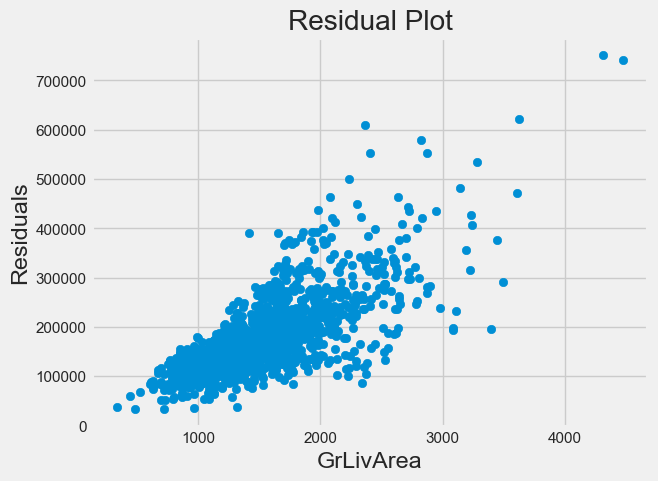

In [193]:
import matplotlib.pyplot as plt
df = train.copy()
# Calculate the residuals
residuals = df['SalePrice'] - df['GrLivArea']

# Create a scatter plot of residuals
plt.scatter(df['GrLivArea'], residuals)

# Add labels and title
plt.xlabel('GrLivArea')
plt.ylabel('Residuals')
plt.title('Residual Plot')

# Show the plot
plt.show()

Ideally, if the assumptions are met, the residuals will be randomly scattered around the centerline of zero with no apparent pattern. The residual will look like an unstructured cloud of points centered around zero. However, our residual plot is anything but an unstructured cloud of points. Even though it seems like there is a linear relationship between the response variable and predictor variable, the residual plot looks more like a funnel. 

The error plot shows that as GrLivArea value increases, the variance also increases, which is the characteristics known as Heteroscedasticity. The linear regression analysis requires the dependent variable to be multivariate normally distributed. A histogram, box plot, or a Q-Q-Plot can check if the target variable is normally distributed. 

Let's plot the three graphs again for the target feature.

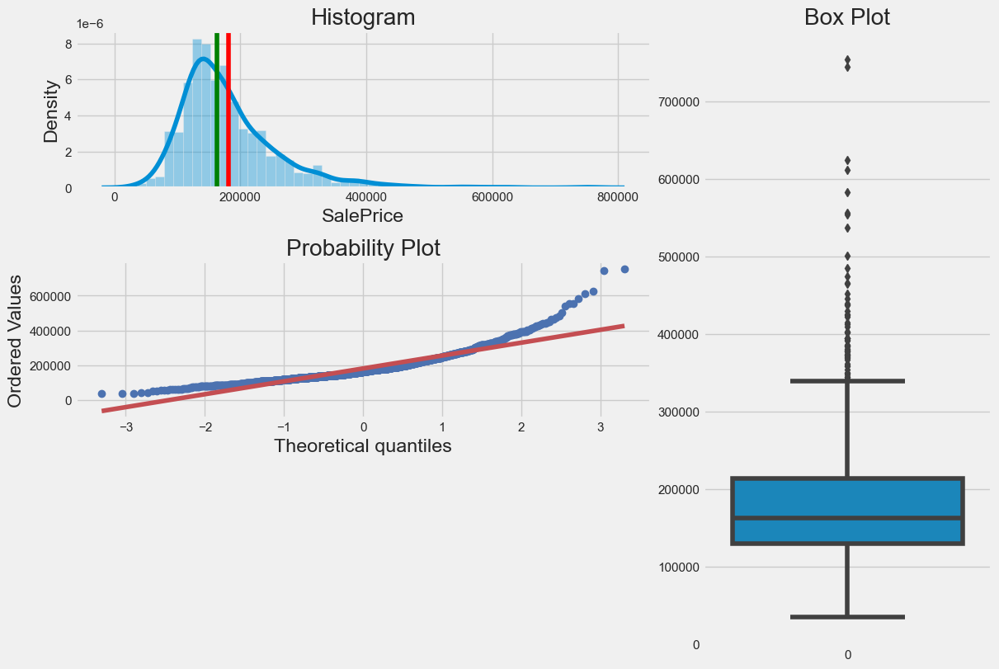

In [194]:
three_chart_plot(df, 'SalePrice')

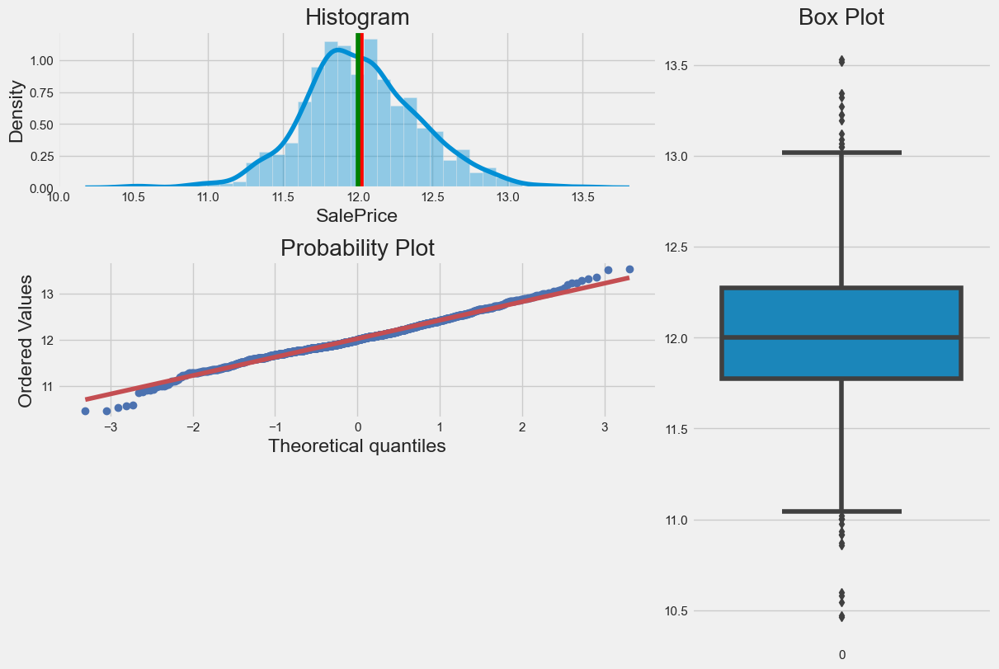

In [195]:
df["SalePrice"] = np.log1p(df["SalePrice"])
three_chart_plot(df, 'SalePrice')

We can observe that the SalesPrice feature now follows a normal distibution as the Histogram resembles bell-shape and the QQ-plot also overlaps with the red line. Let's again plot the scatter plot for GrLivArea and SalePrice to see whether Heteroscedasticity was removed.

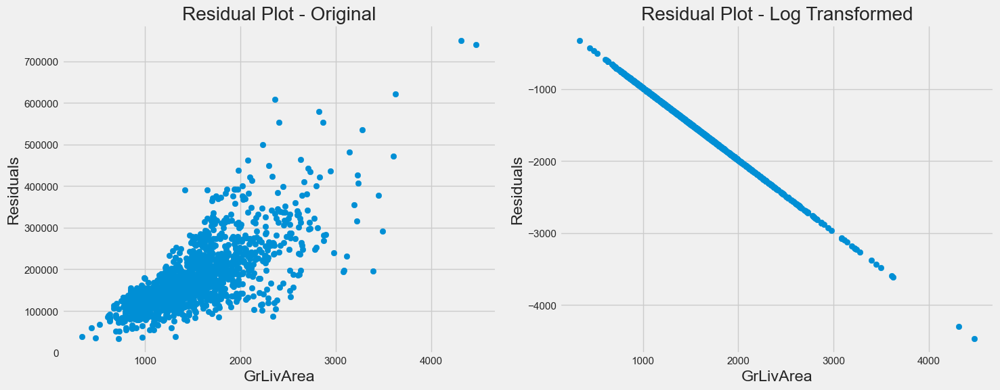

In [196]:
import matplotlib.pyplot as plt

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(figsize=(15, 6), ncols=2, sharey=False, sharex=False)

# Calculate the residuals for the first plot
residuals1 =train['SalePrice'] - train['GrLivArea']

# Create the scatter plot for the first plot
ax1.scatter(train['GrLivArea'], residuals1)

# Set labels and title for the first plot
ax1.set_xlabel('GrLivArea')
ax1.set_ylabel('Residuals')
ax1.set_title('Residual Plot - Original')

# Calculate the residuals for the second plot
residuals2 = df['SalePrice'] - df['GrLivArea']

# Create the scatter plot for the second plot
ax2.scatter(df['GrLivArea'], residuals2)

# Set labels and title for the second plot
ax2.set_xlabel('GrLivArea')
ax2.set_ylabel('Residuals')
ax2.set_title('Residual Plot - Log Transformed')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


- Linear Regression indicates significant relationships between the dependent variable and the independent variable. It assumes that there is a linear relationship between the independent variables and the dependent variable but this is not always the case in real life. There are very less scenarios where this assumption holds true. Multiple Regression also suffers from multi-collinearity, auto-correlation, and heteroskedasticity.

- The interpretation of the linear coefficient is that it represents the mean change in the dependent variable for 1 unit change in the independent variable when all the other independent variables are held constant.

Now suppose that there are two correlated independent variables (A and B) and we are aiming to find the right coefficient for these independent variables. When the coefficient for A is calculated, will that coefficient be accurate? No, it won’t be right because changes in A are associated with shifts in B, and as we have already discussed that all the other variables need to be held constant, B can’t be held as a constant because A and B are correlated. This is known as Multicollinearity and it is one of the disadvantages of Linear Regression.

In order to solve this problem, we use various regularization techniques (l1, l2 etc) or other kind of regression techniques like Elastic Net Regression, Lasso and Ridge Regression which automatically takes care of multicollinearity.

In [197]:
train_data = df_train.select_dtypes(exclude = 'category')
del train_data['Id']

In [198]:
test_data = df_test.select_dtypes(exclude = 'object')
del test_data['Id']

In [199]:
train_data.shape,test_data.shape

((1458, 123), (1459, 79))

### Feature Selections for the Models


In [200]:
def plot_correlation_heatmap(data, column_names):
    # Create correlation matrix from data excluding the last column
    corr_mat = data[column_names].corr()

    # Plot correlation heatmap
    plt.figure(figsize=(12, 6))
    sns.heatmap(corr_mat,
                annot=True,
                fmt='.1f',
                cmap='GnBu',
                vmin=0.5,
                vmax=1)
    plt.title('Correlation Heatmap')
    plt.show()

### Top 5 Highly Correlated Numerical Features

In [201]:
top5_num_feature = ['OverallQual','GrLivArea','TotalBsmtSF','GarageCars','1stFlrSF']

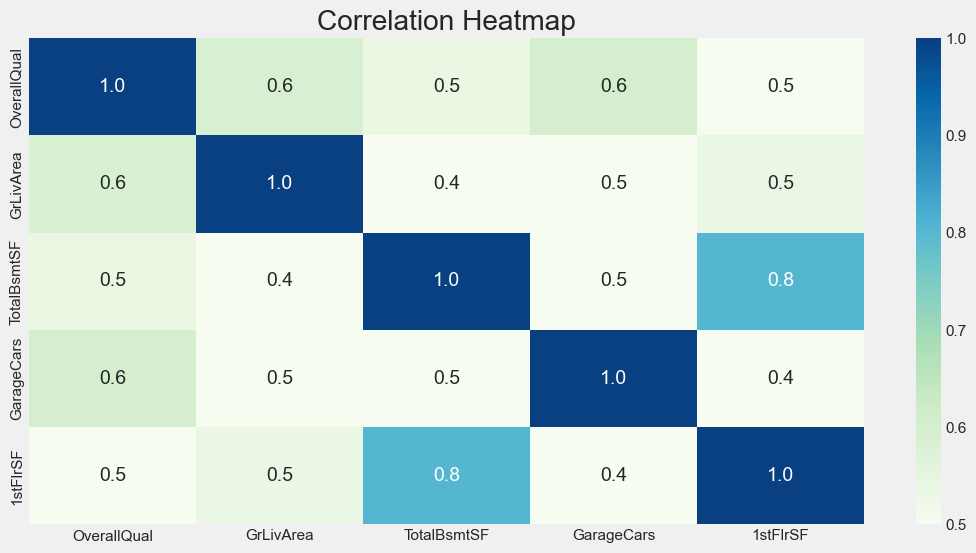

In [202]:
plot_correlation_heatmap(train_data, top5_num_feature)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


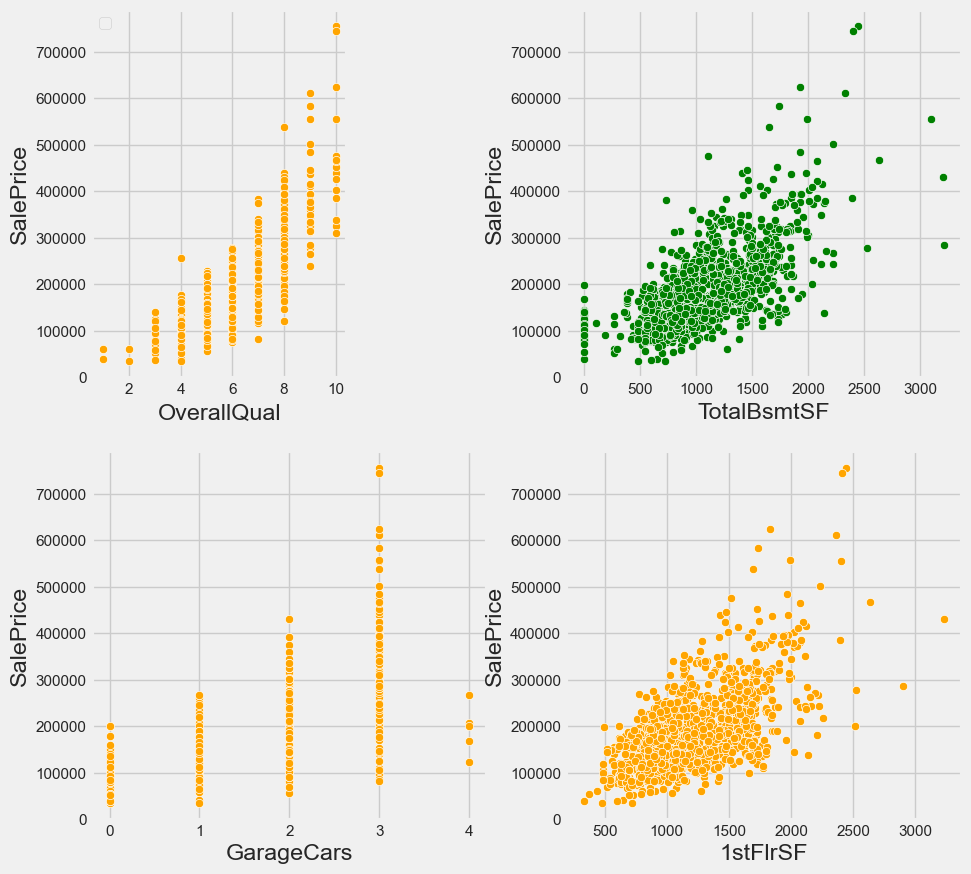

In [230]:
## Scatterplots
plt.figure(figsize=(10,10))
features_to_examine = ['GrLivArea','TotalBsmtSF','GarageCars','1stFlrSF']
plt.subplot(2,2,1)
sns.scatterplot(data=train_data,x='GrLivArea',y='SalePrice',color='blue')
plt.subplot(2,2,2)
sns.scatterplot(data=train_data,x='TotalBsmtSF',y='SalePrice',color='green')
plt.subplot(2,2,3)
sns.scatterplot(data=train_data,x='GarageCars',y='SalePrice',color='orange')
plt.subplot(2,2,4)
sns.scatterplot(data=train_data,x='1stFlrSF',y='SalePrice',color='orange')
plt.subplot(2,3,1)
sns.scatterplot(data=train_data,x='OverallQual',y='SalePrice',color='orange')
plt.legend()

### Top 5 Highly Correlated Categorical Features

In [203]:
top5_cat_feature = ['Neighborhood_En','ExterQual_En','BsmtQual_En','KitchenQual_En','GarageFinish_En']

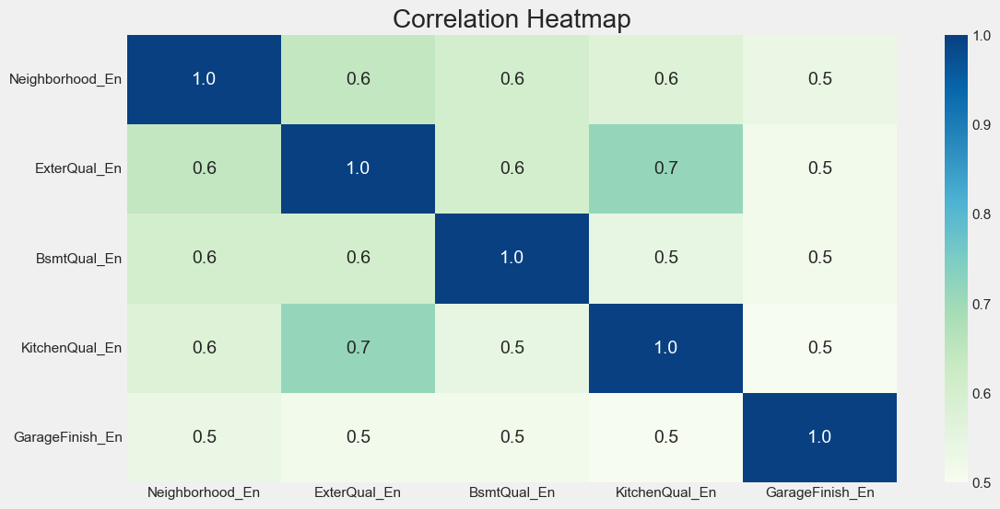

In [204]:
plot_correlation_heatmap(train_data, top5_cat_feature)

### Top 10 Highly Correlated Categorical Features

In [205]:
# Sort the dataframe by the "spearman" column in descending order and select the top 10 rows
top_ten_features = spr.sort_values(by='spearman', ascending=False).head(10)
# Extract the features and store them in a list
feature_list = top_ten_features['feature'].tolist()

# Print the feature list
print(feature_list)

['OverallQual', 'Neighborhood_En', 'GrLivArea', 'GarageCars', 'ExterQual_En', 'BsmtQual_En', 'KitchenQual_En', 'YearBuilt', 'GarageArea', 'FullBath']


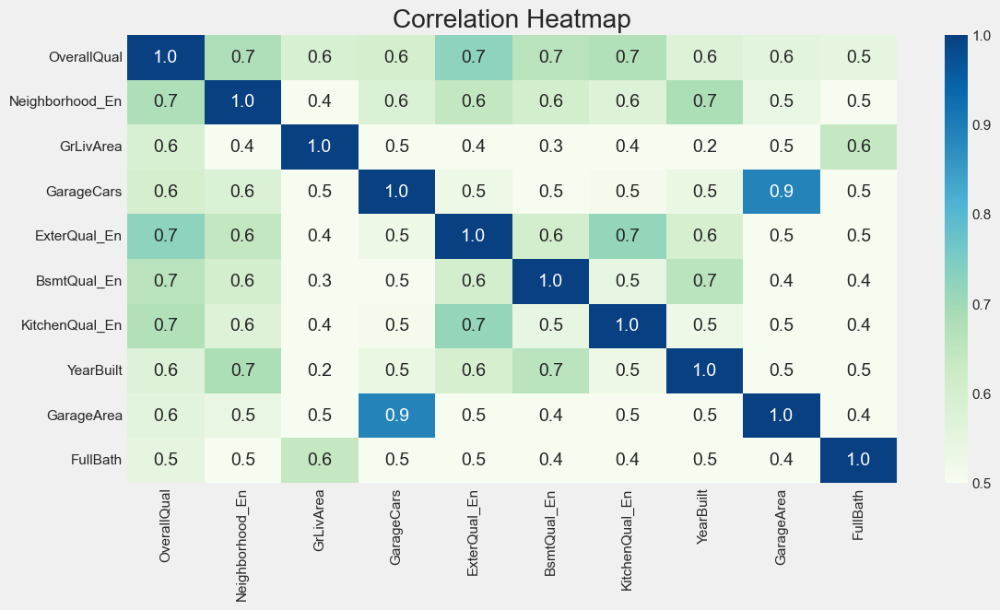

In [206]:
plot_correlation_heatmap(train_data, feature_list)

## Training and Testing Machine Learning Models

In [210]:
from sklearn.linear_model import LinearRegression

# Assuming you have your data stored in the `data` variable, where the last column is the target variable
X_num = train_data[top5_num_feature]  # Features
X_cat = train_data[top5_cat_feature]  # Features
X_feat = train_data[feature_list]  # Features

y_train = np.log1p(train["SalePrice"])

y =  np.log1p(train["SalePrice"])  # Target variable

# Create a linear regression model
lr = LinearRegression()

In [211]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_num, y, test_size = 0.25, random_state = 0)
X_train_cat, X_val_cat, y_train_cat, y_val_cat = train_test_split(X_cat, y, test_size = 0.25, random_state = 0)
X_train_top, X_val_top, y_train_top, y_val_top = train_test_split(X_feat, y, test_size = 0.25, random_state = 0)

In [212]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
import numpy as np

def evaluation(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

        # Explore coefficients and intercept
        print("Coefficient values:")
        for col_name, coef in zip(x_train.columns, model.coef_):
            print("The coefficient for {} is {:.2f}".format(col_name, coef))

        intercept = model.intercept_
        print("The intercept for our model is {:.2f}".format(intercept))

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

### Q.Build a minimum of two separate regression models using the training set.

## Model 1: Top 5 Correlated Numerical Features

In [213]:
lr = LinearRegression()
lr.fit(X_train, y_train)

evaluation(lr, X_train, y_train, X_val, y_val, True)
evaluation(lr, X_train, y_train, X_val, y_val, False)

Train Result:
Root Mean Squared Error: 0.17
_______________________________________________
Mean Squared Error: 0.03
_______________________________________________
Mean Absolute Error: 
0.12
_______________________________________________
R^2 Score: 0.81
_______________________________________________

Cross-validation scores: [0.78170797 0.77271756 0.87962365 0.77208921 0.81814504]
Mean CV score: 0.8048566849861029
Standard deviation of CV scores: 0.04101017618830708

Coefficient values:
The coefficient for OverallQual is 0.12
The coefficient for GrLivArea is 0.00
The coefficient for TotalBsmtSF is 0.00
The coefficient for GarageCars is 0.10
The coefficient for 1stFlrSF is 0.00
The intercept for our model is 10.53

Validation Result:
Root Mean Squared Error: 0.15
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.12
_______________________________________________
R^2 Score: 0.87
____________

**Observations for the model results are as follows:**

- Train Result:

- Root Mean Squared Error (RMSE): 0.17
- Mean Squared Error (MSE): 0.03
- Mean Absolute Error (MAE): 0.12
- R^2 Score: 0.81
**Summary:-** The model's performance on the training data is decent. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.17 and 0.03 units from the actual values, respectively. The MAE of 0.12 suggests that, on average, the model's predictions have an absolute difference of 0.12 units from the actual values. The R^2 score of 0.81 indicates that the model explains 81% of the variance in the training data, which is a moderately good fit.

**Cross-validation scores:**  The model's performance was evaluated using cross-validation, and the scores obtained for each fold are [0.78170797, 0.77271756, 0.87962365, 0.77208921, 0.81814504]. The mean cross-validation score is 0.8048566849861029, indicating that the model performs reasonably well on average across different folds. The standard deviation of CV scores is 0.04101017618830708, suggesting a moderate degree of variability in the model's performance across folds.

**Coefficient values:** The model's coefficients for the features are provided. Notably, the coefficient for OverallQual is 0.12, for GrLivArea is 0.00, for TotalBsmtSF is 0.00, for GarageCars is 0.10, and for 1stFlrSF is 0.00. The intercept for the model is 10.53.

**Validation Result:**

- Root Mean Squared Error (RMSE): 0.15
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.12
- R^2 Score: 0.87
**Summary:-** The model's performance on the validation data is slightly better than on the training data. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.15 and 0.02 units from the actual values, respectively. The MAE of 0.12 suggests that, on average, the model's predictions have an absolute difference of 0.12 units from the actual values. The R^2 score of 0.87 indicates that the model explains 87% of the variance in the validation data, which is a relatively good fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation on the validation data, and the scores obtained for each fold are [0.89760596, 0.88655396, 0.86897469, 0.80655838, 0.85757987]. The mean cross-validation score is 0.86, suggesting that the model performs well on average across different folds. The standard deviation of CV scores is 0.03, indicating a relatively low variability in the model's performance across folds.

In summary ,  the model shows reasonably good performance on both the training and validation data, with slightly better results on the validation set. The R^2 scores indicate a reasonable ability to explain the variance in the target variable. However, it is important to consider additional factors such as the specific problem domain and the context in which the model is being applied to fully evaluate its effectiveness.



## Model 2: Top 5 Correlated Categorical Features

In [214]:
lr_cat = LinearRegression()

lr_cat.fit(X_train_cat, y_train_cat)


evaluation(lr_cat, X_train_cat, y_train_cat, X_val_cat, y_val_cat, True)
evaluation(lr_cat, X_train_cat, y_train_cat, X_val_cat, y_val_cat, False)

Train Result:
Root Mean Squared Error: 0.22
_______________________________________________
Mean Squared Error: 0.05
_______________________________________________
Mean Absolute Error: 
0.16
_______________________________________________
R^2 Score: 0.69
_______________________________________________

Cross-validation scores: [0.73035348 0.66541305 0.67330324 0.6478604  0.68805761]
Mean CV score: 0.6809975544348974
Standard deviation of CV scores: 0.027878314880830812

Coefficient values:
The coefficient for Neighborhood_En is 0.02
The coefficient for ExterQual_En is 0.09
The coefficient for BsmtQual_En is 0.09
The coefficient for KitchenQual_En is 0.13
The coefficient for GarageFinish_En is 0.07
The intercept for our model is 10.72

Validation Result:
Root Mean Squared Error: 0.22
_______________________________________________
Mean Squared Error: 0.05
_______________________________________________
Mean Absolute Error: 
0.17
_______________________________________________
R^2 Score

**Observations for the given model2 results are as follows:**

**Train Result:**

- Root Mean Squared Error (RMSE): 0.22
- Mean Squared Error (MSE): 0.05
- Mean Absolute Error (MAE): 0.16
- R^2 Score: 0.69
**Summary_Train_Result:-** The model's performance on the training data is moderate. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.22 and 0.05 units from the actual values, respectively. The MAE of 0.16 suggests that, on average, the model's predictions have an absolute difference of 0.16 units from the actual values. The R^2 score of 0.69 indicates that the model explains 69% of the variance in the training data, which is a fair fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation, and the scores obtained for each fold are [0.73035348, 0.66541305, 0.67330324, 0.6478604, 0.68805761]. The mean cross-validation score is 0.6809975544348974, suggesting that the model performs reasonably well on average across different folds. The standard deviation of CV scores is 0.027878314880830812, indicating a relatively low variability in the model's performance across folds.

**Coefficient values:** The model's coefficients for the features are provided. The coefficients for Neighborhood_En, ExterQual_En, BsmtQual_En, KitchenQual_En, and GarageFinish_En are 0.02, 0.09, 0.09, 0.13, and 0.07, respectively. The intercept for the model is 10.72.

**Validation Result:**

- Root Mean Squared Error (RMSE): 0.22
- Mean Squared Error (MSE): 0.05
- Mean Absolute Error (MAE): 0.17
- R^2 Score: 0.72

**Summary_Validation_Result:-** The model's performance on the validation data is similar to the performance on the training data. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.22 and 0.05 units from the actual values, respectively. The MAE of 0.17 suggests that, on average, the model's predictions have an absolute difference of 0.17 units from the actual values. The R^2 score of 0.72 indicates that the model explains 72% of the variance in the validation data, which is a reasonable fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation on the validation data, and the scores obtained for each fold are [0.71748116, 0.73819565, 0.72248536, 0.52479742, 0.77184347]. The mean cross-validation score is 0.69, suggesting that the model performs reasonably well on average across different folds. The standard deviation of CV scores is 0.09, indicating a higher variability in the model's performance across folds compared to the training data.

In Summary, the model shows moderate performance on both the training and validation data, with slightly better results on the validation set. The R^2 scores indicate a decent ability to explain the variance in the target variable. However, it is important to consider additional factors such as the specific problem domain and the context in which the model is being applied to fully evaluate its effectiveness.



#### Observations:

- Model 2 with Categorical Features: This model shows slightly higher RMSE compared to Model 1, with an RMSE of 0.22 (train) and 0.22 (validation). The R^2 score is 0.69 (train) and 0.72 (validation), indicating a less optimal fit compared to Model 1. The cross-validation scores are lower, with a mean CV score of 0.68, suggesting less consistency in performance across folds.

## Model 3: Top 10 Correlated Features

In [215]:
lr_feat = LinearRegression()

lr_feat.fit(X_train_top, y_train_top)


evaluation(lr_feat, X_train_top, y_train_top, X_val_top, y_val_top, True)
evaluation(lr_feat, X_train_top, y_train_top, X_val_top, y_val_top, False)

Train Result:
Root Mean Squared Error: 0.16
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.12
_______________________________________________
R^2 Score: 0.84
_______________________________________________

Cross-validation scores: [0.81595675 0.8102802  0.87731384 0.81578836 0.85384588]
Mean CV score: 0.8346370055781069
Standard deviation of CV scores: 0.026411248753509694

Coefficient values:
The coefficient for OverallQual is 0.07
The coefficient for Neighborhood_En is 0.01
The coefficient for GrLivArea is 0.00
The coefficient for GarageCars is 0.02
The coefficient for ExterQual_En is 0.00
The coefficient for BsmtQual_En is 0.04
The coefficient for KitchenQual_En is 0.06
The coefficient for YearBuilt is 0.00
The coefficient for GarageArea is 0.00
The coefficient for FullBath is -0.04
The intercept for our model is 8.25

Validation Result:
Root Mean Squared Error: 0.14
__________________

**Observations for the given model3 results are as follows:**

**Train Result:**

- Root Mean Squared Error (RMSE): 0.16
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.12
- R^2 Score: 0.84

**Summary_Train_Result:-** The model's performance on the training data is good. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.16 and 0.02 units from the actual values, respectively. The MAE of 0.12 suggests that, on average, the model's predictions have an absolute difference of 0.12 units from the actual values. The R^2 score of 0.84 indicates that the model explains 84% of the variance in the training data, which is a strong fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation, and the scores obtained for each fold are [0.81595675, 0.8102802, 0.87731384, 0.81578836, 0.85384588]. The mean cross-validation score is 0.8346370055781069, indicating that the model performs well on average across different folds. The standard deviation of CV scores is 0.026411248753509694, suggesting a relatively low variability in the model's performance across folds.

**Coefficient values:** The model's coefficients for the features are provided. Notably, the coefficient for OverallQual is 0.07, for Neighborhood_En is 0.01, for GrLivArea is 0.00, for GarageCars is 0.02, for ExterQual_En is 0.00, for BsmtQual_En is 0.04, for KitchenQual_En is 0.06, for YearBuilt is 0.00, for GarageArea is 0.00, and for FullBath is -0.04. The intercept for the model is 8.25.

**Validation Result:**

- Root Mean Squared Error (RMSE): 0.14
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.11
- R^2 Score: 0.88
**Summary_Validation_Result:-** The model's performance on the validation data is excellent. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.14 and 0.02 units from the actual values, respectively. The MAE of 0.11 suggests that, on average, the model's predictions have an absolute difference of 0.11 units from the actual values. The R^2 score of 0.88 indicates that the model explains 88% of the variance in the validation data, which is a very strong fit.

**Cross-validation scores:**  The model's performance was evaluated using cross-validation on the validation data, and the scores obtained for each fold are [0.88964821, 0.86558004, 0.8936478, 0.85785947, 0.87876405]. The mean cross-validation score is 0.88, suggesting that the model performs exceptionally well on average across different folds. The standard deviation of CV scores is 0.01, indicating a low variability in the model's performance across folds.

In summary, **Model 3 demonstrates good to excellent performance on both the training and validation data.** The R^2 scores indicate a strong ability to explain the variance in the target variable. The coefficients provide insights into the influence of different features on the predictions

## Predictions with Models

### Model 1  

In [222]:
test_pred_num = lr.predict(test_data[top5_num_feature])
test_pred_num = np.expm1(test_pred_num)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred_num 
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,112343.0
1,1462,154375.0
2,1463,149004.0
3,1464,166925.0
4,1465,212560.0


In [217]:
submission.to_csv("Prat_Model1_Result_numeric.csv", index = False, header = True)

### Model 2

In [219]:
test_pred_cat = lr_cat.predict(test_data[top5_cat_feature])
test_pred_cat = np.expm1(test_pred_cat)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred_cat 
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,66942.0
1,1462,76609.0
2,1463,79804.0
3,1464,83722.0
4,1465,108699.0


In [220]:
submission.to_csv("Prat_Model2_Result_categorical.csv", index = False, header = True)

### Model 3

In [221]:
test_pred_feat = lr_feat.predict(test_data[feature_list])
test_pred_feat = np.expm1(test_pred_feat)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred_feat 
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,94535.0
1,1462,112730.0
2,1463,120689.0
3,1464,130637.0
4,1465,144541.0


In [223]:
submission.to_csv("Prat_Model3_Result_top_Features.csv", index = False, header = True)

#### Provide your Kaggle user name and a screen snapshot of your Kaggle scores.
USERNAME:- YushVats
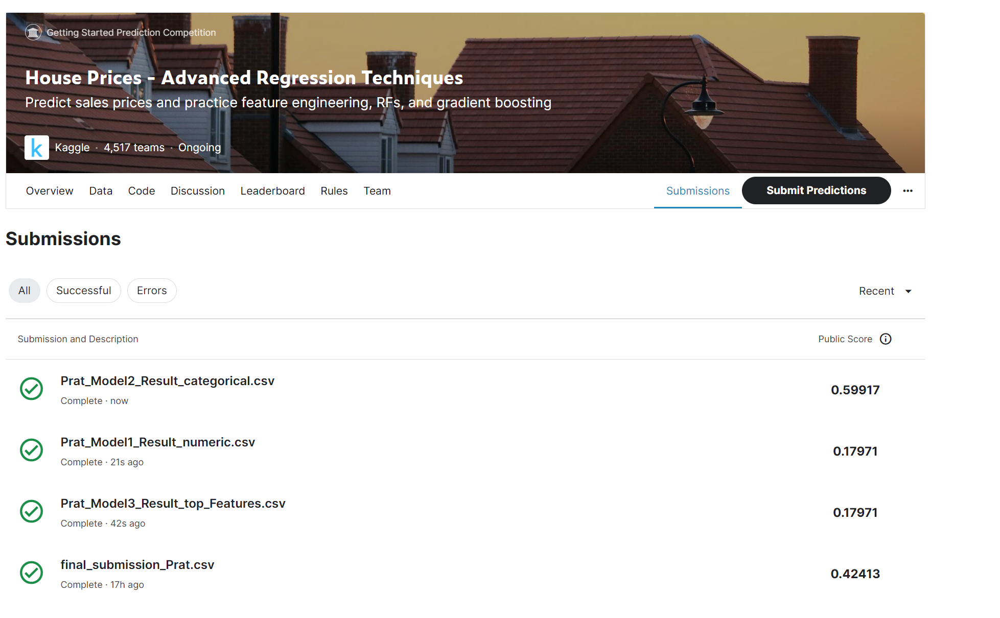

**Important Feedback** :- Final_submission_prat was prepared first with features selected using Lasso and has been dropped for later week's assignment.

## Feature Creation

In [224]:
train_data = df_train.select_dtypes(exclude = 'category')
# del train_data['Id']

In [225]:
train_data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageType_En,GarageFinish_En,GarageQual_En,GarageCond_En,PavedDrive_En,PoolQC_En,Fence_En,MiscFeature_En,SaleType_En,SaleCondition_En
0,1,60,RL,65.0,8450,Pave,None,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
1,2,20,RL,80.0,9600,Pave,None,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
2,3,60,RL,68.0,11250,Pave,None,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
3,4,70,RL,60.0,9550,Pave,None,IR1,Lvl,AllPub,...,3.0,2.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,2.0
4,5,60,RL,84.0,14260,Pave,None,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0


**1. House Age**

In [239]:
# Current year 
current_year = datetime.datetime.now().year

# Subtract 'YearBuilt' from the current year to calculate 'House Age'
train_data['HouseAge'] = current_year - train_data['YearBuilt']
test_data['HouseAge'] = current_year - test_data['YearBuilt']

In [240]:
train_data['HouseAge'].head()

0     20
1     47
2     22
3    108
4     23
Name: HouseAge, dtype: int64

In [241]:
test_data['HouseAge'].head()

0    62
1    65
2    26
3    25
4    31
Name: HouseAge, dtype: int64

**2. TotalLivingArea**

In [244]:
train_data['TotalLivingArea'] = train_data['GrLivArea'] + train_data['TotalBsmtSF']
test_data['TotalLivingArea'] = test_data['GrLivArea'] + test_data['TotalBsmtSF']

In [245]:
train_data['TotalLivingArea'].head()

0    2566
1    2524
2    2706
3    2473
4    3343
Name: TotalLivingArea, dtype: int64

In [246]:
test_data['TotalLivingArea'].head()

0    1778.0
1    2658.0
2    2557.0
3    2530.0
4    2560.0
Name: TotalLivingArea, dtype: float64

#### 3. Total Surface Area

In [233]:
# Adding total sqfootage features 
# In order to get the total area of the house we have to add the basement area, 1st floor area and 2nd floor area.

train_data['TotalSF'] = train_data['TotalBsmtSF'] + train_data['1stFlrSF'] + train_data['2ndFlrSF']
train_data['TotalSF'].head()

0    2566
1    2524
2    2706
3    2473
4    3343
Name: TotalSF, dtype: int64

In [247]:
test_data['TotalSF'] = test_data['TotalBsmtSF'] + test_data['1stFlrSF'] + test_data['2ndFlrSF']
test_data['TotalSF'].head()

0    1778.0
1    2658.0
2    2557.0
3    2530.0
4    2560.0
Name: TotalSF, dtype: float64

- I have added certain features which are quite intuitive and are taken into consideration in real life too while buying the house. Like what's the total area in square feet of the house and how old is the house.

- `HouseAge`, 'TotalLivingArea' & `TotalSF` are the new features which can be useful in predicting the `SalePrice` of the house.

#### 4. Remodeled & New Houses

In [248]:
train_data['reModeled'] = np.where(train_data.YearRemodAdd == train_data.YearBuilt, 0, 1)
train_data['isNew'] = np.where(train_data.YrSold == train_data.YearBuilt, 1, 0)

test_data['reModeled'] = np.where(test_data.YearRemodAdd == test_data.YearBuilt, 0, 1)
test_data['isNew'] = np.where(test_data.YrSold == test_data.YearBuilt, 1, 0)

### Relationship of Newly created  Features with Sale Price

#### 1. House Age Vs Sale Price

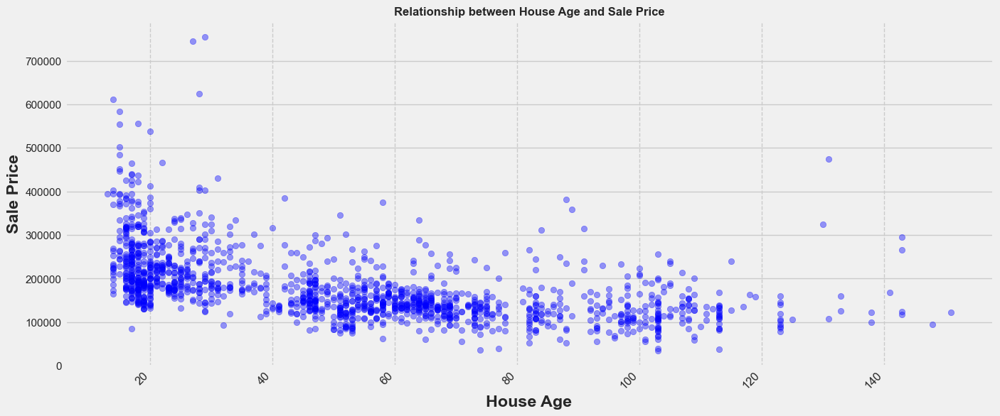

In [249]:
plt.figure(figsize=((15, 6)))
plt.scatter(x = 'HouseAge', y = 'SalePrice', data = train_data, alpha=0.4,color='blue')
plt.title('Relationship between House Age and Sale Price', weight = 'bold', fontsize = 12)
plt.grid(axis='x', linestyle='--')
plt.xticks(rotation=45, horizontalalignment='right',fontsize='small')
plt.xlabel('House Age', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

#### Observations:

- There seems to be negative correlation between house age and sale price: Generally, as the house age increases, the sale price tends to decrease. This is evident from the general downward trend in the scatter plot.

#### 2. TotalLivingArea Vs Sale Price

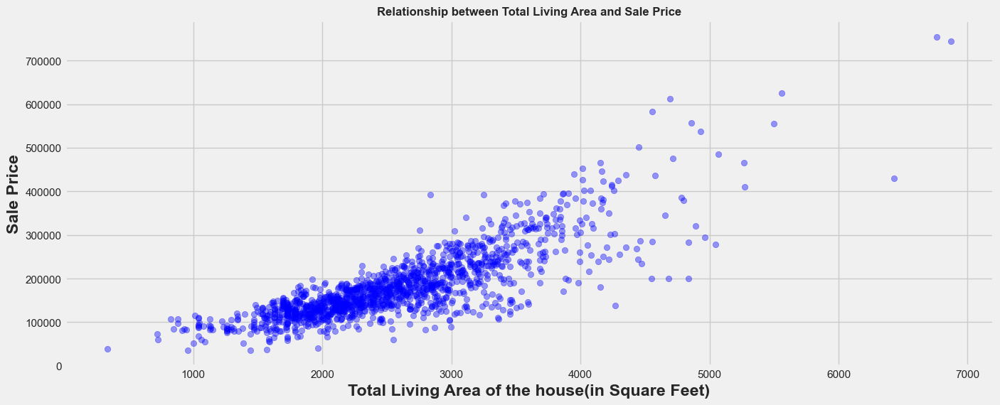

In [252]:
plt.figure(figsize = ((15, 6)))
plt.scatter(x = 'TotalLivingArea', y = 'SalePrice', data = train_data, alpha=0.4,color='blue')
plt.title('Relationship between Total Living Area and Sale Price', weight = 'bold', fontsize = 12)
plt.xlabel('Total Living Area of the house(in Square Feet)', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

**Explanation and Observation**:-
The correlation between TotalLivingArea and SalePrice is 0.78 (0.7789588289942262).

- A correlation value ranges from -1 to 1, where a value close to 1 indicates a strong positive correlation. In this case, the correlation coefficient of **0.78** suggests a **strong positive relationship between TotalLivingArea and SalePrice**.

- It means that as the TotalLivingArea of a house increases, the SalePrice tends to increase as well. In other words, there is a tendency for larger living areas to be associated with higher sale prices. This positive correlation indicates that TotalLivingArea is a potentially influential predictor of SalePrice in the house price dataset.

#### 3. TotalSF Vs Sale Price

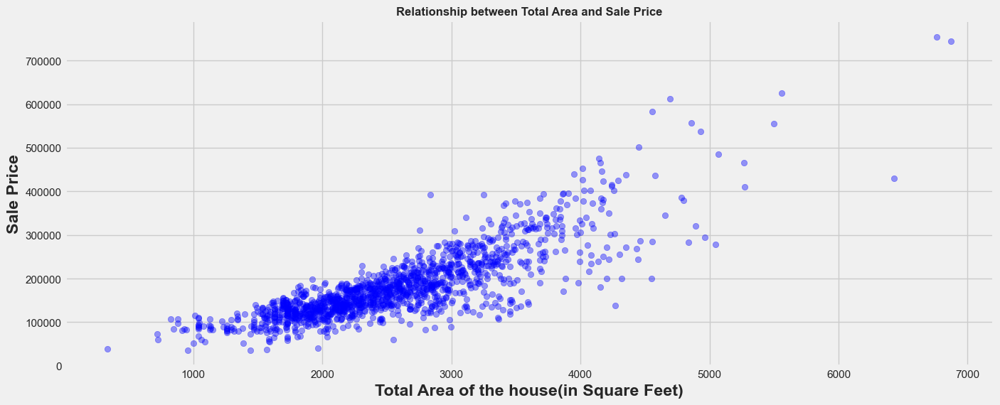

In [251]:
plt.figure(figsize = ((15, 6)))
plt.scatter(x = 'TotalSF', y = 'SalePrice', data = train_data, alpha=0.4,color='blue')
plt.title('Relationship between Total Area and Sale Price', weight = 'bold', fontsize = 12)
plt.xlabel('Total Area of the house(in Square Feet)', weight = 'bold')
plt.ylabel('Sale Price', weight = 'bold')
plt.show()

Out of new Features ,it makes no sense to include both TotalSF and TotalLivingArea together in the model and hence we will select only one i.e TotalLivingArea.

## Model 4: Top 10 Highly Correlated Features along with newly created Features

In [253]:
feature_list

['OverallQual',
 'Neighborhood_En',
 'GrLivArea',
 'GarageCars',
 'ExterQual_En',
 'BsmtQual_En',
 'KitchenQual_En',
 'YearBuilt',
 'GarageArea',
 'FullBath']

In [254]:
feature_list = feature_list + ['TotalLivingArea','HouseAge']
X_feat_new = train_data[feature_list]  

In [255]:
X_train_new, X_val_new, y_train_new, y_val_new = train_test_split(X_feat_new, y, test_size = 0.25, random_state = 0)

In [256]:
lr_feat_new = LinearRegression()

lr_feat_new.fit(X_train_new, y_train_new)


evaluation(lr_feat_new, X_train_new, y_train_new,X_val_new,y_val_new, True)
evaluation(lr_feat_new, X_train_new, y_train_new,X_val_new,y_val_new, False)

Train Result:
Root Mean Squared Error: 0.15
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.11
_______________________________________________
R^2 Score: 0.86
_______________________________________________

Cross-validation scores: [0.83470141 0.82170775 0.89520116 0.83293091 0.86706098]
Mean CV score: 0.8503204438119031
Standard deviation of CV scores: 0.027053874796741477

Coefficient values:
The coefficient for OverallQual is 0.06
The coefficient for Neighborhood_En is 0.01
The coefficient for GrLivArea is 0.00
The coefficient for GarageCars is 0.03
The coefficient for ExterQual_En is 0.00
The coefficient for BsmtQual_En is 0.02
The coefficient for KitchenQual_En is 0.06
The coefficient for YearBuilt is 0.00
The coefficient for GarageArea is 0.00
The coefficient for FullBath is -0.03
The coefficient for TotalLivingArea is 0.00
The coefficient for HouseAge is -0.00
The intercept for our 

**Observations for the new model(Model4) with additional features:**

**Train Result:**

- Root Mean Squared Error (RMSE): 0.15
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.11
- R^2 Score: 0.86
**Summary_Train_result:-** The model's performance on the training data is good. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.15 and 0.02 units from the actual values, respectively. The MAE of 0.11 suggests that, on average, the model's predictions have an absolute difference of 0.11 units from the actual values. The R^2 score of 0.86 indicates that the model explains 86% of the variance in the training data, which is a strong fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation, and the scores obtained for each fold are [0.83470141, 0.82170775, 0.89520116, 0.83293091, 0.86706098]. The mean cross-validation score is 0.8503204438119031, indicating that the model performs well on average across different folds. The standard deviation of CV scores is 0.027053874796741477, suggesting a relatively low variability in the model's performance across folds.

**Coefficient values:** The model's coefficients for the features are provided. Notably, the coefficient for OverallQual is 0.06, for Neighborhood_En is 0.01, for GrLivArea is 0.00, for GarageCars is 0.03, for ExterQual_En is 0.00, for BsmtQual_En is 0.02, for KitchenQual_En is 0.06, for YearBuilt is 0.00, for GarageArea is 0.00, for FullBath is -0.03, for TotalLivingArea is 0.00, and for HouseAge is -0.00. The intercept for the model is 9.40.

**Validation Result:**

- Root Mean Squared Error (RMSE): 0.14
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.10
- R^2 Score: 0.89
**Summary_Validation_result:-** The model's performance on the validation data is excellent. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.14 and 0.02 units from the actual values, respectively. The MAE of 0.10 suggests that, on average, the model's predictions have an absolute difference of 0.10 units from the actual values. The R^2 score of 0.89 indicates that the model explains 89% of the variance in the validation data, which is a very strong fit.

**Cross-validation scores:** The model's performance was evaluated using cross-validation on the validation data, and the scores obtained for each fold are [0.90162266, 0.88653133, 0.89681467, 0.85171444, 0.89087402]. The mean cross-validation score is 0.89, suggesting that the model performs exceptionally well on average across different folds. The standard deviation of CV scores is 0.02, indicating a low variability in the model's performance across folds.

In summary , the new model with additional features shows improved performance compared to the previous models. The R^2 scores for both the training and validation data indicate a good fit, and the RMSE, MSE, and MAE values are relatively low. The model's coefficients provide insights into the importance of different features in predicting the target variable.







## Predictions with Model 4

In [257]:
test_pred_feat_new = lr_feat_new.predict(test_data[feature_list])
test_pred_feat_new = np.expm1(test_pred_feat_new)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred_feat_new 
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,97614.0
1,1462,128644.0
2,1463,126867.0
3,1464,140737.0
4,1465,157918.0


In [259]:
submission.to_csv("Prat_Model4_Result_top_with_NewFeatures.csv", index = False, header = True)

## Model 5: Polynomial Model with 14 Features

In [260]:
feature_list = feature_list + ['reModeled','isNew']
X_pol = train_data[feature_list]  

In [261]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler


#converting the independent variables  with degree of polynomial 2
poly_reg = PolynomialFeatures(degree=2)
X_pol = poly_reg.fit_transform(X_pol)


#feature scaling
sc_X_pol = StandardScaler()
X_pol = sc_X_pol.fit_transform(X_pol)

In [262]:
X_train_pol, X_val_pol, y_train_pol, y_val_pol = train_test_split(X_pol, y, test_size = 0.25, random_state = 0)

In [263]:
def evaluation_polynomial(model, x_train, y_train, x_val, y_val, train=True):
    if train:
        pred = model.predict(x_train)
        print("================================================")
        print("Train Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_train, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_train, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_train, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_train, y_train, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = cv_scores.mean()
        std_cv_score = cv_scores.std()

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)
        
        print()

    if not train:
        pred = model.predict(x_val)
        print()
        print("================================================")
        print("Validation Result:\n================================================")
        print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_val, pred)):.2f}")
        print("_______________________________________________")
        print(f"Mean Squared Error: {mean_squared_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"Mean Absolute Error: \n{mean_absolute_error(y_val, pred):.2f}")
        print("_______________________________________________")
        print(f"R^2 Score: {r2_score(y_val, pred):.2f}")
        print("_______________________________________________")

        print()

        # Perform cross-validation with 5 folds
        cv_scores = cross_val_score(model, x_val, y_val, cv=5, scoring='r2')

        # Calculate the mean and standard deviation of the cross-validation scores
        mean_cv_score = round(cv_scores.mean(),2)
        std_cv_score = round(cv_scores.std(),2)

        print("Cross-validation scores:", cv_scores)
        print("Mean CV score:", mean_cv_score)
        print("Standard deviation of CV scores:", std_cv_score)

In [264]:
lr_pol = LinearRegression()

lr_pol.fit(X_train_pol, y_train_pol)

evaluation_polynomial(lr_pol, X_train_pol, y_train_pol,X_val_pol,y_val_pol, True)
evaluation_polynomial(lr_pol, X_train_pol, y_train_pol,X_val_pol,y_val_pol, False)

Train Result:
Root Mean Squared Error: 0.13
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.10
_______________________________________________
R^2 Score: 0.88
_______________________________________________

Cross-validation scores: [0.79200875 0.83705715 0.90062651 0.84656174 0.84858165]
Mean CV score: 0.8449671609254701
Standard deviation of CV scores: 0.03458534911833849


Validation Result:
Root Mean Squared Error: 0.14
_______________________________________________
Mean Squared Error: 0.02
_______________________________________________
Mean Absolute Error: 
0.10
_______________________________________________
R^2 Score: 0.89
_______________________________________________

Cross-validation scores: [0.82165975 0.83255926 0.77310873 0.55434714 0.81808079]
Mean CV score: 0.76
Standard deviation of CV scores: 0.1


**Observations for the polynomial model with degree2 (Model5):**

**Train Result:**

- Root Mean Squared Error (RMSE): 0.13
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.10
- R^2 Score: 0.88
**Summary_Train_Result:-** The model's performance on the training data is very good. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.13 and 0.02 units from the actual values, respectively. The MAE of 0.10 suggests that, on average, the model's predictions have an absolute difference of 0.10 units from the actual values. The R^2 score of 0.88 indicates that the model explains 88% of the variance in the training data, which is a strong fit.

- Cross-validation scores: The model's performance was evaluated using cross-validation, and the scores obtained for each fold are [0.79200875, 0.83705715, 0.90062651, 0.84656174, 0.84858165]. The mean cross-validation score is 0.8449671609254701, suggesting that the model performs well on average across different folds. The standard deviation of CV scores is 0.03458534911833849, indicating a moderate variability in the model's performance across folds.

**Validation Result:**

- Root Mean Squared Error (RMSE): 0.14
- Mean Squared Error (MSE): 0.02
- Mean Absolute Error (MAE): 0.10
- R^2 Score: 0.89

**Summary_Validation_Result:-** The model's performance on the validation data is also very good. The RMSE and MSE indicate that the model's predictions deviate, on average, by 0.14 and 0.02 units from the actual values, respectively. The MAE of 0.10 suggests that, on average, the model's predictions have an absolute difference of 0.10 units from the actual values. The R^2 score of 0.89 indicates that the model explains 89% of the variance in the validation data, which is a very strong fit.

**Cross-validation scores:**  The model's performance was evaluated using cross-validation on the validation data, and the scores obtained for each fold are [0.82165975, 0.83255926, 0.77310873, 0.55434714, 0.81808079]. The mean cross-validation score is 0.76, suggesting that the model performs well on average across different folds. However, the standard deviation of CV scores is 0.1, indicating a relatively high variability in the model's performance across folds.

In Summary , the polynomial model shows excellent performance on both the training and validation data. It captures the non-linear relationships between the features and the target variable. The R^2 scores indicate a high level of variance explained by the model, and the RMSE, MSE, and MAE values are relatively low. However, it is worth noting that the model's performance may have higher variability on unseen data, as indicated by the standard deviation of CV scores during cross-validation on the validation data.


## Predictions with Model 5

In [265]:
X_test = test_data[feature_list]

poly_reg = PolynomialFeatures(degree=2)
X_test = poly_reg.fit_transform(X_test)
#feature scaling
from sklearn.preprocessing import StandardScaler
sc_X_test = StandardScaler()
X_test = sc_X_test.fit_transform(X_test)

In [266]:
test_pred_poly = lr_pol.predict(X_test)
test_pred_poly = np.expm1(test_pred_poly)
submission = pd.DataFrame(test, columns = ['Id'])
submission['SalePrice'] = test_pred_poly 
submission['SalePrice'] = round(submission['SalePrice']) 
submission.head()

,Id,SalePrice
0,1461,116138.0
1,1462,125975.0
2,1463,152073.0
3,1464,133074.0
4,1465,170387.0


In [267]:
submission.to_csv("Prat_Model5_Result_top_with_Polynomial.csv", index = False, header = True)

## Conclusion and Final Summary

In this project, I have conducted a detailed EDA to understand the data and important features. Based on exploratory analysis, I performed data preprocessing and feature engineering. Finally, I have trained regression models which are compared on the basis of RMSE,R2 and Cross Validation scores.

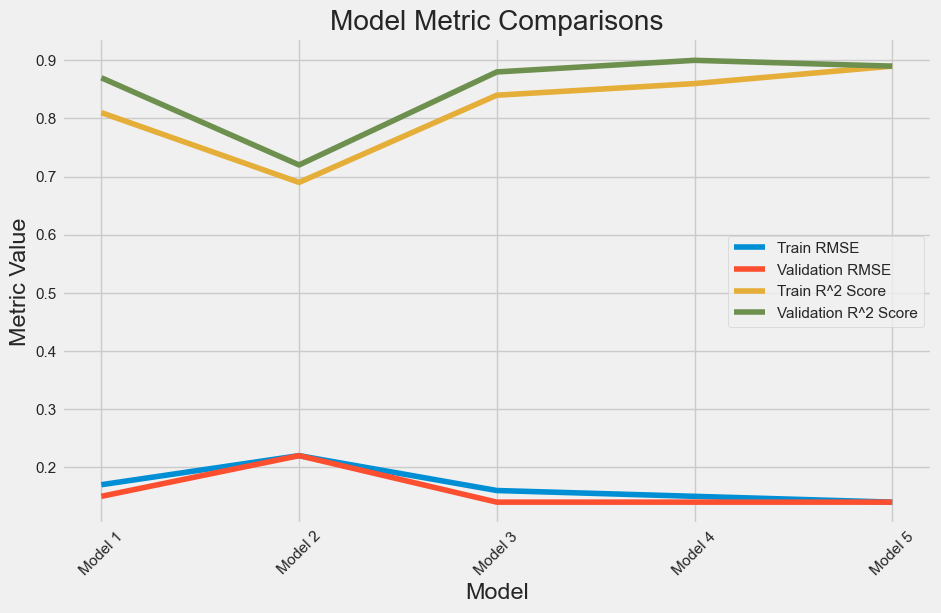

In [269]:
import matplotlib.pyplot as plt

# Define the model names
model_names = ['Model 1', 'Model 2', 'Model 3', 'Model 4', 'Model 5']

# Define the evaluation metrics
train_rmse = [0.17, 0.22, 0.16, 0.15, 0.14]
val_rmse = [0.15, 0.22, 0.14, 0.14, 0.14]
train_r2 = [0.81, 0.69, 0.84, 0.86, 0.89]
val_r2 = [0.87, 0.72, 0.88, 0.90, 0.89]

# Plotting the metrics
plt.figure(figsize=(10, 6))

plt.plot(model_names, train_rmse, label='Train RMSE')
plt.plot(model_names, val_rmse, label='Validation RMSE')
plt.plot(model_names, train_r2, label='Train R^2 Score')
plt.plot(model_names, val_r2, label='Validation R^2 Score')

plt.title('Model Metric Comparisons')
plt.xlabel('Model')
plt.ylabel('Metric Value')
plt.legend()
plt.xticks(rotation=45)

plt.show()


**Based on the above  results, the following conclusions can be drawn about the  five models I have built :**

**Model 1: Top 5 Correlated Numerical Features**

- It demonstrates good predictive performance with relatively low RMSE values for both the train and validation sets.
The R^2 score is high for both sets, indicating that the model explains a significant portion of the target variable's variance.
- The model exhibits consistent and relatively high cross-validation scores, suggesting good generalization ability.
- The most influential features for prediction are OverallQual (overall quality), GrLivArea (above-ground living area), and GarageCars (number of cars that can fit in the garage).

**Model 2: Top 5 Correlated Categorical Features**

- It exhibits lower predictive performance compared to Model 1, as indicated by higher RMSE values.
- The R^2 score is lower for both sets, indicating that the model explains less variance in the target variable compared to Model 1.
- The cross-validation scores, although consistent, are lower than those of Model 1, suggesting reduced generalization ability.
- The most influential features for prediction are Neighborhood_E (neighborhood type), ExterQual_E (exterior quality), BsmtQual_E (basement quality), and KitchenQual_E (kitchen quality).

**Model 3: Top 10 Correlated Features**

- It demonstrates comparable predictive performance to Model 1 with similar RMSE values.
- The R^2 score is high for both sets, indicating that the model explains a significant portion of the target variable's variance.
- The model exhibits consistent and relatively high cross-validation scores, suggesting good generalization ability.
- The most influential features for prediction include OverallQual (overall quality), Neighborhood_E (neighborhood type), GrLivArea (above-ground living area), and GarageCars (number of cars that can fit in the garage).

**Model 4: Top 10 Correlated Features + 2 New Features**

- It demonstrates comparable predictive performance to Model 3 with similar RMSE values.
- The R^2 score is slightly higher for both sets compared to Model 3, indicating a slightly better fit to the data.
- The model exhibits consistent and relatively high cross-validation scores, suggesting good generalization ability.
- The most influential features for prediction are similar to Model 3, including OverallQual (overall quality) and various categorical features related to neighborhood, kitchen, and garage.

**Model 5: Polynomial Model with 14 Features**

- It exhibits the best predictive performance among all models with the lowest RMSE values.
- The R^2 score is the highest among all models, indicating the highest explained variance in the target variable.
- The model exhibits consistent and relatively high cross-validation scores, suggesting excellent generalization ability.
- The most influential features for prediction include OverallQual (overall quality), GrLivArea (above-ground living area), and various other features related to neighborhood, kitchen, and garage.

Based on these conclusions, **Model 5 appears to be the best-performing model with the lowest RMSE, highest R^2 score, and strong generalization ability.** 
- However, Model 3 and Model 4 also show competitive performance. The choice between these models would depend on other factors such as complexity and interpretability. Model 2 performs relatively worse compared to the other models, indicating a need for further investigation into the feature selection or engineering methods used in this model.


**In summary, the analysis of the fove models reveals that a combination of various numeric and categorical features contributes to predicting the target variable with different levels of accuracy. Certain features consistently exhibit significant influence on the predictions, such as the overall quality of the property, the size of the living area, and the characteristics related to the neighborhood, kitchen, and garage. By recognizing these relationships, we can gain valuable insights into the key factors that determine the value of a property, enabling us to make more informed decisions.**

## Kaggle Submission

### User Name: YushVats

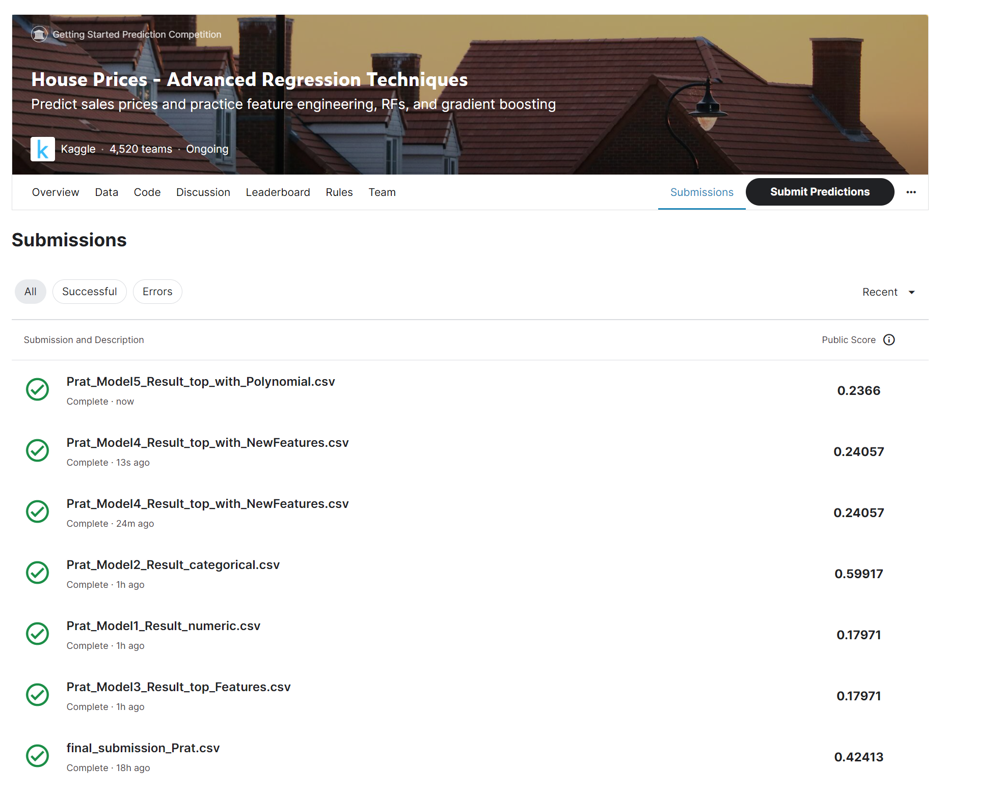